In [1]:
!pip install numpy==1.16.1

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import os
import cv2
from scipy import stats
from tqdm import tqdm
import csv
import pickle
import numpy as np


import pdb
import pprint

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, balanced_accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.cluster import DBSCAN
from sklearn.svm import LinearSVC, SVC
from sklearn.linear_model import SGDClassifier
from sklearn.kernel_approximation import RBFSampler
from sklearn.kernel_approximation import Nystroem

In [4]:
!pwd

/home/rahul


#### Main Class
- Currently we assume that there is no pose difference b/w ego vehicle base link and sensor frame

In [5]:
sku_namedict = {'Rocket-K': ['Kungfu', 'Wimberley 2.0', 'Cypress 2.1'],
                'Rocket-J': ['Jiujitsu', 'Sanya 1.5', 'Changhua 2.1'],
                'Gamora-J': ['Jiujitsu', 'Sanya 1.5', 'Nanyao'],
                'Gamora-K': ['Kungfu', 'Wimberley 1.0', 'Colorado'],
                'Quill-K': ['Kungfu', 'Wimberley 2.0', 'Pratt 1.1'],
                'Quill-L': ['Lethwei', 'Lockhart 1.0', 'Pratt 1.1-M', 'Pratt 1.1-P', 'Pratt 1.4-P'],                            
                'EVK': ['Jujitsu', 'Sanya 1.5', 'Groot Test Plate'],
                'Thanos': ['Kungfu', 'Wimberley 2.0', 'Congo'],
                'Drax': ['Kungfu', 'Wimberley 2.0', 'Pearl']    
                }

scan_names_master_list = ['VP104', 'VP104-alt', 'VP114U', 'CP101', 'VP105', 'VP112', 'VP110']


In [6]:
chip_rate_scaling_factor = 0.9563 # multiply it with chiprate to get effective chip rate
# the below scan_parameters_dict is for Rocket-K (NOTE: assumption below is num_txonchips accounts for tx_earlysquelch)
scan_parameters_dict = {'VP104': {'chiprate': 125, #Mcps
                                  'num_txonchips': 120,
                                  'num_rxonchips': 150,
                                  'start_rangebin': 50,
                                  'tx_early_squelch': 30, #chips
                                  'Fc': 76.5, #GHz
                                  'Npings_perPRI': 7,
                                  'Npings_perPRI_correlated': 6,
                                  'NumPRI': 630,
                                  'num_vrx': 48,
                                  'detection_thresh': 17, #dB
                                  'clutter_img_thresh': 10, #dB
                                  'pointcloud_thresh': 13
                                 },
                        'VP114U': {'2D': {'chiprate': 500, #Mcps
                                          'num_txonchips': 254,
                                          'num_rxonchips': 256,
                                          'start_rangebin': 2,
                                          'tx_early_squelch': 2, #chips
                                          'Fc': 76.6, #GHz
                                          'Npings_perPRI': 15,
                                          'Npings_perPRI_correlated': 15,
                                          'num_vrx': 48,
                                          'NumPRI': 630,
                                          'detection_thresh': 17, #dB
                                          'clutter_img_thresh': 10, #dB
                                          'pointcloud_thresh': 13
                                          },
                                   '3D': {'chiprate': 500, #Mcps
                                          'num_txonchips': 254,
                                          'num_rxonchips': 256,
                                          'start_rangebin': 2,
                                          'tx_early_squelch': 2, #chip
                                          'Fc': 76.6, #GHz
                                          'Npings_perPRI': 15,
                                          'Npings_perPRI_correlated': 15,
                                          'num_vrx': 96,
                                          'NumPRI': 630,
                                          'detection_thresh': 17, #dB
                                          'clutter_img_thresh': 10, #dB
                                          'pointcloud_thresh': 13
                                          },
                                  }
                        }

In [7]:
# below info is from https://uhnder.atlassian.net/wiki/spaces/PROJ/pages/2674491952/Specifications
antenna_gain_dict = {'Changhua': {'tx': 12.5, # dB
                                  'rx': 12.5  # dB
                                 },
                     'Cypress 1.1': {'tx': 12.5,
                                     'rx': 12.5
                                     },
                     'Cypress 2.1': {'tx': 12.5,
                                     'rx': 12.5
                                     },
                     'Pratt 1.4': {'tx': 11,
                                   'rx': 6
                                   },
                     'Pearl 2.0': {'tx': 21,
                                   'rx': 21
                                   },
                     'Brazos 1.0': {'tx': 12.5,
                                    'rx': 12.5
                                    },
                     'Brazos 2.0': {'tx': 12.5,
                                    'rx': 12.5
                                    },
                     'Congo 1.0': {'tx': 12.5,
                                    'rx': 12.5
                                    },
                     'Danube 1.0': {'tx': 12.5,
                                    'rx': 12.5
                                    },
                     'Cervelo MRR-1.0': {'tx': 10.1,
                                    'rx': 11.1
                                    },
                     'Cervelo LRR-1.0': {'tx': 15.6,
                                    'rx': 10.5
                                    }
                    }

In [8]:
pcb_losses_dict = {'Sanya 1.5': {'tx': 3.5,
                                 'rx': 3.7
                                },
                   'Wimberley 2.0': {'tx': 2.7,
                                     'rx': 3.0
                                    },
                   'Lockhart 1.0': {'tx': 2.5,
                                    'rx': 2.7
                                    },
                   'Lockhart 1.2': {'tx': 2.5,
                                    'rx': 2.7
                                    },
                   'Lockhart 1.8': {'tx': 2.5,
                                    'rx': 2.7
                                    },
                   'Frankfurt 1.0': {'tx': 2.5,
                                    'rx': 2.7
                                    },
                   'Frankfurt 2.0': {'tx': 2.0,
                                    'rx': 2.2
                                    },
                   'Frankfurt 2.1': {'tx': 2.5,
                                    'rx': 2.7
                                    },
                   'Vernier': {'tx': 2.0,
                               'rx': 2.0
                              },
                   'Cervelo': {'tx': 2.5,
                               'rx': 2.5
                               }
                   
                  }

In [9]:
system_loss_dict = {'SigProc': 3.6, #dB
                    'Radome': 0.5,  #dB 1 way loss
                    'Fascia': 0, # dB 1 way loss
                    'NF': 10 # dB
                   }
output_power_dict = {'VP': 10, #dBm
                     'CP': -6 #dBm
                     }

universal_constants_dict = {'speed_light': 3e8,
                            'thermal_noise_psd': -174 #dBm/Hz
                            }

In [ ]:
class Radar_Stats():
    
    mergedatadict_colname_to_index = {'timestamp': 0,
                                      'range': 1,
                                      'azimuth': 2,
                                      'elevation': 3,
                                      'doppler': 4,
                                      'snr': 5,
                                      'x': 6,
                                      'y': 7,
                                      'z': 8,
                                      'dopp_x': 9,
                                      'dopp_y': 10,
                                      'dopp_z': 11
                                       }
    
    lrrdatadict_colname_to_index = {'timestamp': 0,
                                    'range': 1,
                                    'azimuth': 2,
                                    'elevation': 3,
                                    'doppler': 4,
                                    'snr': 5,
                                    'x': 6,
                                    'y': 7,
                                    'z': 8,
                                    'dopp_x': 9,
                                    'dopp_y': 10,
                                    'dopp_z': 11
                                    }
    
    odomdatadict_colname_to_index = {'x': 0,
                                     'y': 1,
                                     'z': 2,
                                     'x_vel': 3,
                                     'y_vel': 4,
                                     'z_vel': 5,
                                     'roll': 6,
                                     'pitch': 7,
                                     'yaw': 8,
                                     'roll_rate': 9,
                                     'pitch_rate': 10,
                                     'yaw_rate': 11
                                     }
    
    clusterdatadict_colname_to_index = {'timestamp': 0,
                                        'clusterid': 1,
                                        'sensorid': 2,
                                        'range': 3,
                                        'azimuth': 4,
                                        'elevation': 5,
                                        'doppler': 6,
                                        'snr': 7,
                                        'x': 8,
                                        'y': 9,
                                        'z': 10,
                                        'dopp_x': 11,
                                        'dopp_y': 12,
                                        'dopp_z': 13
                                       }
    
    trackerdatadict_colname_to_index = {'timestamp': 0,
                                        'clusterid': 1,
                                        'sensorid': 2,
                                        'x': 3,
                                        'y': 4,
                                        'z': 5,
                                        'dopp_x': 6,
                                        'dopp_y': 7,
                                        'dopp_z': 8,
                                        'num_contrib': 9,
                                        'trackid': 10
                                        }
    
    trackermeasdatadict_colname_to_index = {'timestamp': 0,
                                        'clusterid': 1,
                                        'sensorid': 2,
                                        'range': 3,
                                        'azimuth': 4,
                                        'elevation': 5,
                                        'doppler': 6,
                                        'snr': 7,
                                        'x': 8,
                                        'y': 9,
                                        'z': 10,
                                        'dopp_x': 11,
                                        'dopp_y': 12,
                                        'dopp_z': 13,
                                        'trackid': 14
                                        }
    
    tfdatadict_colname_to_index = {'x': 0,
                                   'y': 1,
                                   'z': 2,
                                   'roll': 3,
                                   'pitch': 4,
                                   'yaw': 5
                                   }
    
    odomfile_colname_to_index = {'timestamp': 1,
                                 'x': 2,
                                 'y': 3,
                                 'z': 4,
                                 'x_vel': 5,
                                 'y_vel': 6,
                                 'z_vel': 7,
                                 'roll': 8,
                                 'pitch': 9,
                                 'yaw': 10,
                                 'roll_rate': 11,
                                 'pitch_rate': 12,
                                 'yaw_rate': 13
                                 }
    
    system_loss_dict = {'SigProc': 3.6, #dB
                        'Radome': 0.5,  #dB 1 way loss
                        'Fascia': 0, # dB 1 way loss
                        'NF': 10 # dB
                       }
    
    output_power_dict = {'VP': 10, #dBm
                         'CP': -6 #dBm
                        }

    universal_constants_dict = {'speed_light': 3e8,
                                'thermal_noise_psd': -174 #dBm/Hz
                               }
    
    classname_to_id_dict = {'BICYCLE': 0,
                            'BUS': 1,
                            'CAR': 2,
                            'PEDESTRIAN': 3,
                            'TRUCK': 4,
                            'TWOWHEELER': 5,
                            'CURB': 6,
                            'GAURDRAIL': 7,
                            'VEGETATION': 8,
                            'GROUNDBOUNCE': 9,
                            'MULTIPATH': 10,
                            'OTHERS': 11
                            
                           }
    
    label_id_to_class = {0: 'BICYCLE',
                         1: 'BUS',
                         2: 'CAR',
                         3: 'PEDESTRIAN',
                         4: 'TRUCK',
                         5: 'TWOWHEELER',
                         6: 'CURB',
                         7: 'GAURDRAIL',
                         8: 'VEGETATION',
                         9: 'GROUNDBOUNCE',
                         10: 'MULTIPATH',
                         11: 'OTHERS'
        
                        }
    
    label_id_to_colors = {0: 'red',
                          1: 'blue',
                          2: 'green',
                          3: 'yellow',
                          4: 'magenta',
                          5: 'cyan',
                          6: 'orange',
                          7: 'purple',
                          8: 'olive',
                          9: 'gray',
                          10: 'brown',
                          11: 'k'

                          }
    cls_id_cnt = {0: 0,
                  1: 0,
                  2: 0,
                  3: 0,
                  4: 0,
                  5: 0,
                  6: 0,
                  7: 0,
                  8: 0,
                  9: 0,
                  10: 0,
                  11: 0
                 }
        
        
    expected_scanid_skip = 3 # this number tells us that for the consecutive frames, the scanids for a particular scan 
                             # differ by this count 
    
    def __init__(self, datapath: str="./Mcw_data_check_1462/MOD1462", mod_name: str = "MOD-1462", history_len=1):
        '''
        datapath: root data folder path (inside this we will have all the logs data)
        mod_name: ID of module on which data is colected (for this excercise, we pick data only from Rocket-K module)
        history_len: number of scans to be jointly packed as one input (used if model needs to be trained using history also), 
                     value of 1 implies only current scan -> no history
                     
        '''
        self.datapath = datapath
        self.mod_name = mod_name
        self.history_len = history_len
        
        # get list of all directories
        #self.block_logs_list = ['OC07_Car_OC_00', 'OC07_Car_OC_10', 'OC07_Car_OC_20', 'OC07_Car_OC_40',\
        #                       'OC03_Car_C', 'OC03_Bike_C', 'OC06_Car_Bike_Ped_R', \
        #                       'OC06_Car_Bike_Ped_L', 'OC06_Car_Bike_Ped_C'] # temporary list as some files are missing
        self.block_logs_list = []
        #self.logs_dir = [d_ for d_ in os.listdir(self.datapath) if os.path.isdir(self.datapath + '/' + d_) \
        #                 and d_ not in self.block_logs_list]  # list
        #self.logs_dir = ['OC06_Car_Bike_Ped_R'] # 'OC04_Ped_C']# ['OC02_Car_C', 'OC02_Car_L']
        self.logs_dir = [d_ for d_ in os.listdir(self.datapath) if os.path.isdir(self.datapath + '/' + d_) \
                         and d_ not in self.block_logs_list] 
        
        # debug logs for rcs
        #self.rcs_ip_op = {}
        
        # top level dict
        #self.logs_dict : {'logname': {'classname': {'LRR': {'scanid': []},
        #                                            'MRR': {'scanid': []},
        #                                            'ClusterMeas': {'scanid': []},
        #                                            'TrackerMeas': {'scanid': []}
        #                                           }
        #                             }
        #                 }
        
               
        self.logs_dict = {}
        self._jsonify_logs_data()
        
    def read_odom_log(self, odom_filepath: str) -> dict:
        '''
        reads the odom.txt file
        '''
        fh = open(odom_filepath, 'r')
        Lines = fh.readlines()
        fh.close()

        odomdata_dict= {}
        cnt = 0
        for line in Lines:
            row = line.strip() # remove /n from the line
            row = row.split(",") # row is a list of str

            # row[1] (timestamp) is the key
            # mergedata_dict: {timestamp: [x,y,z, x_vel, y_vel, z_vel, roll, pitch, yaw, roll_rate, pitch_rate, yaw_rate]}
            #key = float(row[1]) # timestamp
            key = float(row[Radar_Stats.odomfile_colname_to_index['timestamp']])
            
            #payload_ = row[2::] # x,y,z, x_vel, y_vel, z_vel, roll, pitch, yaw, roll_rate, pitch_rate, yaw_rate
            payload_ = [row[Radar_Stats.odomfile_colname_to_index['x']],
                        row[Radar_Stats.odomfile_colname_to_index['y']],
                        row[Radar_Stats.odomfile_colname_to_index['z']],
                        row[Radar_Stats.odomfile_colname_to_index['x_vel']],
                        row[Radar_Stats.odomfile_colname_to_index['y_vel']],
                        row[Radar_Stats.odomfile_colname_to_index['z_vel']],
                        row[Radar_Stats.odomfile_colname_to_index['roll']],
                        row[Radar_Stats.odomfile_colname_to_index['pitch']],
                        row[Radar_Stats.odomfile_colname_to_index['yaw']],
                        row[Radar_Stats.odomfile_colname_to_index['roll_rate']],
                        row[Radar_Stats.odomfile_colname_to_index['pitch_rate']],
                        row[Radar_Stats.odomfile_colname_to_index['yaw_rate']]
                        ]
            payload = [float(x) for x in payload_]
            if key in odomdata_dict:
                odomdata_dict[key].append(payload)
                
            else:
                odomdata_dict[key] = []
                odomdata_dict[key].append(payload)

        return odomdata_dict
    
    def read_logfile(self, filename: str) -> dict:
        fh = open(filename, 'r')
        Lines = fh.readlines()
        fh.close()

        logfile_dict = {}
        scaninfo_dict = {}
        scaninfo_lines_at = []
        for num, line in enumerate(Lines):
            row = line.strip()
            # extract original filename in nas
            string = "Logger file"
            indx = row.find(string)    
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+5:]
            # extract ROS Node version
            string = "ROS Node version"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:]
            # extract RRA API version
            string = "Radar Remote API software version"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:]
            # extract SRS version
            string = "Sabine Radar Software version"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:]
            # extract MCU FW Version
            string = "MCU FW Version"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+4:]
            # extract Board Name/ID
            string = "Board Name/ID"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+2:]   
            # extract MOD_CFG
            string = "MOD_CFG"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+2:] 
            # extract Scan Preset
            string = "Scan Preset"
            indx = row.find(string)
            if indx != -1:
                if string in logfile_dict:
                    logfile_dict[string].append(row[indx+len(string)+1:])
                else:
                    logfile_dict[string] = [row[indx+len(string)+1:]]
            # extract Configured thresholds
            string = "Configured thresholds"
            indx = row.find(string)
            if indx != -1:
                if string in logfile_dict:
                    logfile_dict[string].append(row[indx+len(string)+1:])
                else:
                    logfile_dict[string] = [row[indx+len(string)+1:]]
            # extract carrier_frequency
            string = "carrier_frequency"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:] 
            # extract frame_interval
            string = "frame_interval"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:] 
            # extract antenna_config
            string = "antenna_config"
            indx = row.find(string)
            if indx != -1:
                logfile_dict[string] = row[indx+len(string)+1:]
            # find compose_one_scan() string in the row and log next few logs 
            if "compose_one_scan()" in row:
                scaninfo_lines_at.append(num+1)
                
                
        # find the scan names
        scan_names = []
        if 'Scan Preset' in logfile_dict:
            for elem in logfile_dict['Scan Preset']: # list
                for elem_master in scan_names_master_list:
                    idx = elem.find(elem_master)
                    if idx != -1:
                        break
                if idx != -1:
                    scan_names.append(elem_master) 

        # extract the SKU name
        mod_cfg = logfile_dict.get('MOD_CFG','None')
        print(f"mod_cfg: {mod_cfg}")
        skuname = 'Noname'
        if mod_cfg is not None:
            mod_cfg_key_values = mod_cfg.split('+')
            mod_cfg_key_values[0] = mod_cfg_key_values[0].split("~=")[0]    
            mod_cfg_key_values = [x.strip() for x in mod_cfg_key_values]
            #print(mod_cfg_key_values)
            cnt = 0
            for key,val in sku_namedict.items():
                for string in mod_cfg_key_values:
                    if string in mod_cfg_key_values:
                        cnt+=1
                if cnt == 3:
                    skuname = key
                    break
        print(skuname, scan_names)   

        # populate scaninfo_dict
        scaninfo_dict['skuname'] = skuname
        for item in set(scan_names):
            scaninfo_dict[item] = []
        #pprint.pprint(scaninfo_dict)

        for i,startlinenum in enumerate(scaninfo_lines_at):
            scan_config = []
            for line_num in range(startlinenum, startlinenum+10):
                string = Lines[line_num]
                indx = string.find('==  ')
                if indx != -1:
                    #print(indx, string[indx+4])
                    string = string[indx+4:].strip().split(",")
                    string = [x.strip() for x in string if x !='']
                    string = [x.split("=") for x in string]
                    key = string[0::2]
                    values = string[1::2]
                    scan_config.extend(string)
            scaninfo_dict[scan_names[i]].append(scan_config)
        #pprint.pprint(scaninfo_dict)

        scaninfo_dict_ = {}
        # initialize scaninfo_dict_
        for key, value in scaninfo_dict.items():
            if key in scan_names_master_list:
                scaninfo_dict_[key] = {}
            else:
                scaninfo_dict_[key] = value
        #pprint.pprint(scaninfo_dict_)
                
        for key, values in scaninfo_dict.items():
            if key in scan_names_master_list:
                if len(values)>1: # repeated SCAN as in 2D followed by 3D
                    for i,elem in enumerate(values): # elem is a list of list
                        if i==0:
                            inner_key = '2D'
                            if inner_key not in scaninfo_dict_[key]:
                                scaninfo_dict_[key][inner_key] = {}
                        elif i==1:
                            inner_key = '3D'
                            if inner_key not in scaninfo_dict_[key]:
                                scaninfo_dict_[key][inner_key] = {}
                        else:
                            raise 'Error: unknow key while parsing scan information from logs'
                            break
                        for elem_ in elem: # elem_ is a list
                            if len(elem_) == 2:
                                scaninfo_dict_[key][inner_key][elem_[0]] = elem_[1]
                            elif len(elem_) == 1:
                                scaninfo_dict_[key][inner_key]['chiprate'] = elem_[0]
                            else:
                                pass
                else:
                    values = values[0] # remove extra dimension
                    # now values is a list of list
                    for elem in values:
                        if len(elem) == 2:
                            scaninfo_dict_[key][elem[0]] = elem[1]
                        elif len(elem) == 1:
                            scaninfo_dict_[key]['chiprate'] = elem[0]
                        else:
                            pass
                    
            else:
                scaninfo_dict_[key] = values

        # get pcb_name, antenna_name
        #print(f"before, mod_cfg: {mod_cfg}")
        if mod_cfg is not None:
            pcb_name = mod_cfg.split("+")[-2].strip()
            ant_name = mod_cfg.split("+")[-1].strip()
        else:
            pcb_name = None
            ant_name = None
        print(pcb_name, ant_name)

        return logfile_dict, scaninfo_dict_, pcb_name, ant_name
        
    def _jsonify_logs_data(self):
        
        for logname in self.logs_dir: # iterate every log file
            annotation_dir_path = self.datapath + '/' + logname + '/' + 'annotated_data/' + self.mod_name
            class_dirs = [d_ for d_ in os.listdir(annotation_dir_path) if os.path.isdir(annotation_dir_path + '/' + d_)]
            #class_dirs = ['CAR']
            
            # read the odom data for this log
            odom_filepath = self.datapath + '/' + logname + '/' + '/' + 'odom.txt'
            odom_dict = self.read_odom_log(odom_filepath)
            
            # read logifle to figure out antenna name, pcb name etc..
            sensor_logfile = self.datapath + '/' + logname + '/' + 'sensor_logfile.txt'
            logfile_dict, scaninfo_dict_, pcb_name, ant_name = self.read_logfile(sensor_logfile)

            if logname not in self.logs_dict:
                self.logs_dict[logname] = {}

            for class_name in class_dirs: # iterate through every class folder
                all_files_list = os.listdir(annotation_dir_path + '/'+ class_name)
                #print(all_files_list)
                # update distribution counters
                Radar_Stats.cls_id_cnt[Radar_Stats.classname_to_id_dict[class_name]] += len(all_files_list)
                if class_name not in self.logs_dict[logname]:
                    self.logs_dict[logname][class_name] = {}

                for file in all_files_list:
                    scanid = int(file.split("_")[1])
                    #print(annotation_dir_path + '/'+ class_name + '/' + file)
                    if 'Merged' in file:
                        topicname = 'MRR'
                        #print("Found Merged topic")
                        if topicname not in self.logs_dict[logname][class_name]:
                            self.logs_dict[logname][class_name][topicname] = {}
                        if scanid not in self.logs_dict[logname][class_name][topicname]:
                            self.logs_dict[logname][class_name][topicname][scanid] = []
                        # add data present in the file scanid key
                        data = np.loadtxt(annotation_dir_path + '/'+ class_name + '/' + file)
                        #print(f"scanid: {scanid}, data len: {len(data)}")
                        #self.logs_dict[logname][class_name][topicname][scanid].append(data)
                        #print(f"-------log:{logname}, data:{data.shape}, file:{file}, ndim: {data.ndim}")
                        if data.ndim > 1: # reject annotation with a single point
                            data_final = self._prepare_data(data, topicname, odom_dict, pcb_name, ant_name, class_name)
                            #print(f"scanid: {scanid}, data_final len: {data_final.shape}")
                            self.logs_dict[logname][class_name][topicname][scanid].append(data_final)
                            #print(f"scanid: {scanid}, data_final: {data_final}")

                    elif 'LRR' in file:
                        topicname = 'LRR'
                        #print("Found LRR topic")
                        if topicname not in self.logs_dict[logname][class_name]:
                            self.logs_dict[logname][class_name][topicname] = {}
                        if scanid not in self.logs_dict[logname][class_name][topicname]:
                            self.logs_dict[logname][class_name][topicname][scanid] = []
                        # add data present in the file scanid key
                        data = np.loadtxt(annotation_dir_path + '/'+ class_name + '/' + file)
                        #self.logs_dict[logname][class_name][topicname][scanid].append(data)
                        if data.ndim > 1: # reject annotation with a single point
                            data_final = self._prepare_data(data, topicname, odom_dict, pcb_name, ant_name, class_name)
                            self.logs_dict[logname][class_name][topicname][scanid].append(data_final)

                    elif 'Cluster' in file:
                        topicname = 'Cluster'
                        #print("Found Cluster topic")
                        if topicname not in self.logs_dict[logname][class_name]:
                            self.logs_dict[logname][class_name][topicname] = {}
                        if scanid not in self.logs_dict[logname][class_name][topicname]:
                            self.logs_dict[logname][class_name][topicname][scanid] = []
                        # add data present in the file scanid key
                        data = np.loadtxt(annotation_dir_path + '/'+ class_name + '/' + file)
                        #self.logs_dict[logname][class_name][topicname][scanid].append(data)
                        if data.ndim > 1: # reject annotation with a single point
                            data_final = self._prepare_data(data, topicname, odom_dict, pcb_name, ant_name, class_name)
                            self.logs_dict[logname][class_name][topicname][scanid].append(data_final)

                    elif 'Tracker' in file:
                        topicname = 'Tracker'
                        #print("Found Tracker topic")
                        if topicname not in self.logs_dict[logname][class_name]:
                            self.logs_dict[logname][class_name][topicname] = {}
                        if scanid not in self.logs_dict[logname][class_name][topicname]:
                            self.logs_dict[logname][class_name][topicname][scanid] = []
                        # add data present in the file scanid key
                        data = np.loadtxt(annotation_dir_path + '/'+ class_name + '/' + file)
                        #self.logs_dict[logname][class_name][topicname][scanid].append(data)
                        if data.ndim > 1: # reject annotation with a single point
                            data_final = self._prepare_data(data, topicname, odom_dict, pcb_name, ant_name, class_name)
                            self.logs_dict[logname][class_name][topicname][scanid].append(data_final)

                    else:
                        topicname = 'None'
                        #print("Found None topic")
                        if topicname not in self.logs_dict[logname][class_name]:
                            self.logs_dict[logname][class_name][topicname] = {}
                        if scanid not in self.logs_dict[logname][class_name][topicname]:
                            self.logs_dict[logname][class_name][topicname][scanid] = []
                        # add data present in the file scanid key
                        data = np.loadtxt(annotation_dir_path + '/'+ class_name + '/' + file)
                        #self.logs_dict[logname][class_name][topicname][scanid].append(data)
                        if data.ndim > 1: # reject annotation with a single point
                            data_final = self._prepare_data(data, topicname, odom_dict, pcb_name, ant_name, class_name)
                            self.logs_dict[logname][class_name][topicname][scanid].append(data_final)
                        
        #print("Here..", len(radar_stats.logs_dict['OC02_Car_C']['CAR']['MRR'][164]))
                        
    def _prepare_data(self, data: list, topicname: str, odomdata: dict, pcb_name: str, ant_name: str, classname: str):
        '''
        prepares the data to be added to the overall dict
        <timestamp, range, az, el, doppler, doppler_ego_comp, snr, rcs,  label_id>
        '''
        if isinstance(data,list):
            data = np.array(data)
            
        if topicname == 'MRR':
            azimuth_deg = data[:, Radar_Stats.mergedatadict_colname_to_index['azimuth']]*180/np.pi 
            elevation_deg = data[:, Radar_Stats.mergedatadict_colname_to_index['elevation']]*180/np.pi
            doppler = data[:, Radar_Stats.mergedatadict_colname_to_index['doppler']]
            snr = data[:, Radar_Stats.mergedatadict_colname_to_index['snr']]
            ranges = data[:, Radar_Stats.mergedatadict_colname_to_index['range']]
            #rcs = self.compute_rcs(snr, ranges)
            rcs = self.compute_rcs(snr, ranges, pcb_name, ant_name, topicname)
            
            ## {{ Logging input/ouput of RCS compute for validating rcs c++ code
            #if 'range' not in self.rcs_ip_op:
            #    self.rcs_ip_op['range'] = ranges
            #    self.rcs_ip_op['snr'] = snr
            #    self.rcs_ip_op['rcs'] = rcs
            ##}}
            #rcs = np.zeros_like(ranges) # TBD
            
            # Sachin: attempting doppler w.r.t Ground
            timestamp_data = data[:, Radar_Stats.mergedatadict_colname_to_index['timestamp']]
            odomdata_keys = np.array(list(odomdata.keys()))
            #print(f"odom keys: {odomdata_keys}")
            odom_vel_vec = []
            for t_ in timestamp_data:
                indx = np.argmin(odomdata_keys - t_)
                current_odom_key = odomdata_keys[indx]
                
                odom_vel_x = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['x_vel']]
                odom_vel_y = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['y_vel']]
                odom_vel_z = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['z_vel']]
                odom_vel_vec.append([odom_vel_x, odom_vel_y, odom_vel_z])

            odom_vel_vec = np.array(odom_vel_vec)
            odom_dopp_at_angle = np.cos(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,0] + \
                                 np.sin(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,1] + \
                                 np.sin(elevation_deg*np.pi/180)*odom_vel_vec[:,2]
            doppler_comp = doppler + odom_dopp_at_angle
            
            az = azimuth_deg*np.pi/180
            el = elevation_deg*np.pi/180
            label_id = Radar_Stats.classname_to_id_dict[classname]*np.ones_like(az)
            data_final = np.hstack((timestamp_data[:,None], ranges[:,None], az[:,None], el[:,None], \
                                    doppler[:,None], doppler_comp[:,None], snr[:,None], rcs[:,None], label_id[:,None]))
            return data_final
        
        elif topicname == 'LRR':
            azimuth_deg = data[:, Radar_Stats.lrrdatadict_colname_to_index['azimuth']]*180/np.pi 
            elevation_deg = data[:, Radar_Stats.lrrdatadict_colname_to_index['elevation']]*180/np.pi
            doppler = data[:, Radar_Stats.lrrdatadict_colname_to_index['doppler']]
            snr = data[:, Radar_Stats.lrrdatadict_colname_to_index['snr']]
            ranges = data[:, Radar_Stats.lrrdatadict_colname_to_index['range']]
            #rcs = self.compute_rcs(snr, ranges)
            rcs = self.compute_rcs(snr, ranges, pcb_name, ant_name, topicname)
            #rcs = np.zeros_like(ranges) # TBD
            
            # Sachin: attempting doppler w.r.t Ground
            timestamp_data = data[:, Radar_Stats.lrrdatadict_colname_to_index['timestamp']]
            odomdata_keys = np.array(list(odomdata.keys()))
            #print(f"odom keys: {odomdata_keys}")
            odom_vel_vec = []
            for t_ in timestamp_data:
                indx = np.argmin(odomdata_keys - t_)
                current_odom_key = odomdata_keys[indx]
                
                odom_vel_x = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['x_vel']]
                odom_vel_y = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['y_vel']]
                odom_vel_z = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['z_vel']]
                odom_vel_vec.append([odom_vel_x, odom_vel_y, odom_vel_z])

            odom_vel_vec = np.array(odom_vel_vec)
            odom_dopp_at_angle = np.cos(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,0] + \
                                 np.sin(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,1] + \
                                 np.sin(elevation_deg*np.pi/180)*odom_vel_vec[:,2]
            doppler_comp = doppler + odom_dopp_at_angle
            
            az = azimuth_deg*np.pi/180
            el = elevation_deg*np.pi/180
            label_id = Radar_Stats.classname_to_id_dict[classname]*np.ones_like(az)
            data_final = np.hstack((timestamp_data[:,None], ranges[:,None], az[:,None], el[:,None], \
                                    doppler[:,None], doppler_comp[:,None], snr[:,None], rcs[:,None], label_id[:,None]))
            return data_final
        
        elif topicname =='Cluster':
            azimuth_deg = data[:, Radar_Stats.clusterdatadict_colname_to_index['azimuth']]*180/np.pi 
            elevation_deg = data[:, Radar_Stats.clusterdatadict_colname_to_index['elevation']]*180/np.pi
            doppler = data[:, Radar_Stats.clusterdatadict_colname_to_index['doppler']]
            snr = data[:, Radar_Stats.clusterdatadict_colname_to_index['snr']]
            ranges = data[:, Radar_Stats.clusterdatadict_colname_to_index['range']]
            #rcs = self.compute_rcs(snr, ranges)
            rcs = self.compute_rcs(snr, ranges, pcb_name, ant_name, topicname)
            #rcs = np.zeros_like(ranges) # TBD
            
            # Sachin: attempting doppler w.r.t Ground
            timestamp_data = data[:, Radar_Stats.clusterdatadict_colname_to_index['timestamp']]
            odomdata_keys = np.array(list(odomdata.keys()))
            #print(f"odom keys: {odomdata_keys}")
            odom_vel_vec = []
            for t_ in timestamp_data:
                indx = np.argmin(odomdata_keys - t_)
                current_odom_key = odomdata_keys[indx]
                
                odom_vel_x = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['x_vel']]
                odom_vel_y = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['y_vel']]
                odom_vel_z = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['z_vel']]
                odom_vel_vec.append([odom_vel_x, odom_vel_y, odom_vel_z])

            odom_vel_vec = np.array(odom_vel_vec)
            odom_dopp_at_angle = np.cos(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,0] + \
                                 np.sin(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,1] + \
                                 np.sin(elevation_deg*np.pi/180)*odom_vel_vec[:,2]
            doppler_comp = doppler + odom_dopp_at_angle
            
            az = azimuth_deg*np.pi/180
            el = elevation_deg*np.pi/180
            label_id = Radar_Stats.classname_to_id_dict[classname]*np.ones_like(az)
            data_final = np.hstack((timestamp_data[:,None], ranges[:,None], az[:,None], el[:,None], \
                                    doppler[:,None], doppler_comp[:,None], snr[:,None], rcs[:,None], label_id[:,None]))
            return data_final
        
        elif topicname == 'Tracker':
            azimuth_deg = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['azimuth']]*180/np.pi 
            elevation_deg = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['elevation']]*180/np.pi
            doppler = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['doppler']]
            snr = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['snr']]
            ranges = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['range']]
            #rcs = self.compute_rcs(snr, ranges)
            rcs = self.compute_rcs(snr, ranges, pcb_name, ant_name, topicname)
            #rcs = np.zeros_like(ranges) # TBD
            
            # Sachin: attempting doppler w.r.t Ground
            timestamp_data = data[:, Radar_Stats.trackermeasdatadict_colname_to_index['timestamp']]
            odomdata_keys = np.array(list(odomdata.keys()))
            #print(f"odom keys: {odomdata_keys}")
            odom_vel_vec = []
            for t_ in timestamp_data:
                indx = np.argmin(odomdata_keys - t_)
                current_odom_key = odomdata_keys[indx]
                
                odom_vel_x = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['x_vel']]
                odom_vel_y = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['y_vel']]
                odom_vel_z = odomdata[current_odom_key][0][Radar_Stats.odomdatadict_colname_to_index['z_vel']]
                odom_vel_vec.append([odom_vel_x, odom_vel_y, odom_vel_z])

            odom_vel_vec = np.array(odom_vel_vec)
            odom_dopp_at_angle = np.cos(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,0] + \
                                 np.sin(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,1] + \
                                 np.sin(elevation_deg*np.pi/180)*odom_vel_vec[:,2]
            doppler_comp = doppler + odom_dopp_at_angle
            
            az = azimuth_deg*np.pi/180
            el = elevation_deg*np.pi/180
            label_id = Radar_Stats.classname_to_id_dict[classname]*np.ones_like(az)
            data_final = np.hstack((timestamp_data[:,None], ranges[:,None], az[:,None], el[:,None], \
                                    doppler[:,None], doppler_comp[:,None], snr[:,None], rcs[:,None], label_id[:,None]))
            return data_final
        
    def compute_rcs(self, snr, ranges, pcb_name: str, ant_name: str, topicname: str):
        # compute expected RCS
               
        #1. get system loss
        sys_loss = system_loss_dict['SigProc'] + 2*system_loss_dict['Radome']\
                   + 2*system_loss_dict['Fascia'] + system_loss_dict['NF'] #dB

        #2. get pcb loss
        pcb_name_in_dict = pcb_losses_dict.get(pcb_name, None)
        if pcb_name in pcb_losses_dict:
            Loss_tx = pcb_losses_dict[pcb_name]['tx'] #dB
            Loss_rx = pcb_losses_dict[pcb_name]['rx'] #dB
            pcb_loss_dB =  Loss_tx + Loss_rx
        else:
            pcb_loss_dB = 0 #dB 
            Loss_tx = 0 #dB
            Loss_rx = 0 #dB
            print(f"pcb name not found in pcb_losses_dict, assuming 0dB loss for tx and rx ")

        #3. get antenna gain
        print(f"ant_name: {ant_name}")
        if ant_name in antenna_gain_dict:
            Gt = antenna_gain_dict[ant_name]['tx'] #dB
            Gr = antenna_gain_dict[ant_name]['rx'] #dB
            antenna_gain_dB = Gt + Gr
            print(f"Caution: assuming antenna gain is same for all scans on this sensor, please confirm!")
        else:
            antenna_gain_dB = 0 #dB
            Gt = 0 #dB
            Gr = 0 #dB
            print(f"antenna not found in antenna_gain_dict, assuming 0dB gain")

        #4. get output power
        op_power_dBm = output_power_dict['VP']
        print(f"Caution: assuming VP mode for all scans for rcs compuation!")

        #5. get PostProcGain
        
        if topicname == 'LRR':
            num_chips_rxon = scan_parameters_dict['VP104']['num_rxonchips']
            Npings_perPRI_correlated = scan_parameters_dict['VP104']['Npings_perPRI_correlated']
            NumPRI = scan_parameters_dict['VP104']['NumPRI']
            num_virtualRxs = scan_parameters_dict['VP104']['num_vrx']
            num_chips_txon = scan_parameters_dict['VP104']['num_txonchips']
            tx_early_squelch = scan_parameters_dict['VP104']['tx_early_squelch']
            eff_chiprate = 0.9563 * scan_parameters_dict['VP104']['chiprate'] #Mcps
            Fc = scan_parameters_dict['VP104']['Fc'] # GHz
            Tc = 1/(eff_chiprate) # usec
            Ping_tx = num_chips_txon*Tc # usec
            Ping_corr = num_chips_rxon*Tc #usec
            lambda_ = universal_constants_dict['speed_light']/(Fc*1e9) # meters
            
        elif topicname == 'MRR': # Caution!: assuming merge scan has same parameters for 2D and 3D scan
            num_chips_rxon = scan_parameters_dict['VP114U']['3D']['num_rxonchips']
            Npings_perPRI_correlated = scan_parameters_dict['VP114U']['3D']['Npings_perPRI_correlated']
            NumPRI = scan_parameters_dict['VP114U']['3D']['NumPRI']
            num_virtualRxs_3D = scan_parameters_dict['VP114U']['3D']['num_vrx']
            num_virtualRxs_2D = scan_parameters_dict['VP114U']['2D']['num_vrx']
            num_chips_txon = scan_parameters_dict['VP114U']['3D']['num_txonchips']
            tx_early_squelch = scan_parameters_dict['VP114U']['3D']['tx_early_squelch']
            eff_chiprate = 0.9563 * scan_parameters_dict['VP114U']['3D']['chiprate'] #Mcps
            Fc = scan_parameters_dict['VP114U']['3D']['Fc'] # GHz
            Tc = 1/(eff_chiprate) # usec
            Ping_tx = num_chips_txon*Tc # usec
            Ping_corr = num_chips_rxon*Tc #usec
            lambda_ = universal_constants_dict['speed_light']/(Fc*1e9) # meters
            
        else:
            return None
        #PostProcGain_fromRangeDim = Npings_perPRI_correlated*num_chips_rxon
        PostProcGain_fromDopplerDim = NumPRI
        # taking average gain of 2D and 3D for angle dimension since today we don't have flag to indicate from which 
        # VP114U-3D or VP114U-2D a given point is coming as a part of merged scan (don't know if average is right to take)
        PostProcGain_fromAngleDim = (num_virtualRxs_3D + num_virtualRxs_2D)/2 #num_virtualRxs
        #PostProcGain = PostProcGain_fromRangeDim*PostProcGain_fromDopplerDim*PostProcGain_fromAngleDim


        #6. get vp power scaling factor
        NF = system_loss_dict['NF'] #dB
        ThermalNoise_dBm = universal_constants_dict['thermal_noise_psd'] + 10*np.log10(eff_chiprate*1e6/2)
        Loss = 2*system_loss_dict['Radome'] + 2*system_loss_dict['Fascia'] + system_loss_dict['SigProc'] \
               + Loss_tx + Loss_rx
        lambda_ = universal_constants_dict['speed_light']/(scan_parameters_dict['VP114U']['3D']['Fc']*1e9)
        rcs = []
        range_res = universal_constants_dict['speed_light']*(Tc*1e-6)/2
        for idx, range_ in enumerate(list(ranges)):                           
            t_delay_orig = 2*ranges[idx]/universal_constants_dict['speed_light']
            #t_corr = t_delay_orig - tx_early_squelch*Tc*1e-6 # time for which correlation will happen per ping per PRI
            n_corr = np.round(range_/range_res - tx_early_squelch)
            t_corr = n_corr*Tc*1e-6
            if t_corr <= 0:
                SNR_dB[i] = -100
                numchips_correlated_perPing = 0
                continue
                
            #numchips_correlated_perPing = np.floor(t_corr/(Tc*1e-6))
            numchips_correlated_perPing = n_corr
            if numchips_correlated_perPing > (num_chips_rxon - tx_early_squelch):
                #numchips_correlated_perPing = (num_chips_rxon - tx_early_squelch) \
                #                              - (np.floor(t_corr/(Tc*1e-6))%(num_chips_rxon-tx_early_squelch))
                numchips_correlated_perPing = (num_chips_rxon - tx_early_squelch) \
                                          - (np.floor(n_corr)%(num_chips_rxon-tx_early_squelch))
                t_corr = numchips_correlated_perPing*Tc*1e-6
            
            PostProcGain_fromRangeDim = Npings_perPRI_correlated*numchips_correlated_perPing
            PostProcGain = PostProcGain_fromRangeDim*PostProcGain_fromDopplerDim*PostProcGain_fromAngleDim
            
            if t_delay_orig < Ping_tx*1e-6:
                vp_scalng_fac = 10*np.log10(t_corr) - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            elif t_delay_orig>= Ping_tx*1e-6 and t_delay_orig<Ping_corr*1e-6:
                vp_scalng_fac = 10*np.log10(Ping_tx*1e-6 - tx_early_squelch*Tc*1e-6) \
                                - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            else:
                vp_scalng_fac = 10*np.log10((Ping_tx+Ping_corr)*1e-6 - t_delay_orig - tx_early_squelch*Tc*1e-6) \
                               - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            
                        
            # uncalibrated RCS computation below (does not take into account calibrated antenna gains as a function of angles and boards)
            snr_without_rcs = op_power_dBm + Gt + Gr + 20*np.log10(lambda_) - 30*np.log10(4*np.pi)\
                              - ThermalNoise_dBm - Loss - NF -40*np.log10(ranges[idx]) \
                              + 10*np.log10(PostProcGain) + vp_scalng_fac
            
                      
            rcs_ = snr[idx] - snr_without_rcs
            
            rcs.append(rcs_)
            
            #{{ debug info
            #if 'range' not in self.rcs_ip_op:
            #    print(f"range: {ranges[idx]}, snr: {snr[idx]}, rcs: {rcs_}, ncorr: {n_corr} \
            #    , vp_scaling: {vp_scalng_fac}, PostProcGain: {10*np.log10(PostProcGain)}, \
            #    PostProcGainRange: {PostProcGain_fromRangeDim}, PostProcDopp: {PostProcGain_fromDopplerDim}, PostProcAng: {PostProcGain_fromAngleDim}")
            #}}

        return np.array(rcs)
                        
    def dataset_by_topic_classname(self, topicname: str, classname: str):
        
        if len(self.logs_dict) == 0: # empty
            return None
        
        entire_data = [] #<num_datapoints, ndarray> 
        entire_cam_img = []
        
        for logname,log_val in radar_stats.logs_dict.items(): #logname, class_dict
            print(f"---{logname}")
            cam_image_path = radar_stats.datapath + '/' + logname + '/' + 'CAM1/' 
            cam_image_files = [file for file in os.listdir(cam_image_path) if file.endswith(".jpg")]
            
            if topicname in log_val[classname]: # key exists
                scanid_list = np.sort(np.array(list(log_val[classname][topicname].keys())))   

                for curr_scanid in scanid_list[self.history_len-1:]: # advance by history_len in sorted array before starting
                    # set the expected imagefile for curr_scanid
                    expected_merge_img_file = str(curr_scanid) + ".jpg" # scanids in dumps are from merge topic
                    expected_lrr_img_file = str(curr_scanid+1) + ".jpg"
                    
                    # list of expected scanids to include history
                    expected_scanids = np.arange(curr_scanid, curr_scanid-self.history_len*Radar_Stats.expected_scanid_skip,\
                                                 -Radar_Stats.expected_scanid_skip)
                    # very first data for expected_scanids list
                    data_list = log_val[classname][topicname][expected_scanids[0]].copy() 
                    try:
                        data = np.array(data_list[0])
                    except IndexError as e:
                        continue
                    for elem in data_list[1:]:
                        elem = np.array(elem)
                        data = np.vstack((data,elem))

                    print(f"expected scanids: {expected_scanids}")
                    for i, sid in enumerate(expected_scanids):
                        if i==0: # skip this since already done outside the current loop for first element
                            print(f"i=0, current scan id: {sid}, data len: {data.shape}")
                            continue
                        
                        if sid not in scanid_list: # may happen that expected scan id is not in entire scanid list
                            continue
                        data_list_ = log_val[classname][topicname][sid]
                        try: # check if data_list is empty
                            data_ = np.array(data_list_[0])
                        except IndexError as e:
                            continue
                        for elem in data_list_[1:]:
                            elem = np.array(elem)
                            data_ = np.vstack((data_,elem))

                        #data.extend(data_) # extending to already existing list
                        data = np.vstack((data, data_))
                        print(f"current scan id: {sid}, data len: {data.shape}")
                    #print(data)    
                    entire_data.append(data) # appending instead of extending to add time dimension for history buffer
                    # add cam images
                    if expected_merge_img_file in cam_image_files:
                        entire_cam_img.append(radar_stats.datapath + '/' + logname + '/' + 'CAM1/' + \
                                              expected_merge_img_file)
                    elif expected_lrr_img_file in cam_image_files:
                        entire_cam_img.append(radar_stats.datapath + '/' + logname + '/' + 'CAM1/' + \
                                              expected_lrr_img_file)
                    else:
                        entire_cam_img.append(None)
                    #print(len(entire_data))

                #print(scanid_list)
                
        return entire_data, entire_cam_img
    
    def plot_data(self, data: list, img: list, index=None):
        '''
        data is a list of ndarray
        img is a list of image files for corresponding ndarray in data
        index: the index number corresponding to data list which we want to plot, if None randomly pick one
        plot the xy radar data along with the image for a index
        NOTE: index could mean for a given scanid but in case where history_len > 1, it would correspond to 
              the scanid of the last scan in that particular history_len chunk
        '''
        if index is None:
            index = np.random.choice(len(data))
            
        print(index)
        img_file = img[index] 
        data_ = data[index]
        
        #print(img_file)
        plt.figure()
        ax = plt.GridSpec(3, 3)
        ax.update(wspace=0.5, hspace=1.0)
        fig = plt.figure(figsize=(12,8))
        ax1 = plt.subplot2grid(shape=(3,3), loc=(0,0))
        ax2 = plt.subplot2grid(shape=(3,3), loc=(0,1))
        ax3 = plt.subplot2grid(shape=(3,3), loc=(0,2))
        ax4 = plt.subplot2grid(shape=(3,3), loc=(1,0))
        ax5 = plt.subplot2grid(shape=(3,3), loc=(1,1))
        ax6 = plt.subplot2grid(shape=(3,3), loc=(1,2))
        ax7 = plt.subplot2grid(shape=(3,3), loc=(2,0))
        ax8 = plt.subplot2grid(shape=(3,3), loc=(2,1))
        ax9 = plt.subplot2grid(shape=(3,3), loc=(2,2))
        fig.tight_layout()
        ax1.set_axis_off()

        # choose a timestamp
        # <timestamp, range, az, el, doppler, doppler_ego_comp, snr, rcs, label_id>
        #x_data_car = data_[:,0]
        #y_data_car = data_[:,1]
        r = data_[:,1]
        az = data_[:,2]
        el = data_[:,3]
        dopp = data_[:,5] # ego compensated
        snr = data_[:,6]
        rcs = data_[:,7]
        x_car, y_car, z_car, vx_car, vy_car, vz_car = self.polar_to_cartesian(r, dopp , az, el)
        
        labels = data_[:,-1].astype(int)
        if img_file is not None:
            ax1.imshow(cv2.imread(img_file)[:,:,::-1])
        color_ = [Radar_Stats.label_id_to_colors[c] for c in labels]
        ax2.scatter(y_car, x_car, c=color_)
        ax2.axis([-40,40,-15,100])
        ax2.invert_xaxis()
        ax2.set_yticks(np.arange(-10,100,10))
        ax2.grid(True)
        ax2.set_xlabel("y (m)")
        ax2.set_ylabel("x (m)")
        ax2.set_title("xy scatter")
        
        ax3.scatter(z_car, x_car)
        ax3.axis([-10,10,-15,100])
        ax3.set_xlabel(" z (m)")
        ax3.set_ylabel("x (m)")
        ax3.set_yticks(np.arange(-10,100,10))
        ax3.set_title("xz scatter")
        ax3.grid(True)
        
        ax4.scatter(np.arange(0,len(r)), r)
        ax4.set_ylim([-15,100])
        #ax4.set_xlabel(" point ")
        ax4.set_ylabel("range (m)")
        ax4.set_yticks(np.arange(-10,100,10))
        ax4.set_title("range scatter")
        ax4.grid(True)
        
        ax5.scatter(np.arange(0,len(az)), az*180/np.pi)
        ax5.set_ylim([-90,90])
        #ax5.set_xlabel(" point ")
        ax5.set_ylabel("azimuth (deg)")
        ax5.set_yticks(np.arange(-90,90,10))
        ax5.set_title("azimuth scatter")
        ax5.grid(True)
        
        ax6.scatter(np.arange(0,len(el)), el*180/np.pi)
        ax6.set_ylim([-10,10])
        #ax6.set_xlabel(" point ")
        ax6.set_ylabel("elevation (deg)")
        ax6.set_yticks(np.arange(-10,10,2))
        ax6.set_title("elevation scatter")
        ax6.grid(True)
        
        ax7.scatter(np.arange(0,len(dopp)), dopp)
        #ax7.set_ylim([-10,10])
        ax7.set_xlabel(" point ")
        ax7.set_ylabel("doppler (m/s)")
        #ax6.set_yticks(np.arange(-10,10,1))
        ax7.set_title("doppler ego comp scatter")
        ax7.grid(True)
        
        ax8.scatter(np.arange(0,len(snr)), snr)
        ax8.set_ylim([10,60])
        ax8.set_xlabel(" point ")
        ax8.set_ylabel("snr (dB)")
        ax8.set_yticks(np.arange(10,60,5))
        ax8.set_title("snr scatter")
        ax8.grid(True)
        
        ax9.scatter(np.arange(0,len(rcs)), rcs)
        ax9.set_ylim([-20,30])
        ax9.set_xlabel(" point ")
        ax9.set_ylabel("rcs (dBsm)")
        ax9.set_yticks(np.arange(-20,30,5))
        ax9.set_title("rcs uncalibrated scatter")
        ax9.grid(True)
            
        plt.grid(True)
        plt.show()
        
    def polar_to_cartesian(self, r: float, dopp: float, az: float, el: float) -> list:
        '''
        r: range in m
        az: azimuth angle in rad
        el: elevation angle in rad
        returns list of (x,y,z,vx,vy,vz) where x is forward, y is lateral and z i up-down
        '''
        x = r*np.cos(el)*np.cos(az)
        y = r*np.cos(el)*np.sin(az)
        z = r*np.sin(el)

        vx = dopp*np.cos(el)*np.cos(az)
        vy = dopp*np.cos(el)*np.sin(az)
        vz = dopp*np.sin(el)

        return [x, y, z, vx, vy, vz]
    
    def reset_class_distbns_counters(self):
        '''
        resets the class distribution counter dictionary values
        '''
        
        for k,v in Radar_Stats.cls_id_cnt.items():
            Radar_Stats.cls_id_cnt[k] = 0


In [ ]:
radar_stats = Radar_Stats(history_len=1)
fileobj = open('radar_stats.obj', 'wb')
pickle.dump(radar_stats, fileobj)
#pprint.pprint(radar_stats.logs_dict)

In [ ]:
type(radar_stats)

In [11]:
f = open("radar_stats.obj", 'rb')
radar_stats = pickle.load(f)

In [12]:
#radar_stats.rcs_ip_op

In [13]:
#radar_stats.rcs_ip_op['range'].shape

In [ ]:
# log names
radar_stats.logs_dict.values()

In [41]:
# fetch data for a particular topic, class (say MRR,CAR)
data,cam = radar_stats.dataset_by_topic_classname(topicname='MRR', classname='CAR')

---drive04_plaza_domain_rocketk_104_114u_2021-07-12-16-41-15_script
expected scanids: [326]
i=0, current scan id: 326, data len: (19, 9)
expected scanids: [329]
i=0, current scan id: 329, data len: (26, 9)
expected scanids: [341]
i=0, current scan id: 341, data len: (19, 9)
expected scanids: [344]
i=0, current scan id: 344, data len: (39, 9)
expected scanids: [347]
i=0, current scan id: 347, data len: (27, 9)
expected scanids: [350]
i=0, current scan id: 350, data len: (52, 9)
expected scanids: [353]
i=0, current scan id: 353, data len: (67, 9)
expected scanids: [356]
i=0, current scan id: 356, data len: (49, 9)
expected scanids: [359]
i=0, current scan id: 359, data len: (101, 9)
expected scanids: [362]
i=0, current scan id: 362, data len: (77, 9)
expected scanids: [371]
i=0, current scan id: 371, data len: (26, 9)
expected scanids: [374]
i=0, current scan id: 374, data len: (19, 9)
expected scanids: [377]
i=0, current scan id: 377, data len: (39, 9)
expected scanids: [380]
i=0, curre

expected scanids: [4628]
i=0, current scan id: 4628, data len: (52, 9)
expected scanids: [4631]
i=0, current scan id: 4631, data len: (71, 9)
expected scanids: [4634]
i=0, current scan id: 4634, data len: (37, 9)
expected scanids: [4637]
i=0, current scan id: 4637, data len: (27, 9)
expected scanids: [4640]
i=0, current scan id: 4640, data len: (46, 9)
expected scanids: [4643]
i=0, current scan id: 4643, data len: (58, 9)
expected scanids: [4646]
i=0, current scan id: 4646, data len: (69, 9)
expected scanids: [4649]
i=0, current scan id: 4649, data len: (48, 9)
expected scanids: [4652]
i=0, current scan id: 4652, data len: (53, 9)
expected scanids: [4655]
i=0, current scan id: 4655, data len: (71, 9)
expected scanids: [4658]
i=0, current scan id: 4658, data len: (46, 9)
expected scanids: [4661]
i=0, current scan id: 4661, data len: (32, 9)
expected scanids: [4664]
i=0, current scan id: 4664, data len: (57, 9)
expected scanids: [4667]
i=0, current scan id: 4667, data len: (24, 9)
---dri

expected scanids: [7475]
i=0, current scan id: 7475, data len: (224, 9)
expected scanids: [7478]
i=0, current scan id: 7478, data len: (159, 9)
expected scanids: [7481]
i=0, current scan id: 7481, data len: (239, 9)
expected scanids: [7484]
i=0, current scan id: 7484, data len: (304, 9)
expected scanids: [7487]
i=0, current scan id: 7487, data len: (242, 9)
expected scanids: [7490]
i=0, current scan id: 7490, data len: (236, 9)
expected scanids: [7493]
i=0, current scan id: 7493, data len: (329, 9)
expected scanids: [7496]
i=0, current scan id: 7496, data len: (140, 9)
expected scanids: [7499]
i=0, current scan id: 7499, data len: (382, 9)
expected scanids: [7502]
i=0, current scan id: 7502, data len: (229, 9)
expected scanids: [7505]
i=0, current scan id: 7505, data len: (297, 9)
expected scanids: [7508]
i=0, current scan id: 7508, data len: (323, 9)
expected scanids: [7511]
i=0, current scan id: 7511, data len: (379, 9)
expected scanids: [7514]
i=0, current scan id: 7514, data len: (

expected scanids: [14789]
i=0, current scan id: 14789, data len: (112, 9)
expected scanids: [14792]
i=0, current scan id: 14792, data len: (59, 9)
expected scanids: [14795]
i=0, current scan id: 14795, data len: (100, 9)
expected scanids: [14798]
i=0, current scan id: 14798, data len: (80, 9)
expected scanids: [14801]
i=0, current scan id: 14801, data len: (82, 9)
expected scanids: [14804]
i=0, current scan id: 14804, data len: (44, 9)
expected scanids: [14807]
i=0, current scan id: 14807, data len: (131, 9)
expected scanids: [14810]
i=0, current scan id: 14810, data len: (99, 9)
expected scanids: [14813]
i=0, current scan id: 14813, data len: (167, 9)
expected scanids: [14816]
i=0, current scan id: 14816, data len: (167, 9)
expected scanids: [14819]
i=0, current scan id: 14819, data len: (168, 9)
expected scanids: [14822]
i=0, current scan id: 14822, data len: (183, 9)
expected scanids: [14825]
i=0, current scan id: 14825, data len: (298, 9)
expected scanids: [14828]
i=0, current scan

expected scanids: [1460]
i=0, current scan id: 1460, data len: (169, 9)
expected scanids: [1463]
i=0, current scan id: 1463, data len: (128, 9)
expected scanids: [1466]
i=0, current scan id: 1466, data len: (248, 9)
expected scanids: [1469]
i=0, current scan id: 1469, data len: (491, 9)
expected scanids: [1472]
i=0, current scan id: 1472, data len: (198, 9)
expected scanids: [1475]
i=0, current scan id: 1475, data len: (284, 9)
expected scanids: [1478]
i=0, current scan id: 1478, data len: (276, 9)
expected scanids: [1481]
i=0, current scan id: 1481, data len: (355, 9)
expected scanids: [1484]
i=0, current scan id: 1484, data len: (482, 9)
expected scanids: [1487]
i=0, current scan id: 1487, data len: (608, 9)
expected scanids: [1490]
i=0, current scan id: 1490, data len: (479, 9)
expected scanids: [2288]
i=0, current scan id: 2288, data len: (48, 9)
expected scanids: [2291]
i=0, current scan id: 2291, data len: (39, 9)
expected scanids: [2294]
i=0, current scan id: 2294, data len: (58

expected scanids: [1880]
i=0, current scan id: 1880, data len: (1327, 9)
expected scanids: [1883]
i=0, current scan id: 1883, data len: (1525, 9)
expected scanids: [1886]
i=0, current scan id: 1886, data len: (1424, 9)
expected scanids: [1889]
i=0, current scan id: 1889, data len: (1513, 9)
expected scanids: [1892]
i=0, current scan id: 1892, data len: (1355, 9)
expected scanids: [1895]
i=0, current scan id: 1895, data len: (846, 9)
expected scanids: [1898]
i=0, current scan id: 1898, data len: (772, 9)
expected scanids: [1901]
i=0, current scan id: 1901, data len: (777, 9)
expected scanids: [1904]
i=0, current scan id: 1904, data len: (696, 9)
expected scanids: [1907]
i=0, current scan id: 1907, data len: (723, 9)
expected scanids: [1910]
i=0, current scan id: 1910, data len: (1344, 9)
expected scanids: [1913]
i=0, current scan id: 1913, data len: (1306, 9)
expected scanids: [1916]
i=0, current scan id: 1916, data len: (1752, 9)
expected scanids: [1919]
i=0, current scan id: 1919, dat

expected scanids: [821]
i=0, current scan id: 821, data len: (171, 9)
expected scanids: [824]
i=0, current scan id: 824, data len: (284, 9)
expected scanids: [827]
i=0, current scan id: 827, data len: (586, 9)
expected scanids: [830]
i=0, current scan id: 830, data len: (631, 9)
expected scanids: [833]
i=0, current scan id: 833, data len: (422, 9)
expected scanids: [836]
i=0, current scan id: 836, data len: (1302, 9)
expected scanids: [839]
i=0, current scan id: 839, data len: (1093, 9)
expected scanids: [842]
i=0, current scan id: 842, data len: (1378, 9)
expected scanids: [845]
i=0, current scan id: 845, data len: (1210, 9)
expected scanids: [848]
i=0, current scan id: 848, data len: (1326, 9)
expected scanids: [851]
i=0, current scan id: 851, data len: (888, 9)
expected scanids: [854]
i=0, current scan id: 854, data len: (929, 9)
expected scanids: [857]
i=0, current scan id: 857, data len: (1343, 9)
expected scanids: [860]
i=0, current scan id: 860, data len: (1188, 9)
expected scan

expected scanids: [2930]
i=0, current scan id: 2930, data len: (235, 9)
expected scanids: [2933]
i=0, current scan id: 2933, data len: (346, 9)
expected scanids: [2936]
i=0, current scan id: 2936, data len: (414, 9)
expected scanids: [2939]
i=0, current scan id: 2939, data len: (187, 9)
expected scanids: [2942]
i=0, current scan id: 2942, data len: (303, 9)
expected scanids: [2945]
i=0, current scan id: 2945, data len: (193, 9)
expected scanids: [2948]
i=0, current scan id: 2948, data len: (376, 9)
expected scanids: [2951]
i=0, current scan id: 2951, data len: (471, 9)
expected scanids: [2954]
i=0, current scan id: 2954, data len: (316, 9)
expected scanids: [2957]
i=0, current scan id: 2957, data len: (492, 9)
expected scanids: [2960]
i=0, current scan id: 2960, data len: (291, 9)
expected scanids: [2963]
i=0, current scan id: 2963, data len: (416, 9)
expected scanids: [2966]
i=0, current scan id: 2966, data len: (344, 9)
expected scanids: [2969]
i=0, current scan id: 2969, data len: (

expected scanids: [41318]
i=0, current scan id: 41318, data len: (62, 9)
expected scanids: [41321]
i=0, current scan id: 41321, data len: (39, 9)
expected scanids: [41324]
i=0, current scan id: 41324, data len: (22, 9)
expected scanids: [41327]
i=0, current scan id: 41327, data len: (44, 9)
expected scanids: [41330]
i=0, current scan id: 41330, data len: (33, 9)
expected scanids: [41333]
i=0, current scan id: 41333, data len: (25, 9)
expected scanids: [41336]
i=0, current scan id: 41336, data len: (62, 9)
expected scanids: [41339]
i=0, current scan id: 41339, data len: (47, 9)
expected scanids: [41342]
i=0, current scan id: 41342, data len: (19, 9)
expected scanids: [41345]
i=0, current scan id: 41345, data len: (25, 9)
expected scanids: [41348]
i=0, current scan id: 41348, data len: (24, 9)
expected scanids: [41351]
i=0, current scan id: 41351, data len: (25, 9)
expected scanids: [41354]
i=0, current scan id: 41354, data len: (42, 9)
expected scanids: [41357]
i=0, current scan id: 413

expected scanids: [39620]
i=0, current scan id: 39620, data len: (114, 9)
expected scanids: [39623]
i=0, current scan id: 39623, data len: (194, 9)
expected scanids: [39626]
i=0, current scan id: 39626, data len: (189, 9)
expected scanids: [39629]
i=0, current scan id: 39629, data len: (24, 9)
expected scanids: [39632]
i=0, current scan id: 39632, data len: (139, 9)
expected scanids: [39635]
i=0, current scan id: 39635, data len: (104, 9)
expected scanids: [39638]
i=0, current scan id: 39638, data len: (44, 9)
expected scanids: [39641]
i=0, current scan id: 39641, data len: (60, 9)
expected scanids: [39644]
i=0, current scan id: 39644, data len: (57, 9)
expected scanids: [39647]
i=0, current scan id: 39647, data len: (215, 9)
expected scanids: [39650]
i=0, current scan id: 39650, data len: (31, 9)
expected scanids: [39653]
i=0, current scan id: 39653, data len: (42, 9)
expected scanids: [39656]
i=0, current scan id: 39656, data len: (30, 9)
expected scanids: [39659]
i=0, current scan i

expected scanids: [3014]
i=0, current scan id: 3014, data len: (15, 9)
expected scanids: [3017]
i=0, current scan id: 3017, data len: (13, 9)
expected scanids: [3020]
i=0, current scan id: 3020, data len: (42, 9)
expected scanids: [3023]
i=0, current scan id: 3023, data len: (36, 9)
expected scanids: [3026]
i=0, current scan id: 3026, data len: (70, 9)
expected scanids: [3029]
i=0, current scan id: 3029, data len: (21, 9)
expected scanids: [3032]
i=0, current scan id: 3032, data len: (21, 9)
expected scanids: [3035]
i=0, current scan id: 3035, data len: (8, 9)
expected scanids: [3104]
i=0, current scan id: 3104, data len: (266, 9)
expected scanids: [3107]
i=0, current scan id: 3107, data len: (233, 9)
expected scanids: [3110]
i=0, current scan id: 3110, data len: (292, 9)
expected scanids: [3113]
i=0, current scan id: 3113, data len: (209, 9)
expected scanids: [3116]
i=0, current scan id: 3116, data len: (81, 9)
expected scanids: [3119]
i=0, current scan id: 3119, data len: (103, 9)
ex

expected scanids: [7088]
i=0, current scan id: 7088, data len: (177, 9)
expected scanids: [7091]
i=0, current scan id: 7091, data len: (223, 9)
expected scanids: [7094]
i=0, current scan id: 7094, data len: (367, 9)
expected scanids: [7097]
i=0, current scan id: 7097, data len: (248, 9)
expected scanids: [7100]
i=0, current scan id: 7100, data len: (238, 9)
expected scanids: [7103]
i=0, current scan id: 7103, data len: (165, 9)
expected scanids: [7106]
i=0, current scan id: 7106, data len: (349, 9)
expected scanids: [7109]
i=0, current scan id: 7109, data len: (272, 9)
expected scanids: [7112]
i=0, current scan id: 7112, data len: (254, 9)
expected scanids: [7115]
i=0, current scan id: 7115, data len: (191, 9)
expected scanids: [7118]
i=0, current scan id: 7118, data len: (423, 9)
expected scanids: [7121]
i=0, current scan id: 7121, data len: (104, 9)
expected scanids: [7124]
i=0, current scan id: 7124, data len: (240, 9)
expected scanids: [7127]
i=0, current scan id: 7127, data len: (

expected scanids: [12023]
i=0, current scan id: 12023, data len: (174, 9)
expected scanids: [12026]
i=0, current scan id: 12026, data len: (210, 9)
expected scanids: [12029]
i=0, current scan id: 12029, data len: (209, 9)
expected scanids: [12032]
i=0, current scan id: 12032, data len: (203, 9)
expected scanids: [12035]
i=0, current scan id: 12035, data len: (175, 9)
expected scanids: [12038]
i=0, current scan id: 12038, data len: (189, 9)
expected scanids: [12041]
i=0, current scan id: 12041, data len: (134, 9)
expected scanids: [12044]
i=0, current scan id: 12044, data len: (216, 9)
expected scanids: [12047]
i=0, current scan id: 12047, data len: (289, 9)
expected scanids: [12050]
i=0, current scan id: 12050, data len: (249, 9)
expected scanids: [12053]
i=0, current scan id: 12053, data len: (168, 9)
expected scanids: [12056]
i=0, current scan id: 12056, data len: (119, 9)
expected scanids: [12059]
i=0, current scan id: 12059, data len: (57, 9)
expected scanids: [12062]
i=0, current 

expected scanids: [14864]
i=0, current scan id: 14864, data len: (178, 9)
expected scanids: [14867]
i=0, current scan id: 14867, data len: (280, 9)
expected scanids: [14870]
i=0, current scan id: 14870, data len: (453, 9)
expected scanids: [14873]
i=0, current scan id: 14873, data len: (548, 9)
expected scanids: [14876]
i=0, current scan id: 14876, data len: (225, 9)
expected scanids: [14879]
i=0, current scan id: 14879, data len: (478, 9)
expected scanids: [14882]
i=0, current scan id: 14882, data len: (290, 9)
expected scanids: [14885]
i=0, current scan id: 14885, data len: (268, 9)
expected scanids: [14888]
i=0, current scan id: 14888, data len: (320, 9)
expected scanids: [14891]
i=0, current scan id: 14891, data len: (413, 9)
expected scanids: [14894]
i=0, current scan id: 14894, data len: (347, 9)
expected scanids: [14897]
i=0, current scan id: 14897, data len: (357, 9)
expected scanids: [14900]
i=0, current scan id: 14900, data len: (216, 9)
expected scanids: [14903]
i=0, current

expected scanids: [17306]
i=0, current scan id: 17306, data len: (463, 9)
expected scanids: [17309]
i=0, current scan id: 17309, data len: (373, 9)
expected scanids: [17312]
i=0, current scan id: 17312, data len: (345, 9)
expected scanids: [17315]
i=0, current scan id: 17315, data len: (392, 9)
expected scanids: [17318]
i=0, current scan id: 17318, data len: (420, 9)
expected scanids: [17321]
i=0, current scan id: 17321, data len: (308, 9)
expected scanids: [17324]
i=0, current scan id: 17324, data len: (268, 9)
expected scanids: [17327]
i=0, current scan id: 17327, data len: (382, 9)
expected scanids: [17330]
i=0, current scan id: 17330, data len: (262, 9)
expected scanids: [17333]
i=0, current scan id: 17333, data len: (158, 9)
expected scanids: [17336]
i=0, current scan id: 17336, data len: (183, 9)
expected scanids: [17339]
i=0, current scan id: 17339, data len: (182, 9)
expected scanids: [17342]
i=0, current scan id: 17342, data len: (498, 9)
expected scanids: [17345]
i=0, current

expected scanids: [19598]
i=0, current scan id: 19598, data len: (268, 9)
expected scanids: [19601]
i=0, current scan id: 19601, data len: (220, 9)
expected scanids: [19604]
i=0, current scan id: 19604, data len: (210, 9)
expected scanids: [19607]
i=0, current scan id: 19607, data len: (234, 9)
expected scanids: [19610]
i=0, current scan id: 19610, data len: (269, 9)
expected scanids: [19613]
i=0, current scan id: 19613, data len: (323, 9)
expected scanids: [19616]
i=0, current scan id: 19616, data len: (244, 9)
expected scanids: [19619]
i=0, current scan id: 19619, data len: (239, 9)
expected scanids: [19622]
i=0, current scan id: 19622, data len: (232, 9)
expected scanids: [19625]
i=0, current scan id: 19625, data len: (283, 9)
expected scanids: [19628]
i=0, current scan id: 19628, data len: (214, 9)
expected scanids: [19631]
i=0, current scan id: 19631, data len: (230, 9)
expected scanids: [19634]
i=0, current scan id: 19634, data len: (232, 9)
expected scanids: [19637]
i=0, current

expected scanids: [2369]
i=0, current scan id: 2369, data len: (68, 9)
expected scanids: [2372]
i=0, current scan id: 2372, data len: (62, 9)
expected scanids: [2375]
i=0, current scan id: 2375, data len: (63, 9)
expected scanids: [2378]
i=0, current scan id: 2378, data len: (57, 9)
expected scanids: [2381]
i=0, current scan id: 2381, data len: (63, 9)
expected scanids: [2384]
i=0, current scan id: 2384, data len: (61, 9)
expected scanids: [2387]
i=0, current scan id: 2387, data len: (65, 9)
expected scanids: [2390]
i=0, current scan id: 2390, data len: (62, 9)
expected scanids: [2393]
i=0, current scan id: 2393, data len: (64, 9)
expected scanids: [2396]
i=0, current scan id: 2396, data len: (60, 9)
expected scanids: [2399]
i=0, current scan id: 2399, data len: (58, 9)
expected scanids: [2402]
i=0, current scan id: 2402, data len: (58, 9)
expected scanids: [2405]
i=0, current scan id: 2405, data len: (63, 9)
expected scanids: [2408]
i=0, current scan id: 2408, data len: (64, 9)
expect

expected scanids: [3242]
i=0, current scan id: 3242, data len: (749, 9)
expected scanids: [3245]
i=0, current scan id: 3245, data len: (842, 9)
expected scanids: [3248]
i=0, current scan id: 3248, data len: (1030, 9)
expected scanids: [3251]
i=0, current scan id: 3251, data len: (839, 9)
expected scanids: [3254]
i=0, current scan id: 3254, data len: (525, 9)
expected scanids: [3257]
i=0, current scan id: 3257, data len: (668, 9)
expected scanids: [3260]
i=0, current scan id: 3260, data len: (579, 9)
expected scanids: [3263]
i=0, current scan id: 3263, data len: (464, 9)
expected scanids: [3266]
i=0, current scan id: 3266, data len: (420, 9)
expected scanids: [3269]
i=0, current scan id: 3269, data len: (636, 9)
expected scanids: [3272]
i=0, current scan id: 3272, data len: (344, 9)
expected scanids: [3275]
i=0, current scan id: 3275, data len: (595, 9)
expected scanids: [3278]
i=0, current scan id: 3278, data len: (358, 9)
expected scanids: [3281]
i=0, current scan id: 3281, data len: 

expected scanids: [5693]
i=0, current scan id: 5693, data len: (122, 9)
expected scanids: [5696]
i=0, current scan id: 5696, data len: (575, 9)
expected scanids: [5699]
i=0, current scan id: 5699, data len: (190, 9)
expected scanids: [5702]
i=0, current scan id: 5702, data len: (460, 9)
expected scanids: [5705]
i=0, current scan id: 5705, data len: (237, 9)
expected scanids: [5708]
i=0, current scan id: 5708, data len: (247, 9)
expected scanids: [5711]
i=0, current scan id: 5711, data len: (271, 9)
expected scanids: [5714]
i=0, current scan id: 5714, data len: (37, 9)
expected scanids: [5717]
i=0, current scan id: 5717, data len: (38, 9)
expected scanids: [5720]
i=0, current scan id: 5720, data len: (169, 9)
expected scanids: [5723]
i=0, current scan id: 5723, data len: (42, 9)
expected scanids: [5726]
i=0, current scan id: 5726, data len: (38, 9)
expected scanids: [5729]
i=0, current scan id: 5729, data len: (72, 9)
expected scanids: [5732]
i=0, current scan id: 5732, data len: (88, 9

expected scanids: [8465]
i=0, current scan id: 8465, data len: (21, 9)
expected scanids: [8468]
i=0, current scan id: 8468, data len: (38, 9)
expected scanids: [8471]
i=0, current scan id: 8471, data len: (67, 9)
expected scanids: [8474]
i=0, current scan id: 8474, data len: (57, 9)
expected scanids: [8477]
i=0, current scan id: 8477, data len: (104, 9)
expected scanids: [8480]
i=0, current scan id: 8480, data len: (184, 9)
expected scanids: [8483]
i=0, current scan id: 8483, data len: (205, 9)
expected scanids: [8486]
i=0, current scan id: 8486, data len: (173, 9)
expected scanids: [8489]
i=0, current scan id: 8489, data len: (157, 9)
expected scanids: [8492]
i=0, current scan id: 8492, data len: (151, 9)
expected scanids: [8495]
i=0, current scan id: 8495, data len: (195, 9)
expected scanids: [8498]
i=0, current scan id: 8498, data len: (95, 9)
expected scanids: [8501]
i=0, current scan id: 8501, data len: (254, 9)
expected scanids: [8504]
i=0, current scan id: 8504, data len: (242, 

expected scanids: [11198]
i=0, current scan id: 11198, data len: (374, 9)
expected scanids: [11201]
i=0, current scan id: 11201, data len: (292, 9)
expected scanids: [11204]
i=0, current scan id: 11204, data len: (500, 9)
expected scanids: [11207]
i=0, current scan id: 11207, data len: (342, 9)
expected scanids: [11210]
i=0, current scan id: 11210, data len: (461, 9)
expected scanids: [11213]
i=0, current scan id: 11213, data len: (368, 9)
expected scanids: [11216]
i=0, current scan id: 11216, data len: (301, 9)
expected scanids: [11219]
i=0, current scan id: 11219, data len: (261, 9)
expected scanids: [11222]
i=0, current scan id: 11222, data len: (194, 9)
expected scanids: [11225]
i=0, current scan id: 11225, data len: (426, 9)
expected scanids: [11228]
i=0, current scan id: 11228, data len: (308, 9)
expected scanids: [11231]
i=0, current scan id: 11231, data len: (181, 9)
expected scanids: [11234]
i=0, current scan id: 11234, data len: (289, 9)
expected scanids: [11237]
i=0, current

expected scanids: [19490]
i=0, current scan id: 19490, data len: (200, 9)
expected scanids: [19493]
i=0, current scan id: 19493, data len: (267, 9)
expected scanids: [19496]
i=0, current scan id: 19496, data len: (257, 9)
expected scanids: [19499]
i=0, current scan id: 19499, data len: (441, 9)
expected scanids: [19502]
i=0, current scan id: 19502, data len: (340, 9)
expected scanids: [19505]
i=0, current scan id: 19505, data len: (288, 9)
expected scanids: [19508]
i=0, current scan id: 19508, data len: (348, 9)
expected scanids: [19511]
i=0, current scan id: 19511, data len: (362, 9)
expected scanids: [19514]
i=0, current scan id: 19514, data len: (380, 9)
expected scanids: [19517]
i=0, current scan id: 19517, data len: (435, 9)
expected scanids: [19520]
i=0, current scan id: 19520, data len: (412, 9)
expected scanids: [19523]
i=0, current scan id: 19523, data len: (297, 9)
expected scanids: [19526]
i=0, current scan id: 19526, data len: (196, 9)
expected scanids: [19529]
i=0, current

expected scanids: [22040]
i=0, current scan id: 22040, data len: (119, 9)
expected scanids: [22043]
i=0, current scan id: 22043, data len: (125, 9)
expected scanids: [22046]
i=0, current scan id: 22046, data len: (78, 9)
expected scanids: [22049]
i=0, current scan id: 22049, data len: (73, 9)
expected scanids: [22076]
i=0, current scan id: 22076, data len: (199, 9)
expected scanids: [22079]
i=0, current scan id: 22079, data len: (344, 9)
expected scanids: [22082]
i=0, current scan id: 22082, data len: (147, 9)
expected scanids: [22085]
i=0, current scan id: 22085, data len: (214, 9)
expected scanids: [22088]
i=0, current scan id: 22088, data len: (325, 9)
expected scanids: [22091]
i=0, current scan id: 22091, data len: (133, 9)
expected scanids: [22094]
i=0, current scan id: 22094, data len: (130, 9)
expected scanids: [22097]
i=0, current scan id: 22097, data len: (178, 9)
expected scanids: [22100]
i=0, current scan id: 22100, data len: (197, 9)
expected scanids: [22103]
i=0, current s

expected scanids: [25109]
i=0, current scan id: 25109, data len: (407, 9)
expected scanids: [25112]
i=0, current scan id: 25112, data len: (252, 9)
expected scanids: [25115]
i=0, current scan id: 25115, data len: (163, 9)
expected scanids: [25118]
i=0, current scan id: 25118, data len: (321, 9)
expected scanids: [25121]
i=0, current scan id: 25121, data len: (284, 9)
expected scanids: [25124]
i=0, current scan id: 25124, data len: (304, 9)
expected scanids: [25127]
i=0, current scan id: 25127, data len: (162, 9)
expected scanids: [25130]
i=0, current scan id: 25130, data len: (172, 9)
expected scanids: [25133]
i=0, current scan id: 25133, data len: (199, 9)
expected scanids: [25136]
i=0, current scan id: 25136, data len: (355, 9)
expected scanids: [25139]
i=0, current scan id: 25139, data len: (284, 9)
expected scanids: [25142]
i=0, current scan id: 25142, data len: (403, 9)
expected scanids: [25145]
i=0, current scan id: 25145, data len: (283, 9)
expected scanids: [25148]
i=0, current

expected scanids: [26591]
i=0, current scan id: 26591, data len: (270, 9)
expected scanids: [26594]
i=0, current scan id: 26594, data len: (195, 9)
expected scanids: [26597]
i=0, current scan id: 26597, data len: (390, 9)
expected scanids: [26600]
i=0, current scan id: 26600, data len: (238, 9)
expected scanids: [26603]
i=0, current scan id: 26603, data len: (191, 9)
expected scanids: [26606]
i=0, current scan id: 26606, data len: (179, 9)
expected scanids: [26609]
i=0, current scan id: 26609, data len: (127, 9)
expected scanids: [26612]
i=0, current scan id: 26612, data len: (257, 9)
expected scanids: [26615]
i=0, current scan id: 26615, data len: (263, 9)
expected scanids: [26618]
i=0, current scan id: 26618, data len: (274, 9)
expected scanids: [26621]
i=0, current scan id: 26621, data len: (217, 9)
expected scanids: [26624]
i=0, current scan id: 26624, data len: (171, 9)
expected scanids: [26627]
i=0, current scan id: 26627, data len: (207, 9)
expected scanids: [26630]
i=0, current

expected scanids: [28784]
i=0, current scan id: 28784, data len: (588, 9)
expected scanids: [28787]
i=0, current scan id: 28787, data len: (489, 9)
expected scanids: [28790]
i=0, current scan id: 28790, data len: (1471, 9)
expected scanids: [28793]
i=0, current scan id: 28793, data len: (728, 9)
expected scanids: [28796]
i=0, current scan id: 28796, data len: (653, 9)
expected scanids: [28799]
i=0, current scan id: 28799, data len: (761, 9)
expected scanids: [28802]
i=0, current scan id: 28802, data len: (656, 9)
expected scanids: [28805]
i=0, current scan id: 28805, data len: (911, 9)
expected scanids: [28808]
i=0, current scan id: 28808, data len: (572, 9)
expected scanids: [28811]
i=0, current scan id: 28811, data len: (478, 9)
expected scanids: [28814]
i=0, current scan id: 28814, data len: (363, 9)
expected scanids: [28817]
i=0, current scan id: 28817, data len: (559, 9)
expected scanids: [28820]
i=0, current scan id: 28820, data len: (792, 9)
expected scanids: [28823]
i=0, curren

expected scanids: [9992]
i=0, current scan id: 9992, data len: (591, 9)
expected scanids: [9995]
i=0, current scan id: 9995, data len: (471, 9)
expected scanids: [9998]
i=0, current scan id: 9998, data len: (642, 9)
expected scanids: [10001]
i=0, current scan id: 10001, data len: (643, 9)
expected scanids: [10004]
i=0, current scan id: 10004, data len: (598, 9)
expected scanids: [10007]
i=0, current scan id: 10007, data len: (364, 9)
expected scanids: [10010]
i=0, current scan id: 10010, data len: (362, 9)
expected scanids: [10013]
i=0, current scan id: 10013, data len: (245, 9)
expected scanids: [10016]
i=0, current scan id: 10016, data len: (339, 9)
expected scanids: [10019]
i=0, current scan id: 10019, data len: (376, 9)
expected scanids: [10022]
i=0, current scan id: 10022, data len: (509, 9)
expected scanids: [10025]
i=0, current scan id: 10025, data len: (517, 9)
expected scanids: [10028]
i=0, current scan id: 10028, data len: (405, 9)
expected scanids: [10031]
i=0, current scan 

expected scanids: [11561]
i=0, current scan id: 11561, data len: (549, 9)
expected scanids: [11564]
i=0, current scan id: 11564, data len: (620, 9)
expected scanids: [11567]
i=0, current scan id: 11567, data len: (559, 9)
expected scanids: [11570]
i=0, current scan id: 11570, data len: (435, 9)
expected scanids: [11573]
i=0, current scan id: 11573, data len: (632, 9)
expected scanids: [11576]
i=0, current scan id: 11576, data len: (545, 9)
expected scanids: [11579]
i=0, current scan id: 11579, data len: (714, 9)
expected scanids: [11582]
i=0, current scan id: 11582, data len: (708, 9)
expected scanids: [11585]
i=0, current scan id: 11585, data len: (663, 9)
expected scanids: [11588]
i=0, current scan id: 11588, data len: (477, 9)
expected scanids: [11591]
i=0, current scan id: 11591, data len: (502, 9)
expected scanids: [11594]
i=0, current scan id: 11594, data len: (454, 9)
expected scanids: [11597]
i=0, current scan id: 11597, data len: (687, 9)
expected scanids: [11600]
i=0, current

expected scanids: [14291]
i=0, current scan id: 14291, data len: (364, 9)
expected scanids: [14294]
i=0, current scan id: 14294, data len: (418, 9)
expected scanids: [14297]
i=0, current scan id: 14297, data len: (540, 9)
expected scanids: [14300]
i=0, current scan id: 14300, data len: (565, 9)
expected scanids: [14303]
i=0, current scan id: 14303, data len: (313, 9)
expected scanids: [14306]
i=0, current scan id: 14306, data len: (47, 9)
expected scanids: [14309]
i=0, current scan id: 14309, data len: (691, 9)
expected scanids: [14312]
i=0, current scan id: 14312, data len: (340, 9)
expected scanids: [14315]
i=0, current scan id: 14315, data len: (472, 9)
expected scanids: [14318]
i=0, current scan id: 14318, data len: (599, 9)
expected scanids: [14321]
i=0, current scan id: 14321, data len: (282, 9)
expected scanids: [14324]
i=0, current scan id: 14324, data len: (61, 9)
expected scanids: [14327]
i=0, current scan id: 14327, data len: (57, 9)
expected scanids: [14330]
i=0, current sc

expected scanids: [16991]
i=0, current scan id: 16991, data len: (543, 9)
expected scanids: [16994]
i=0, current scan id: 16994, data len: (695, 9)
expected scanids: [16997]
i=0, current scan id: 16997, data len: (400, 9)
expected scanids: [17000]
i=0, current scan id: 17000, data len: (475, 9)
expected scanids: [17003]
i=0, current scan id: 17003, data len: (689, 9)
expected scanids: [17006]
i=0, current scan id: 17006, data len: (561, 9)
expected scanids: [17009]
i=0, current scan id: 17009, data len: (334, 9)
expected scanids: [17012]
i=0, current scan id: 17012, data len: (237, 9)
expected scanids: [17015]
i=0, current scan id: 17015, data len: (583, 9)
expected scanids: [17018]
i=0, current scan id: 17018, data len: (323, 9)
expected scanids: [17021]
i=0, current scan id: 17021, data len: (304, 9)
expected scanids: [17024]
i=0, current scan id: 17024, data len: (360, 9)
expected scanids: [17027]
i=0, current scan id: 17027, data len: (243, 9)
expected scanids: [17030]
i=0, current

expected scanids: [7271]
i=0, current scan id: 7271, data len: (585, 9)
expected scanids: [7274]
i=0, current scan id: 7274, data len: (328, 9)
expected scanids: [7277]
i=0, current scan id: 7277, data len: (203, 9)
expected scanids: [7280]
i=0, current scan id: 7280, data len: (446, 9)
expected scanids: [7283]
i=0, current scan id: 7283, data len: (466, 9)
expected scanids: [7286]
i=0, current scan id: 7286, data len: (374, 9)
expected scanids: [7289]
i=0, current scan id: 7289, data len: (408, 9)
expected scanids: [7292]
i=0, current scan id: 7292, data len: (376, 9)
expected scanids: [7295]
i=0, current scan id: 7295, data len: (411, 9)
expected scanids: [7298]
i=0, current scan id: 7298, data len: (502, 9)
expected scanids: [7301]
i=0, current scan id: 7301, data len: (365, 9)
expected scanids: [7304]
i=0, current scan id: 7304, data len: (250, 9)
expected scanids: [7307]
i=0, current scan id: 7307, data len: (218, 9)
expected scanids: [7310]
i=0, current scan id: 7310, data len: (

expected scanids: [9782]
i=0, current scan id: 9782, data len: (105, 9)
expected scanids: [9785]
i=0, current scan id: 9785, data len: (86, 9)
expected scanids: [9788]
i=0, current scan id: 9788, data len: (64, 9)
expected scanids: [9791]
i=0, current scan id: 9791, data len: (73, 9)
expected scanids: [9794]
i=0, current scan id: 9794, data len: (84, 9)
expected scanids: [9797]
i=0, current scan id: 9797, data len: (125, 9)
expected scanids: [9800]
i=0, current scan id: 9800, data len: (100, 9)
expected scanids: [9803]
i=0, current scan id: 9803, data len: (91, 9)
expected scanids: [9806]
i=0, current scan id: 9806, data len: (66, 9)
expected scanids: [9809]
i=0, current scan id: 9809, data len: (103, 9)
expected scanids: [9812]
i=0, current scan id: 9812, data len: (120, 9)
expected scanids: [9815]
i=0, current scan id: 9815, data len: (467, 9)
expected scanids: [9818]
i=0, current scan id: 9818, data len: (407, 9)
expected scanids: [9821]
i=0, current scan id: 9821, data len: (611, 9

expected scanids: [11942]
i=0, current scan id: 11942, data len: (598, 9)
expected scanids: [11945]
i=0, current scan id: 11945, data len: (461, 9)
expected scanids: [11948]
i=0, current scan id: 11948, data len: (431, 9)
expected scanids: [11951]
i=0, current scan id: 11951, data len: (444, 9)
expected scanids: [11954]
i=0, current scan id: 11954, data len: (489, 9)
expected scanids: [11957]
i=0, current scan id: 11957, data len: (357, 9)
expected scanids: [11960]
i=0, current scan id: 11960, data len: (447, 9)
expected scanids: [11963]
i=0, current scan id: 11963, data len: (492, 9)
expected scanids: [11966]
i=0, current scan id: 11966, data len: (480, 9)
expected scanids: [11969]
i=0, current scan id: 11969, data len: (489, 9)
expected scanids: [11972]
i=0, current scan id: 11972, data len: (626, 9)
expected scanids: [11975]
i=0, current scan id: 11975, data len: (451, 9)
expected scanids: [11978]
i=0, current scan id: 11978, data len: (435, 9)
expected scanids: [11981]
i=0, current

expected scanids: [13586]
i=0, current scan id: 13586, data len: (646, 9)
expected scanids: [13589]
i=0, current scan id: 13589, data len: (648, 9)
expected scanids: [13592]
i=0, current scan id: 13592, data len: (612, 9)
expected scanids: [13595]
i=0, current scan id: 13595, data len: (876, 9)
expected scanids: [13598]
i=0, current scan id: 13598, data len: (621, 9)
expected scanids: [13601]
i=0, current scan id: 13601, data len: (875, 9)
expected scanids: [13604]
i=0, current scan id: 13604, data len: (859, 9)
expected scanids: [13607]
i=0, current scan id: 13607, data len: (1143, 9)
expected scanids: [13610]
i=0, current scan id: 13610, data len: (324, 9)
expected scanids: [13613]
i=0, current scan id: 13613, data len: (565, 9)
expected scanids: [13616]
i=0, current scan id: 13616, data len: (430, 9)
expected scanids: [13619]
i=0, current scan id: 13619, data len: (390, 9)
expected scanids: [13622]
i=0, current scan id: 13622, data len: (424, 9)
expected scanids: [13625]
i=0, curren

expected scanids: [2501]
i=0, current scan id: 2501, data len: (154, 9)
expected scanids: [2504]
i=0, current scan id: 2504, data len: (202, 9)
expected scanids: [2507]
i=0, current scan id: 2507, data len: (86, 9)
expected scanids: [2510]
i=0, current scan id: 2510, data len: (177, 9)
expected scanids: [2513]
i=0, current scan id: 2513, data len: (174, 9)
expected scanids: [2516]
i=0, current scan id: 2516, data len: (145, 9)
expected scanids: [2519]
i=0, current scan id: 2519, data len: (237, 9)
expected scanids: [2522]
i=0, current scan id: 2522, data len: (266, 9)
expected scanids: [2525]
i=0, current scan id: 2525, data len: (79, 9)
expected scanids: [2528]
i=0, current scan id: 2528, data len: (138, 9)
expected scanids: [2531]
i=0, current scan id: 2531, data len: (251, 9)
expected scanids: [2534]
i=0, current scan id: 2534, data len: (135, 9)
expected scanids: [2537]
i=0, current scan id: 2537, data len: (208, 9)
expected scanids: [2540]
i=0, current scan id: 2540, data len: (14

expected scanids: [5675]
i=0, current scan id: 5675, data len: (89, 9)
expected scanids: [5678]
i=0, current scan id: 5678, data len: (65, 9)
expected scanids: [5681]
i=0, current scan id: 5681, data len: (205, 9)
expected scanids: [5684]
i=0, current scan id: 5684, data len: (42, 9)
expected scanids: [5687]
i=0, current scan id: 5687, data len: (104, 9)
expected scanids: [5690]
i=0, current scan id: 5690, data len: (148, 9)
expected scanids: [5693]
i=0, current scan id: 5693, data len: (78, 9)
expected scanids: [5696]
i=0, current scan id: 5696, data len: (42, 9)
expected scanids: [5699]
i=0, current scan id: 5699, data len: (144, 9)
expected scanids: [5702]
i=0, current scan id: 5702, data len: (79, 9)
expected scanids: [5705]
i=0, current scan id: 5705, data len: (195, 9)
expected scanids: [5708]
i=0, current scan id: 5708, data len: (254, 9)
expected scanids: [5711]
i=0, current scan id: 5711, data len: (52, 9)
expected scanids: [5714]
i=0, current scan id: 5714, data len: (66, 9)


expected scanids: [46499]
i=0, current scan id: 46499, data len: (144, 9)
expected scanids: [46502]
i=0, current scan id: 46502, data len: (102, 9)
expected scanids: [46505]
i=0, current scan id: 46505, data len: (129, 9)
expected scanids: [46508]
i=0, current scan id: 46508, data len: (132, 9)
expected scanids: [46511]
i=0, current scan id: 46511, data len: (389, 9)
expected scanids: [46514]
i=0, current scan id: 46514, data len: (386, 9)
expected scanids: [46517]
i=0, current scan id: 46517, data len: (289, 9)
expected scanids: [46520]
i=0, current scan id: 46520, data len: (252, 9)
expected scanids: [46523]
i=0, current scan id: 46523, data len: (192, 9)
expected scanids: [46526]
i=0, current scan id: 46526, data len: (166, 9)
expected scanids: [46529]
i=0, current scan id: 46529, data len: (332, 9)
expected scanids: [46532]
i=0, current scan id: 46532, data len: (283, 9)
expected scanids: [46535]
i=0, current scan id: 46535, data len: (217, 9)
expected scanids: [46538]
i=0, current

expected scanids: [2624]
i=0, current scan id: 2624, data len: (68, 9)
expected scanids: [2627]
i=0, current scan id: 2627, data len: (57, 9)
expected scanids: [2630]
i=0, current scan id: 2630, data len: (67, 9)
expected scanids: [2633]
i=0, current scan id: 2633, data len: (61, 9)
expected scanids: [2636]
i=0, current scan id: 2636, data len: (52, 9)
expected scanids: [2639]
i=0, current scan id: 2639, data len: (52, 9)
expected scanids: [2642]
i=0, current scan id: 2642, data len: (55, 9)
expected scanids: [2645]
i=0, current scan id: 2645, data len: (67, 9)
expected scanids: [2648]
i=0, current scan id: 2648, data len: (69, 9)
expected scanids: [2651]
i=0, current scan id: 2651, data len: (54, 9)
expected scanids: [2654]
i=0, current scan id: 2654, data len: (63, 9)
expected scanids: [2657]
i=0, current scan id: 2657, data len: (58, 9)
expected scanids: [2660]
i=0, current scan id: 2660, data len: (60, 9)
expected scanids: [2663]
i=0, current scan id: 2663, data len: (62, 9)
expect

expected scanids: [2072]
i=0, current scan id: 2072, data len: (53, 9)
expected scanids: [2075]
i=0, current scan id: 2075, data len: (64, 9)
expected scanids: [2078]
i=0, current scan id: 2078, data len: (45, 9)
expected scanids: [2081]
i=0, current scan id: 2081, data len: (78, 9)
expected scanids: [2084]
i=0, current scan id: 2084, data len: (54, 9)
expected scanids: [2087]
i=0, current scan id: 2087, data len: (58, 9)
expected scanids: [2090]
i=0, current scan id: 2090, data len: (48, 9)
expected scanids: [2093]
i=0, current scan id: 2093, data len: (66, 9)
expected scanids: [2096]
i=0, current scan id: 2096, data len: (55, 9)
expected scanids: [2099]
i=0, current scan id: 2099, data len: (70, 9)
expected scanids: [2102]
i=0, current scan id: 2102, data len: (56, 9)
expected scanids: [2105]
i=0, current scan id: 2105, data len: (61, 9)
expected scanids: [2108]
i=0, current scan id: 2108, data len: (48, 9)
expected scanids: [2111]
i=0, current scan id: 2111, data len: (49, 9)
expect

expected scanids: [4073]
i=0, current scan id: 4073, data len: (99, 9)
expected scanids: [4076]
i=0, current scan id: 4076, data len: (113, 9)
expected scanids: [4082]
i=0, current scan id: 4082, data len: (58, 9)
expected scanids: [4085]
i=0, current scan id: 4085, data len: (47, 9)
expected scanids: [4088]
i=0, current scan id: 4088, data len: (33, 9)
expected scanids: [4091]
i=0, current scan id: 4091, data len: (39, 9)
expected scanids: [4094]
i=0, current scan id: 4094, data len: (38, 9)
expected scanids: [4100]
i=0, current scan id: 4100, data len: (56, 9)
expected scanids: [4103]
i=0, current scan id: 4103, data len: (49, 9)
expected scanids: [4106]
i=0, current scan id: 4106, data len: (56, 9)
expected scanids: [4109]
i=0, current scan id: 4109, data len: (83, 9)
expected scanids: [4112]
i=0, current scan id: 4112, data len: (35, 9)
expected scanids: [4115]
i=0, current scan id: 4115, data len: (26, 9)
expected scanids: [4118]
i=0, current scan id: 4118, data len: (28, 9)
expec

expected scanids: [19949]
i=0, current scan id: 19949, data len: (221, 9)
expected scanids: [19952]
i=0, current scan id: 19952, data len: (196, 9)
expected scanids: [19955]
i=0, current scan id: 19955, data len: (163, 9)
expected scanids: [19958]
i=0, current scan id: 19958, data len: (210, 9)
expected scanids: [19961]
i=0, current scan id: 19961, data len: (308, 9)
expected scanids: [19964]
i=0, current scan id: 19964, data len: (334, 9)
expected scanids: [19967]
i=0, current scan id: 19967, data len: (132, 9)
expected scanids: [19970]
i=0, current scan id: 19970, data len: (134, 9)
expected scanids: [19973]
i=0, current scan id: 19973, data len: (123, 9)
expected scanids: [19976]
i=0, current scan id: 19976, data len: (250, 9)
expected scanids: [19979]
i=0, current scan id: 19979, data len: (344, 9)
expected scanids: [19982]
i=0, current scan id: 19982, data len: (313, 9)
expected scanids: [19985]
i=0, current scan id: 19985, data len: (302, 9)
expected scanids: [19988]
i=0, current

expected scanids: [22724]
i=0, current scan id: 22724, data len: (307, 9)
expected scanids: [22727]
i=0, current scan id: 22727, data len: (207, 9)
expected scanids: [22730]
i=0, current scan id: 22730, data len: (127, 9)
expected scanids: [22733]
i=0, current scan id: 22733, data len: (139, 9)
expected scanids: [22736]
i=0, current scan id: 22736, data len: (229, 9)
expected scanids: [22739]
i=0, current scan id: 22739, data len: (303, 9)
expected scanids: [22742]
i=0, current scan id: 22742, data len: (211, 9)
expected scanids: [22745]
i=0, current scan id: 22745, data len: (148, 9)
expected scanids: [22748]
i=0, current scan id: 22748, data len: (89, 9)
expected scanids: [22751]
i=0, current scan id: 22751, data len: (290, 9)
expected scanids: [22754]
i=0, current scan id: 22754, data len: (224, 9)
expected scanids: [22757]
i=0, current scan id: 22757, data len: (221, 9)
expected scanids: [22760]
i=0, current scan id: 22760, data len: (209, 9)
expected scanids: [22763]
i=0, current 

expected scanids: [25259]
i=0, current scan id: 25259, data len: (196, 9)
expected scanids: [25262]
i=0, current scan id: 25262, data len: (227, 9)
expected scanids: [25265]
i=0, current scan id: 25265, data len: (129, 9)
expected scanids: [25268]
i=0, current scan id: 25268, data len: (133, 9)
expected scanids: [25271]
i=0, current scan id: 25271, data len: (115, 9)
expected scanids: [25274]
i=0, current scan id: 25274, data len: (271, 9)
expected scanids: [25277]
i=0, current scan id: 25277, data len: (210, 9)
expected scanids: [25280]
i=0, current scan id: 25280, data len: (113, 9)
expected scanids: [25283]
i=0, current scan id: 25283, data len: (233, 9)
expected scanids: [25286]
i=0, current scan id: 25286, data len: (237, 9)
expected scanids: [25289]
i=0, current scan id: 25289, data len: (215, 9)
expected scanids: [25292]
i=0, current scan id: 25292, data len: (114, 9)
expected scanids: [25295]
i=0, current scan id: 25295, data len: (126, 9)
expected scanids: [25298]
i=0, current

expected scanids: [5651]
i=0, current scan id: 5651, data len: (101, 9)
expected scanids: [5654]
i=0, current scan id: 5654, data len: (113, 9)
expected scanids: [5657]
i=0, current scan id: 5657, data len: (31, 9)
expected scanids: [5660]
i=0, current scan id: 5660, data len: (23, 9)
expected scanids: [5663]
i=0, current scan id: 5663, data len: (35, 9)
expected scanids: [5666]
i=0, current scan id: 5666, data len: (43, 9)
expected scanids: [5669]
i=0, current scan id: 5669, data len: (31, 9)
expected scanids: [5672]
i=0, current scan id: 5672, data len: (39, 9)
expected scanids: [5675]
i=0, current scan id: 5675, data len: (77, 9)
expected scanids: [5678]
i=0, current scan id: 5678, data len: (188, 9)
expected scanids: [5681]
i=0, current scan id: 5681, data len: (81, 9)
expected scanids: [5684]
i=0, current scan id: 5684, data len: (71, 9)
expected scanids: [5687]
i=0, current scan id: 5687, data len: (62, 9)
expected scanids: [5690]
i=0, current scan id: 5690, data len: (63, 9)
exp

expected scanids: [893]
i=0, current scan id: 893, data len: (339, 9)
expected scanids: [896]
i=0, current scan id: 896, data len: (431, 9)
expected scanids: [899]
i=0, current scan id: 899, data len: (649, 9)
expected scanids: [902]
i=0, current scan id: 902, data len: (346, 9)
expected scanids: [905]
i=0, current scan id: 905, data len: (450, 9)
expected scanids: [908]
i=0, current scan id: 908, data len: (400, 9)
expected scanids: [911]
i=0, current scan id: 911, data len: (408, 9)
expected scanids: [914]
i=0, current scan id: 914, data len: (218, 9)
expected scanids: [917]
i=0, current scan id: 917, data len: (234, 9)
expected scanids: [920]
i=0, current scan id: 920, data len: (252, 9)
expected scanids: [923]
i=0, current scan id: 923, data len: (226, 9)
expected scanids: [926]
i=0, current scan id: 926, data len: (279, 9)
expected scanids: [929]
i=0, current scan id: 929, data len: (539, 9)
expected scanids: [932]
i=0, current scan id: 932, data len: (647, 9)
expected scanids: [9

expected scanids: [2645]
i=0, current scan id: 2645, data len: (50, 9)
expected scanids: [2648]
i=0, current scan id: 2648, data len: (46, 9)
expected scanids: [2651]
i=0, current scan id: 2651, data len: (48, 9)
expected scanids: [2654]
i=0, current scan id: 2654, data len: (35, 9)
expected scanids: [2657]
i=0, current scan id: 2657, data len: (57, 9)
expected scanids: [2660]
i=0, current scan id: 2660, data len: (49, 9)
expected scanids: [2663]
i=0, current scan id: 2663, data len: (47, 9)
expected scanids: [2666]
i=0, current scan id: 2666, data len: (47, 9)
expected scanids: [2669]
i=0, current scan id: 2669, data len: (44, 9)
expected scanids: [2672]
i=0, current scan id: 2672, data len: (46, 9)
expected scanids: [2675]
i=0, current scan id: 2675, data len: (47, 9)
expected scanids: [2678]
i=0, current scan id: 2678, data len: (47, 9)
expected scanids: [2681]
i=0, current scan id: 2681, data len: (45, 9)
expected scanids: [2684]
i=0, current scan id: 2684, data len: (46, 9)
expect

expected scanids: [5780]
i=0, current scan id: 5780, data len: (591, 9)
expected scanids: [5783]
i=0, current scan id: 5783, data len: (713, 9)
expected scanids: [5786]
i=0, current scan id: 5786, data len: (731, 9)
expected scanids: [5789]
i=0, current scan id: 5789, data len: (637, 9)
expected scanids: [5792]
i=0, current scan id: 5792, data len: (596, 9)
expected scanids: [5795]
i=0, current scan id: 5795, data len: (483, 9)
expected scanids: [5798]
i=0, current scan id: 5798, data len: (437, 9)
expected scanids: [5801]
i=0, current scan id: 5801, data len: (498, 9)
expected scanids: [5804]
i=0, current scan id: 5804, data len: (547, 9)
expected scanids: [5807]
i=0, current scan id: 5807, data len: (147, 9)
expected scanids: [5810]
i=0, current scan id: 5810, data len: (268, 9)
expected scanids: [5813]
i=0, current scan id: 5813, data len: (440, 9)
expected scanids: [5816]
i=0, current scan id: 5816, data len: (502, 9)
expected scanids: [5819]
i=0, current scan id: 5819, data len: (

expected scanids: [7853]
i=0, current scan id: 7853, data len: (108, 9)
expected scanids: [7856]
i=0, current scan id: 7856, data len: (111, 9)
expected scanids: [7859]
i=0, current scan id: 7859, data len: (75, 9)
expected scanids: [7862]
i=0, current scan id: 7862, data len: (42, 9)
expected scanids: [7865]
i=0, current scan id: 7865, data len: (80, 9)
expected scanids: [7868]
i=0, current scan id: 7868, data len: (51, 9)
expected scanids: [7871]
i=0, current scan id: 7871, data len: (60, 9)
expected scanids: [7874]
i=0, current scan id: 7874, data len: (68, 9)
expected scanids: [7877]
i=0, current scan id: 7877, data len: (40, 9)
expected scanids: [7880]
i=0, current scan id: 7880, data len: (72, 9)
expected scanids: [7883]
i=0, current scan id: 7883, data len: (48, 9)
expected scanids: [7886]
i=0, current scan id: 7886, data len: (85, 9)
expected scanids: [7889]
i=0, current scan id: 7889, data len: (92, 9)
expected scanids: [7892]
i=0, current scan id: 7892, data len: (151, 9)
exp

expected scanids: [2312]
i=0, current scan id: 2312, data len: (51, 9)
expected scanids: [2315]
i=0, current scan id: 2315, data len: (56, 9)
expected scanids: [2318]
i=0, current scan id: 2318, data len: (214, 9)
expected scanids: [2321]
i=0, current scan id: 2321, data len: (104, 9)
expected scanids: [2324]
i=0, current scan id: 2324, data len: (177, 9)
expected scanids: [2327]
i=0, current scan id: 2327, data len: (70, 9)
expected scanids: [2330]
i=0, current scan id: 2330, data len: (78, 9)
expected scanids: [2333]
i=0, current scan id: 2333, data len: (144, 9)
expected scanids: [2336]
i=0, current scan id: 2336, data len: (214, 9)
expected scanids: [2339]
i=0, current scan id: 2339, data len: (202, 9)
expected scanids: [2342]
i=0, current scan id: 2342, data len: (148, 9)
expected scanids: [2345]
i=0, current scan id: 2345, data len: (364, 9)
expected scanids: [2348]
i=0, current scan id: 2348, data len: (85, 9)
expected scanids: [2351]
i=0, current scan id: 2351, data len: (115, 

expected scanids: [7016]
i=0, current scan id: 7016, data len: (33, 9)
expected scanids: [7019]
i=0, current scan id: 7019, data len: (54, 9)
expected scanids: [7076]
i=0, current scan id: 7076, data len: (15, 9)
expected scanids: [7079]
i=0, current scan id: 7079, data len: (20, 9)
expected scanids: [7082]
i=0, current scan id: 7082, data len: (78, 9)
expected scanids: [7085]
i=0, current scan id: 7085, data len: (29, 9)
expected scanids: [7088]
i=0, current scan id: 7088, data len: (52, 9)
expected scanids: [7121]
i=0, current scan id: 7121, data len: (24, 9)
expected scanids: [7124]
i=0, current scan id: 7124, data len: (32, 9)
expected scanids: [7130]
i=0, current scan id: 7130, data len: (34, 9)
expected scanids: [7142]
i=0, current scan id: 7142, data len: (22, 9)
expected scanids: [7145]
i=0, current scan id: 7145, data len: (14, 9)
expected scanids: [7148]
i=0, current scan id: 7148, data len: (19, 9)
expected scanids: [7151]
i=0, current scan id: 7151, data len: (17, 9)
expect

expected scanids: [3554]
i=0, current scan id: 3554, data len: (162, 9)
expected scanids: [3557]
i=0, current scan id: 3557, data len: (97, 9)
expected scanids: [3560]
i=0, current scan id: 3560, data len: (74, 9)
expected scanids: [3563]
i=0, current scan id: 3563, data len: (90, 9)
expected scanids: [3566]
i=0, current scan id: 3566, data len: (104, 9)
expected scanids: [3569]
i=0, current scan id: 3569, data len: (43, 9)
expected scanids: [3572]
i=0, current scan id: 3572, data len: (119, 9)
expected scanids: [3575]
i=0, current scan id: 3575, data len: (30, 9)
expected scanids: [3578]
i=0, current scan id: 3578, data len: (93, 9)
expected scanids: [3581]
i=0, current scan id: 3581, data len: (96, 9)
expected scanids: [3584]
i=0, current scan id: 3584, data len: (184, 9)
expected scanids: [3587]
i=0, current scan id: 3587, data len: (165, 9)
expected scanids: [3590]
i=0, current scan id: 3590, data len: (189, 9)
expected scanids: [3593]
i=0, current scan id: 3593, data len: (102, 9)

expected scanids: [34406]
i=0, current scan id: 34406, data len: (772, 9)
expected scanids: [34409]
i=0, current scan id: 34409, data len: (512, 9)
expected scanids: [34412]
i=0, current scan id: 34412, data len: (465, 9)
expected scanids: [34415]
i=0, current scan id: 34415, data len: (523, 9)
expected scanids: [34418]
i=0, current scan id: 34418, data len: (611, 9)
expected scanids: [34421]
i=0, current scan id: 34421, data len: (758, 9)
expected scanids: [34424]
i=0, current scan id: 34424, data len: (841, 9)
expected scanids: [34427]
i=0, current scan id: 34427, data len: (610, 9)
expected scanids: [34430]
i=0, current scan id: 34430, data len: (554, 9)
expected scanids: [34433]
i=0, current scan id: 34433, data len: (654, 9)
expected scanids: [34436]
i=0, current scan id: 34436, data len: (809, 9)
expected scanids: [34439]
i=0, current scan id: 34439, data len: (738, 9)
expected scanids: [34442]
i=0, current scan id: 34442, data len: (464, 9)
expected scanids: [34445]
i=0, current

expected scanids: [36098]
i=0, current scan id: 36098, data len: (586, 9)
expected scanids: [36101]
i=0, current scan id: 36101, data len: (433, 9)
expected scanids: [36104]
i=0, current scan id: 36104, data len: (368, 9)
expected scanids: [36107]
i=0, current scan id: 36107, data len: (395, 9)
expected scanids: [36110]
i=0, current scan id: 36110, data len: (381, 9)
expected scanids: [36113]
i=0, current scan id: 36113, data len: (503, 9)
expected scanids: [36116]
i=0, current scan id: 36116, data len: (450, 9)
expected scanids: [36119]
i=0, current scan id: 36119, data len: (457, 9)
expected scanids: [36122]
i=0, current scan id: 36122, data len: (228, 9)
expected scanids: [36125]
i=0, current scan id: 36125, data len: (259, 9)
expected scanids: [36128]
i=0, current scan id: 36128, data len: (168, 9)
expected scanids: [36131]
i=0, current scan id: 36131, data len: (210, 9)
expected scanids: [36134]
i=0, current scan id: 36134, data len: (195, 9)
expected scanids: [36137]
i=0, current

expected scanids: [3410]
i=0, current scan id: 3410, data len: (727, 9)
expected scanids: [3413]
i=0, current scan id: 3413, data len: (745, 9)
expected scanids: [3416]
i=0, current scan id: 3416, data len: (587, 9)
expected scanids: [3419]
i=0, current scan id: 3419, data len: (445, 9)
expected scanids: [3422]
i=0, current scan id: 3422, data len: (596, 9)
expected scanids: [3425]
i=0, current scan id: 3425, data len: (609, 9)
expected scanids: [3428]
i=0, current scan id: 3428, data len: (584, 9)
expected scanids: [3431]
i=0, current scan id: 3431, data len: (711, 9)
expected scanids: [3434]
i=0, current scan id: 3434, data len: (512, 9)
expected scanids: [3437]
i=0, current scan id: 3437, data len: (603, 9)
expected scanids: [3440]
i=0, current scan id: 3440, data len: (520, 9)
expected scanids: [3443]
i=0, current scan id: 3443, data len: (727, 9)
expected scanids: [3449]
i=0, current scan id: 3449, data len: (552, 9)
expected scanids: [3452]
i=0, current scan id: 3452, data len: (

expected scanids: [5999]
i=0, current scan id: 5999, data len: (118, 9)
expected scanids: [6002]
i=0, current scan id: 6002, data len: (242, 9)
expected scanids: [6005]
i=0, current scan id: 6005, data len: (167, 9)
expected scanids: [6029]
i=0, current scan id: 6029, data len: (235, 9)
expected scanids: [6032]
i=0, current scan id: 6032, data len: (302, 9)
expected scanids: [6035]
i=0, current scan id: 6035, data len: (236, 9)
expected scanids: [6038]
i=0, current scan id: 6038, data len: (311, 9)
expected scanids: [6149]
i=0, current scan id: 6149, data len: (504, 9)
expected scanids: [6152]
i=0, current scan id: 6152, data len: (418, 9)
expected scanids: [6155]
i=0, current scan id: 6155, data len: (649, 9)
expected scanids: [6158]
i=0, current scan id: 6158, data len: (532, 9)
expected scanids: [6161]
i=0, current scan id: 6161, data len: (392, 9)
expected scanids: [6164]
i=0, current scan id: 6164, data len: (171, 9)
expected scanids: [6167]
i=0, current scan id: 6167, data len: (

expected scanids: [10184]
i=0, current scan id: 10184, data len: (529, 9)
expected scanids: [10187]
i=0, current scan id: 10187, data len: (655, 9)
expected scanids: [10190]
i=0, current scan id: 10190, data len: (537, 9)
expected scanids: [10193]
i=0, current scan id: 10193, data len: (902, 9)
expected scanids: [10196]
i=0, current scan id: 10196, data len: (854, 9)
expected scanids: [10199]
i=0, current scan id: 10199, data len: (880, 9)
expected scanids: [10202]
i=0, current scan id: 10202, data len: (973, 9)
expected scanids: [10205]
i=0, current scan id: 10205, data len: (858, 9)
expected scanids: [10208]
i=0, current scan id: 10208, data len: (538, 9)
expected scanids: [10211]
i=0, current scan id: 10211, data len: (350, 9)
expected scanids: [10214]
i=0, current scan id: 10214, data len: (804, 9)
expected scanids: [10217]
i=0, current scan id: 10217, data len: (1285, 9)
expected scanids: [10220]
i=0, current scan id: 10220, data len: (837, 9)
expected scanids: [10223]
i=0, curren

expected scanids: [116]
i=0, current scan id: 116, data len: (139, 9)
expected scanids: [119]
i=0, current scan id: 119, data len: (44, 9)
expected scanids: [122]
i=0, current scan id: 122, data len: (105, 9)
expected scanids: [125]
i=0, current scan id: 125, data len: (390, 9)
expected scanids: [128]
i=0, current scan id: 128, data len: (372, 9)
expected scanids: [131]
i=0, current scan id: 131, data len: (80, 9)
expected scanids: [134]
i=0, current scan id: 134, data len: (24, 9)
expected scanids: [137]
i=0, current scan id: 137, data len: (18, 9)
expected scanids: [140]
i=0, current scan id: 140, data len: (6, 9)
expected scanids: [143]
i=0, current scan id: 143, data len: (6, 9)
expected scanids: [146]
i=0, current scan id: 146, data len: (12, 9)
expected scanids: [149]
i=0, current scan id: 149, data len: (22, 9)
expected scanids: [152]
i=0, current scan id: 152, data len: (13, 9)
expected scanids: [155]
i=0, current scan id: 155, data len: (18, 9)
expected scanids: [158]
i=0, cur

expected scanids: [6335]
i=0, current scan id: 6335, data len: (565, 9)
expected scanids: [6338]
i=0, current scan id: 6338, data len: (428, 9)
expected scanids: [6341]
i=0, current scan id: 6341, data len: (216, 9)
expected scanids: [6344]
i=0, current scan id: 6344, data len: (253, 9)
expected scanids: [6347]
i=0, current scan id: 6347, data len: (222, 9)
expected scanids: [6350]
i=0, current scan id: 6350, data len: (185, 9)
expected scanids: [6353]
i=0, current scan id: 6353, data len: (279, 9)
expected scanids: [6356]
i=0, current scan id: 6356, data len: (133, 9)
expected scanids: [6359]
i=0, current scan id: 6359, data len: (153, 9)
expected scanids: [6362]
i=0, current scan id: 6362, data len: (190, 9)
expected scanids: [6365]
i=0, current scan id: 6365, data len: (191, 9)
expected scanids: [6368]
i=0, current scan id: 6368, data len: (168, 9)
expected scanids: [6371]
i=0, current scan id: 6371, data len: (181, 9)
expected scanids: [6374]
i=0, current scan id: 6374, data len: (

expected scanids: [509]
i=0, current scan id: 509, data len: (205, 9)
expected scanids: [512]
i=0, current scan id: 512, data len: (430, 9)
expected scanids: [515]
i=0, current scan id: 515, data len: (209, 9)
expected scanids: [518]
i=0, current scan id: 518, data len: (396, 9)
expected scanids: [521]
i=0, current scan id: 521, data len: (258, 9)
expected scanids: [524]
i=0, current scan id: 524, data len: (181, 9)
expected scanids: [527]
i=0, current scan id: 527, data len: (254, 9)
expected scanids: [530]
i=0, current scan id: 530, data len: (149, 9)
expected scanids: [533]
i=0, current scan id: 533, data len: (178, 9)
expected scanids: [536]
i=0, current scan id: 536, data len: (152, 9)
expected scanids: [539]
i=0, current scan id: 539, data len: (104, 9)
expected scanids: [542]
i=0, current scan id: 542, data len: (79, 9)
expected scanids: [545]
i=0, current scan id: 545, data len: (85, 9)
expected scanids: [548]
i=0, current scan id: 548, data len: (272, 9)
expected scanids: [551

expected scanids: [27965]
i=0, current scan id: 27965, data len: (127, 9)
expected scanids: [27968]
i=0, current scan id: 27968, data len: (164, 9)
expected scanids: [27971]
i=0, current scan id: 27971, data len: (163, 9)
expected scanids: [27974]
i=0, current scan id: 27974, data len: (114, 9)
expected scanids: [27977]
i=0, current scan id: 27977, data len: (48, 9)
expected scanids: [27980]
i=0, current scan id: 27980, data len: (38, 9)
expected scanids: [27983]
i=0, current scan id: 27983, data len: (140, 9)
expected scanids: [27986]
i=0, current scan id: 27986, data len: (139, 9)
expected scanids: [27989]
i=0, current scan id: 27989, data len: (151, 9)
expected scanids: [27992]
i=0, current scan id: 27992, data len: (150, 9)
expected scanids: [27995]
i=0, current scan id: 27995, data len: (116, 9)
expected scanids: [27998]
i=0, current scan id: 27998, data len: (74, 9)
expected scanids: [28001]
i=0, current scan id: 28001, data len: (160, 9)
expected scanids: [28004]
i=0, current sc

expected scanids: [10229]
i=0, current scan id: 10229, data len: (520, 9)
expected scanids: [10232]
i=0, current scan id: 10232, data len: (812, 9)
expected scanids: [10235]
i=0, current scan id: 10235, data len: (622, 9)
expected scanids: [10238]
i=0, current scan id: 10238, data len: (452, 9)
expected scanids: [10241]
i=0, current scan id: 10241, data len: (590, 9)
expected scanids: [10244]
i=0, current scan id: 10244, data len: (568, 9)
expected scanids: [10247]
i=0, current scan id: 10247, data len: (660, 9)
expected scanids: [10250]
i=0, current scan id: 10250, data len: (454, 9)
expected scanids: [10253]
i=0, current scan id: 10253, data len: (570, 9)
expected scanids: [10256]
i=0, current scan id: 10256, data len: (388, 9)
expected scanids: [10259]
i=0, current scan id: 10259, data len: (608, 9)
expected scanids: [10262]
i=0, current scan id: 10262, data len: (436, 9)
expected scanids: [10265]
i=0, current scan id: 10265, data len: (398, 9)
expected scanids: [10268]
i=0, current

expected scanids: [12509]
i=0, current scan id: 12509, data len: (496, 9)
expected scanids: [12512]
i=0, current scan id: 12512, data len: (364, 9)
expected scanids: [12515]
i=0, current scan id: 12515, data len: (262, 9)
expected scanids: [12518]
i=0, current scan id: 12518, data len: (210, 9)
expected scanids: [12521]
i=0, current scan id: 12521, data len: (256, 9)
expected scanids: [12524]
i=0, current scan id: 12524, data len: (328, 9)
expected scanids: [12527]
i=0, current scan id: 12527, data len: (278, 9)
expected scanids: [12530]
i=0, current scan id: 12530, data len: (196, 9)
expected scanids: [12533]
i=0, current scan id: 12533, data len: (236, 9)
expected scanids: [12536]
i=0, current scan id: 12536, data len: (296, 9)
expected scanids: [12539]
i=0, current scan id: 12539, data len: (280, 9)
expected scanids: [12542]
i=0, current scan id: 12542, data len: (530, 9)
expected scanids: [12545]
i=0, current scan id: 12545, data len: (376, 9)
expected scanids: [12548]
i=0, current

expected scanids: [15233]
i=0, current scan id: 15233, data len: (512, 9)
expected scanids: [15236]
i=0, current scan id: 15236, data len: (388, 9)
expected scanids: [15239]
i=0, current scan id: 15239, data len: (256, 9)
expected scanids: [15242]
i=0, current scan id: 15242, data len: (554, 9)
expected scanids: [15245]
i=0, current scan id: 15245, data len: (852, 9)
expected scanids: [15248]
i=0, current scan id: 15248, data len: (584, 9)
expected scanids: [15251]
i=0, current scan id: 15251, data len: (764, 9)
expected scanids: [15254]
i=0, current scan id: 15254, data len: (614, 9)
expected scanids: [15257]
i=0, current scan id: 15257, data len: (556, 9)
expected scanids: [15260]
i=0, current scan id: 15260, data len: (778, 9)
expected scanids: [15263]
i=0, current scan id: 15263, data len: (912, 9)
expected scanids: [15266]
i=0, current scan id: 15266, data len: (602, 9)
expected scanids: [15269]
i=0, current scan id: 15269, data len: (280, 9)
expected scanids: [15272]
i=0, current

expected scanids: [707]
i=0, current scan id: 707, data len: (454, 9)
expected scanids: [710]
i=0, current scan id: 710, data len: (263, 9)
expected scanids: [713]
i=0, current scan id: 713, data len: (32, 9)
expected scanids: [716]
i=0, current scan id: 716, data len: (533, 9)
expected scanids: [719]
i=0, current scan id: 719, data len: (432, 9)
expected scanids: [722]
i=0, current scan id: 722, data len: (409, 9)
expected scanids: [725]
i=0, current scan id: 725, data len: (456, 9)
expected scanids: [728]
i=0, current scan id: 728, data len: (606, 9)
expected scanids: [731]
i=0, current scan id: 731, data len: (542, 9)
expected scanids: [788]
i=0, current scan id: 788, data len: (425, 9)
expected scanids: [791]
i=0, current scan id: 791, data len: (771, 9)
expected scanids: [794]
i=0, current scan id: 794, data len: (742, 9)
expected scanids: [797]
i=0, current scan id: 797, data len: (472, 9)
expected scanids: [800]
i=0, current scan id: 800, data len: (888, 9)
expected scanids: [80

expected scanids: [4298]
i=0, current scan id: 4298, data len: (112, 9)
expected scanids: [4301]
i=0, current scan id: 4301, data len: (30, 9)
expected scanids: [4304]
i=0, current scan id: 4304, data len: (24, 9)
expected scanids: [4307]
i=0, current scan id: 4307, data len: (130, 9)
expected scanids: [4310]
i=0, current scan id: 4310, data len: (46, 9)
expected scanids: [4313]
i=0, current scan id: 4313, data len: (71, 9)
expected scanids: [4316]
i=0, current scan id: 4316, data len: (32, 9)
expected scanids: [4319]
i=0, current scan id: 4319, data len: (58, 9)
expected scanids: [4322]
i=0, current scan id: 4322, data len: (59, 9)
expected scanids: [4328]
i=0, current scan id: 4328, data len: (54, 9)
expected scanids: [4331]
i=0, current scan id: 4331, data len: (46, 9)
expected scanids: [4334]
i=0, current scan id: 4334, data len: (70, 9)
expected scanids: [4340]
i=0, current scan id: 4340, data len: (158, 9)
expected scanids: [4343]
i=0, current scan id: 4343, data len: (121, 9)
ex

expected scanids: [8084]
i=0, current scan id: 8084, data len: (538, 9)
expected scanids: [8087]
i=0, current scan id: 8087, data len: (461, 9)
expected scanids: [8090]
i=0, current scan id: 8090, data len: (581, 9)
expected scanids: [8093]
i=0, current scan id: 8093, data len: (454, 9)
expected scanids: [8096]
i=0, current scan id: 8096, data len: (572, 9)
expected scanids: [8099]
i=0, current scan id: 8099, data len: (721, 9)
expected scanids: [8102]
i=0, current scan id: 8102, data len: (547, 9)
expected scanids: [8105]
i=0, current scan id: 8105, data len: (824, 9)
expected scanids: [8108]
i=0, current scan id: 8108, data len: (1101, 9)
expected scanids: [8111]
i=0, current scan id: 8111, data len: (758, 9)
expected scanids: [8114]
i=0, current scan id: 8114, data len: (762, 9)
expected scanids: [8117]
i=0, current scan id: 8117, data len: (694, 9)
expected scanids: [8120]
i=0, current scan id: 8120, data len: (1005, 9)
expected scanids: [8123]
i=0, current scan id: 8123, data len:

expected scanids: [10790]
i=0, current scan id: 10790, data len: (566, 9)
expected scanids: [10793]
i=0, current scan id: 10793, data len: (542, 9)
expected scanids: [10799]
i=0, current scan id: 10799, data len: (608, 9)
expected scanids: [10802]
i=0, current scan id: 10802, data len: (568, 9)
expected scanids: [10805]
i=0, current scan id: 10805, data len: (570, 9)
expected scanids: [10808]
i=0, current scan id: 10808, data len: (545, 9)
expected scanids: [10811]
i=0, current scan id: 10811, data len: (671, 9)
expected scanids: [10814]
i=0, current scan id: 10814, data len: (778, 9)
expected scanids: [10817]
i=0, current scan id: 10817, data len: (965, 9)
expected scanids: [10823]
i=0, current scan id: 10823, data len: (670, 9)
expected scanids: [10826]
i=0, current scan id: 10826, data len: (855, 9)
expected scanids: [10829]
i=0, current scan id: 10829, data len: (547, 9)
expected scanids: [10832]
i=0, current scan id: 10832, data len: (957, 9)
expected scanids: [10835]
i=0, current

In [42]:
len(data), len(cam), type(data)

(50840, 50840, list)

In [43]:
Radar_Stats.cls_id_cnt

{0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0}

<BarContainer object of 12 artists>

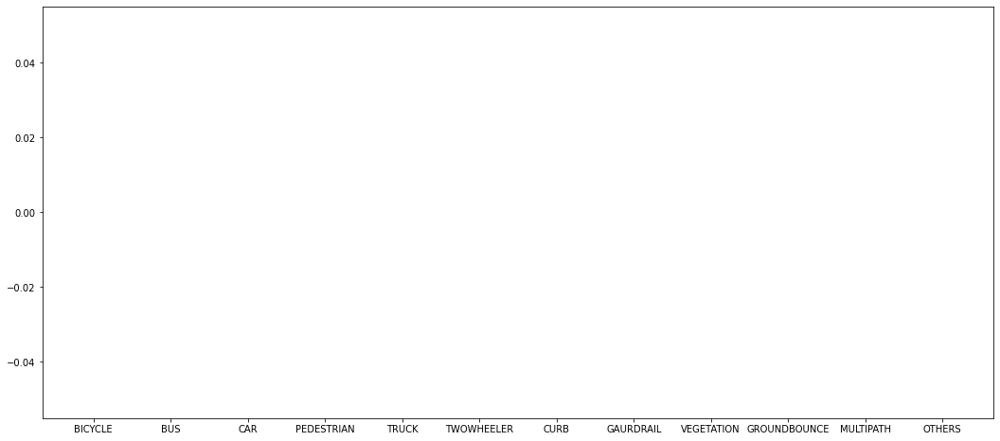

In [44]:
# plotting class distribution
plt.figure(figsize=(18,8))
labels_names = Radar_Stats.label_id_to_class.values()
plt.bar(labels_names, Radar_Stats.cls_id_cnt.values(), width=0.2, align='center')

In [1]:
radar_stats.plot_data(data, cam)

NameError: name 'radar_stats' is not defined

In [20]:
# data format
# <timestamp, range, az, el, doppler, doppler_ego_comp, snr, rcs, label_id>

#### compute stats for a particular class (snr vs range, rcs vs range)

In [23]:
car_data, car_cam = radar_stats.dataset_by_topic_classname(topicname='MRR', classname='CAR')
ped_data, ped_cam = radar_stats.dataset_by_topic_classname(topicname='MRR', classname='PEDESTRIAN')
bicycle_data, bicycle_cam = radar_stats.dataset_by_topic_classname(topicname='MRR', classname='BICYCLE')

---drive04_plaza_domain_rocketk_104_114u_2021-07-12-16-41-15_script
expected scanids: [326]
i=0, current scan id: 326, data len: (19, 9)
expected scanids: [329]
i=0, current scan id: 329, data len: (26, 9)
expected scanids: [341]
i=0, current scan id: 341, data len: (19, 9)
expected scanids: [344]
i=0, current scan id: 344, data len: (39, 9)
expected scanids: [347]
i=0, current scan id: 347, data len: (27, 9)
expected scanids: [350]
i=0, current scan id: 350, data len: (52, 9)
expected scanids: [353]
i=0, current scan id: 353, data len: (67, 9)
expected scanids: [356]
i=0, current scan id: 356, data len: (49, 9)
expected scanids: [359]
i=0, current scan id: 359, data len: (101, 9)
expected scanids: [362]
i=0, current scan id: 362, data len: (77, 9)
expected scanids: [371]
i=0, current scan id: 371, data len: (26, 9)
expected scanids: [374]
i=0, current scan id: 374, data len: (19, 9)
expected scanids: [377]
i=0, current scan id: 377, data len: (39, 9)
expected scanids: [380]
i=0, curre

expected scanids: [4592]
i=0, current scan id: 4592, data len: (15, 9)
expected scanids: [4595]
i=0, current scan id: 4595, data len: (20, 9)
expected scanids: [4598]
i=0, current scan id: 4598, data len: (35, 9)
expected scanids: [4601]
i=0, current scan id: 4601, data len: (18, 9)
expected scanids: [4604]
i=0, current scan id: 4604, data len: (21, 9)
expected scanids: [4607]
i=0, current scan id: 4607, data len: (38, 9)
expected scanids: [4610]
i=0, current scan id: 4610, data len: (20, 9)
expected scanids: [4613]
i=0, current scan id: 4613, data len: (22, 9)
expected scanids: [4616]
i=0, current scan id: 4616, data len: (32, 9)
expected scanids: [4619]
i=0, current scan id: 4619, data len: (17, 9)
expected scanids: [4622]
i=0, current scan id: 4622, data len: (18, 9)
expected scanids: [4625]
i=0, current scan id: 4625, data len: (30, 9)
expected scanids: [4628]
i=0, current scan id: 4628, data len: (52, 9)
expected scanids: [4631]
i=0, current scan id: 4631, data len: (71, 9)
expect

expected scanids: [9467]
i=0, current scan id: 9467, data len: (195, 9)
expected scanids: [9470]
i=0, current scan id: 9470, data len: (336, 9)
expected scanids: [9473]
i=0, current scan id: 9473, data len: (217, 9)
expected scanids: [9476]
i=0, current scan id: 9476, data len: (534, 9)
expected scanids: [9479]
i=0, current scan id: 9479, data len: (504, 9)
expected scanids: [9482]
i=0, current scan id: 9482, data len: (526, 9)
expected scanids: [9485]
i=0, current scan id: 9485, data len: (536, 9)
expected scanids: [9488]
i=0, current scan id: 9488, data len: (583, 9)
expected scanids: [9491]
i=0, current scan id: 9491, data len: (169, 9)
expected scanids: [9494]
i=0, current scan id: 9494, data len: (176, 9)
expected scanids: [9497]
i=0, current scan id: 9497, data len: (141, 9)
expected scanids: [9500]
i=0, current scan id: 9500, data len: (198, 9)
expected scanids: [9503]
i=0, current scan id: 9503, data len: (307, 9)
expected scanids: [9506]
i=0, current scan id: 9506, data len: (

expected scanids: [13637]
i=0, current scan id: 13637, data len: (25, 9)
expected scanids: [13640]
i=0, current scan id: 13640, data len: (21, 9)
expected scanids: [13643]
i=0, current scan id: 13643, data len: (75, 9)
expected scanids: [13646]
i=0, current scan id: 13646, data len: (27, 9)
expected scanids: [13649]
i=0, current scan id: 13649, data len: (110, 9)
expected scanids: [13652]
i=0, current scan id: 13652, data len: (26, 9)
expected scanids: [13655]
i=0, current scan id: 13655, data len: (43, 9)
expected scanids: [13658]
i=0, current scan id: 13658, data len: (22, 9)
expected scanids: [13661]
i=0, current scan id: 13661, data len: (56, 9)
expected scanids: [13664]
i=0, current scan id: 13664, data len: (45, 9)
expected scanids: [13667]
i=0, current scan id: 13667, data len: (39, 9)
expected scanids: [13670]
i=0, current scan id: 13670, data len: (66, 9)
expected scanids: [13673]
i=0, current scan id: 13673, data len: (71, 9)
expected scanids: [13676]
i=0, current scan id: 13

expected scanids: [3386]
i=0, current scan id: 3386, data len: (78, 9)
expected scanids: [3389]
i=0, current scan id: 3389, data len: (48, 9)
expected scanids: [3392]
i=0, current scan id: 3392, data len: (37, 9)
expected scanids: [3395]
i=0, current scan id: 3395, data len: (68, 9)
expected scanids: [3398]
i=0, current scan id: 3398, data len: (59, 9)
expected scanids: [3401]
i=0, current scan id: 3401, data len: (99, 9)
expected scanids: [3404]
i=0, current scan id: 3404, data len: (71, 9)
expected scanids: [3407]
i=0, current scan id: 3407, data len: (55, 9)
expected scanids: [3410]
i=0, current scan id: 3410, data len: (74, 9)
expected scanids: [3413]
i=0, current scan id: 3413, data len: (66, 9)
expected scanids: [3416]
i=0, current scan id: 3416, data len: (71, 9)
expected scanids: [3419]
i=0, current scan id: 3419, data len: (138, 9)
expected scanids: [3422]
i=0, current scan id: 3422, data len: (81, 9)
expected scanids: [3425]
i=0, current scan id: 3425, data len: (113, 9)
expe

expected scanids: [896]
i=0, current scan id: 896, data len: (150, 9)
expected scanids: [899]
i=0, current scan id: 899, data len: (131, 9)
expected scanids: [902]
i=0, current scan id: 902, data len: (44, 9)
expected scanids: [905]
i=0, current scan id: 905, data len: (109, 9)
expected scanids: [908]
i=0, current scan id: 908, data len: (151, 9)
expected scanids: [911]
i=0, current scan id: 911, data len: (226, 9)
expected scanids: [914]
i=0, current scan id: 914, data len: (189, 9)
expected scanids: [917]
i=0, current scan id: 917, data len: (66, 9)
expected scanids: [920]
i=0, current scan id: 920, data len: (149, 9)
expected scanids: [923]
i=0, current scan id: 923, data len: (173, 9)
expected scanids: [926]
i=0, current scan id: 926, data len: (181, 9)
expected scanids: [929]
i=0, current scan id: 929, data len: (308, 9)
expected scanids: [932]
i=0, current scan id: 932, data len: (361, 9)
expected scanids: [935]
i=0, current scan id: 935, data len: (105, 9)
expected scanids: [938

expected scanids: [45341]
i=0, current scan id: 45341, data len: (83, 9)
expected scanids: [45344]
i=0, current scan id: 45344, data len: (53, 9)
expected scanids: [45347]
i=0, current scan id: 45347, data len: (11, 9)
expected scanids: [45350]
i=0, current scan id: 45350, data len: (9, 9)
expected scanids: [45353]
i=0, current scan id: 45353, data len: (22, 9)
expected scanids: [45356]
i=0, current scan id: 45356, data len: (33, 9)
expected scanids: [45359]
i=0, current scan id: 45359, data len: (26, 9)
expected scanids: [45365]
i=0, current scan id: 45365, data len: (80, 9)
expected scanids: [45368]
i=0, current scan id: 45368, data len: (102, 9)
expected scanids: [45371]
i=0, current scan id: 45371, data len: (81, 9)
expected scanids: [45374]
i=0, current scan id: 45374, data len: (100, 9)
expected scanids: [45377]
i=0, current scan id: 45377, data len: (118, 9)
expected scanids: [45380]
i=0, current scan id: 45380, data len: (97, 9)
expected scanids: [45383]
i=0, current scan id: 4

expected scanids: [2129]
i=0, current scan id: 2129, data len: (497, 9)
expected scanids: [2132]
i=0, current scan id: 2132, data len: (517, 9)
expected scanids: [2135]
i=0, current scan id: 2135, data len: (453, 9)
expected scanids: [2138]
i=0, current scan id: 2138, data len: (292, 9)
expected scanids: [2141]
i=0, current scan id: 2141, data len: (636, 9)
expected scanids: [2144]
i=0, current scan id: 2144, data len: (443, 9)
expected scanids: [2147]
i=0, current scan id: 2147, data len: (480, 9)
expected scanids: [2150]
i=0, current scan id: 2150, data len: (403, 9)
expected scanids: [2153]
i=0, current scan id: 2153, data len: (320, 9)
expected scanids: [2156]
i=0, current scan id: 2156, data len: (254, 9)
expected scanids: [2159]
i=0, current scan id: 2159, data len: (253, 9)
expected scanids: [2162]
i=0, current scan id: 2162, data len: (230, 9)
expected scanids: [2165]
i=0, current scan id: 2165, data len: (281, 9)
expected scanids: [2168]
i=0, current scan id: 2168, data len: (

expected scanids: [39464]
i=0, current scan id: 39464, data len: (204, 9)
expected scanids: [39467]
i=0, current scan id: 39467, data len: (258, 9)
expected scanids: [39470]
i=0, current scan id: 39470, data len: (243, 9)
expected scanids: [39473]
i=0, current scan id: 39473, data len: (144, 9)
expected scanids: [40976]
i=0, current scan id: 40976, data len: (159, 9)
expected scanids: [40979]
i=0, current scan id: 40979, data len: (130, 9)
expected scanids: [40982]
i=0, current scan id: 40982, data len: (55, 9)
expected scanids: [40985]
i=0, current scan id: 40985, data len: (72, 9)
expected scanids: [40988]
i=0, current scan id: 40988, data len: (68, 9)
expected scanids: [40991]
i=0, current scan id: 40991, data len: (56, 9)
expected scanids: [40994]
i=0, current scan id: 40994, data len: (133, 9)
expected scanids: [40997]
i=0, current scan id: 40997, data len: (62, 9)
expected scanids: [41000]
i=0, current scan id: 41000, data len: (107, 9)
expected scanids: [41003]
i=0, current scan

expected scanids: [37757]
i=0, current scan id: 37757, data len: (90, 9)
expected scanids: [37760]
i=0, current scan id: 37760, data len: (24, 9)
expected scanids: [37763]
i=0, current scan id: 37763, data len: (72, 9)
expected scanids: [37847]
i=0, current scan id: 37847, data len: (22, 9)
expected scanids: [37850]
i=0, current scan id: 37850, data len: (18, 9)
expected scanids: [37853]
i=0, current scan id: 37853, data len: (12, 9)
expected scanids: [37856]
i=0, current scan id: 37856, data len: (91, 9)
expected scanids: [37859]
i=0, current scan id: 37859, data len: (28, 9)
expected scanids: [37862]
i=0, current scan id: 37862, data len: (38, 9)
expected scanids: [37865]
i=0, current scan id: 37865, data len: (73, 9)
expected scanids: [37868]
i=0, current scan id: 37868, data len: (57, 9)
expected scanids: [37871]
i=0, current scan id: 37871, data len: (46, 9)
expected scanids: [37874]
i=0, current scan id: 37874, data len: (30, 9)
expected scanids: [37877]
i=0, current scan id: 378

expected scanids: [1691]
i=0, current scan id: 1691, data len: (88, 9)
expected scanids: [1694]
i=0, current scan id: 1694, data len: (186, 9)
expected scanids: [1697]
i=0, current scan id: 1697, data len: (113, 9)
expected scanids: [1700]
i=0, current scan id: 1700, data len: (110, 9)
expected scanids: [1703]
i=0, current scan id: 1703, data len: (212, 9)
expected scanids: [1706]
i=0, current scan id: 1706, data len: (241, 9)
expected scanids: [1709]
i=0, current scan id: 1709, data len: (132, 9)
expected scanids: [1712]
i=0, current scan id: 1712, data len: (233, 9)
expected scanids: [1715]
i=0, current scan id: 1715, data len: (89, 9)
expected scanids: [1718]
i=0, current scan id: 1718, data len: (39, 9)
expected scanids: [1721]
i=0, current scan id: 1721, data len: (80, 9)
expected scanids: [1724]
i=0, current scan id: 1724, data len: (107, 9)
expected scanids: [1727]
i=0, current scan id: 1727, data len: (76, 9)
expected scanids: [1730]
i=0, current scan id: 1730, data len: (117, 

expected scanids: [5234]
i=0, current scan id: 5234, data len: (150, 9)
expected scanids: [5237]
i=0, current scan id: 5237, data len: (190, 9)
expected scanids: [5240]
i=0, current scan id: 5240, data len: (260, 9)
expected scanids: [5243]
i=0, current scan id: 5243, data len: (145, 9)
expected scanids: [5246]
i=0, current scan id: 5246, data len: (208, 9)
expected scanids: [5249]
i=0, current scan id: 5249, data len: (217, 9)
expected scanids: [5252]
i=0, current scan id: 5252, data len: (236, 9)
expected scanids: [5255]
i=0, current scan id: 5255, data len: (238, 9)
expected scanids: [5258]
i=0, current scan id: 5258, data len: (78, 9)
expected scanids: [5261]
i=0, current scan id: 5261, data len: (145, 9)
expected scanids: [5264]
i=0, current scan id: 5264, data len: (255, 9)
expected scanids: [5267]
i=0, current scan id: 5267, data len: (114, 9)
expected scanids: [5270]
i=0, current scan id: 5270, data len: (220, 9)
expected scanids: [5273]
i=0, current scan id: 5273, data len: (1

i=0, current scan id: 7244, data len: (222, 9)
expected scanids: [7247]
i=0, current scan id: 7247, data len: (456, 9)
expected scanids: [7250]
i=0, current scan id: 7250, data len: (407, 9)
expected scanids: [7253]
i=0, current scan id: 7253, data len: (711, 9)
expected scanids: [7256]
i=0, current scan id: 7256, data len: (337, 9)
expected scanids: [7259]
i=0, current scan id: 7259, data len: (493, 9)
expected scanids: [7262]
i=0, current scan id: 7262, data len: (250, 9)
expected scanids: [7265]
i=0, current scan id: 7265, data len: (342, 9)
expected scanids: [7268]
i=0, current scan id: 7268, data len: (496, 9)
expected scanids: [7271]
i=0, current scan id: 7271, data len: (497, 9)
expected scanids: [7274]
i=0, current scan id: 7274, data len: (633, 9)
expected scanids: [7277]
i=0, current scan id: 7277, data len: (258, 9)
expected scanids: [7280]
i=0, current scan id: 7280, data len: (321, 9)
expected scanids: [7283]
i=0, current scan id: 7283, data len: (306, 9)
expected scanids:

expected scanids: [11978]
i=0, current scan id: 11978, data len: (75, 9)
expected scanids: [11981]
i=0, current scan id: 11981, data len: (69, 9)
expected scanids: [11984]
i=0, current scan id: 11984, data len: (88, 9)
expected scanids: [11987]
i=0, current scan id: 11987, data len: (100, 9)
expected scanids: [11990]
i=0, current scan id: 11990, data len: (124, 9)
expected scanids: [11993]
i=0, current scan id: 11993, data len: (115, 9)
expected scanids: [11996]
i=0, current scan id: 11996, data len: (106, 9)
expected scanids: [11999]
i=0, current scan id: 11999, data len: (214, 9)
expected scanids: [12002]
i=0, current scan id: 12002, data len: (89, 9)
expected scanids: [12005]
i=0, current scan id: 12005, data len: (211, 9)
expected scanids: [12008]
i=0, current scan id: 12008, data len: (219, 9)
expected scanids: [12011]
i=0, current scan id: 12011, data len: (130, 9)
expected scanids: [12014]
i=0, current scan id: 12014, data len: (119, 9)
expected scanids: [12017]
i=0, current sca

expected scanids: [15452]
i=0, current scan id: 15452, data len: (169, 9)
expected scanids: [15455]
i=0, current scan id: 15455, data len: (52, 9)
expected scanids: [15458]
i=0, current scan id: 15458, data len: (71, 9)
expected scanids: [15461]
i=0, current scan id: 15461, data len: (53, 9)
expected scanids: [15464]
i=0, current scan id: 15464, data len: (64, 9)
expected scanids: [15467]
i=0, current scan id: 15467, data len: (236, 9)
expected scanids: [15470]
i=0, current scan id: 15470, data len: (161, 9)
expected scanids: [15473]
i=0, current scan id: 15473, data len: (275, 9)
expected scanids: [15476]
i=0, current scan id: 15476, data len: (346, 9)
expected scanids: [15479]
i=0, current scan id: 15479, data len: (299, 9)
expected scanids: [15482]
i=0, current scan id: 15482, data len: (319, 9)
expected scanids: [15485]
i=0, current scan id: 15485, data len: (200, 9)
expected scanids: [15488]
i=0, current scan id: 15488, data len: (320, 9)
expected scanids: [15491]
i=0, current sca

expected scanids: [18164]
i=0, current scan id: 18164, data len: (247, 9)
expected scanids: [18167]
i=0, current scan id: 18167, data len: (175, 9)
expected scanids: [18170]
i=0, current scan id: 18170, data len: (178, 9)
expected scanids: [18173]
i=0, current scan id: 18173, data len: (271, 9)
expected scanids: [18176]
i=0, current scan id: 18176, data len: (212, 9)
expected scanids: [18179]
i=0, current scan id: 18179, data len: (226, 9)
expected scanids: [18182]
i=0, current scan id: 18182, data len: (260, 9)
expected scanids: [18185]
i=0, current scan id: 18185, data len: (147, 9)
expected scanids: [18188]
i=0, current scan id: 18188, data len: (98, 9)
expected scanids: [18191]
i=0, current scan id: 18191, data len: (145, 9)
expected scanids: [18194]
i=0, current scan id: 18194, data len: (133, 9)
expected scanids: [18197]
i=0, current scan id: 18197, data len: (87, 9)
expected scanids: [18200]
i=0, current scan id: 18200, data len: (138, 9)
expected scanids: [18203]
i=0, current s

expected scanids: [6599]
i=0, current scan id: 6599, data len: (36, 9)
expected scanids: [6602]
i=0, current scan id: 6602, data len: (51, 9)
expected scanids: [6605]
i=0, current scan id: 6605, data len: (22, 9)
expected scanids: [6608]
i=0, current scan id: 6608, data len: (22, 9)
expected scanids: [6611]
i=0, current scan id: 6611, data len: (20, 9)
expected scanids: [6614]
i=0, current scan id: 6614, data len: (83, 9)
expected scanids: [6617]
i=0, current scan id: 6617, data len: (44, 9)
expected scanids: [6620]
i=0, current scan id: 6620, data len: (20, 9)
expected scanids: [6623]
i=0, current scan id: 6623, data len: (16, 9)
expected scanids: [6626]
i=0, current scan id: 6626, data len: (42, 9)
expected scanids: [6629]
i=0, current scan id: 6629, data len: (28, 9)
expected scanids: [6632]
i=0, current scan id: 6632, data len: (42, 9)
expected scanids: [6635]
i=0, current scan id: 6635, data len: (76, 9)
expected scanids: [6638]
i=0, current scan id: 6638, data len: (62, 9)
expect

expected scanids: [2783]
i=0, current scan id: 2783, data len: (65, 9)
expected scanids: [2786]
i=0, current scan id: 2786, data len: (64, 9)
expected scanids: [2789]
i=0, current scan id: 2789, data len: (66, 9)
expected scanids: [2792]
i=0, current scan id: 2792, data len: (73, 9)
expected scanids: [2795]
i=0, current scan id: 2795, data len: (69, 9)
expected scanids: [2798]
i=0, current scan id: 2798, data len: (82, 9)
expected scanids: [2801]
i=0, current scan id: 2801, data len: (67, 9)
expected scanids: [2804]
i=0, current scan id: 2804, data len: (58, 9)
expected scanids: [2807]
i=0, current scan id: 2807, data len: (63, 9)
expected scanids: [2810]
i=0, current scan id: 2810, data len: (64, 9)
expected scanids: [2813]
i=0, current scan id: 2813, data len: (62, 9)
expected scanids: [2816]
i=0, current scan id: 2816, data len: (65, 9)
expected scanids: [2819]
i=0, current scan id: 2819, data len: (74, 9)
expected scanids: [2822]
i=0, current scan id: 2822, data len: (62, 9)
expect

expected scanids: [3467]
i=0, current scan id: 3467, data len: (24, 9)
expected scanids: [3470]
i=0, current scan id: 3470, data len: (22, 9)
expected scanids: [3473]
i=0, current scan id: 3473, data len: (43, 9)
expected scanids: [3476]
i=0, current scan id: 3476, data len: (41, 9)
expected scanids: [3479]
i=0, current scan id: 3479, data len: (55, 9)
expected scanids: [3482]
i=0, current scan id: 3482, data len: (18, 9)
expected scanids: [3485]
i=0, current scan id: 3485, data len: (59, 9)
expected scanids: [3488]
i=0, current scan id: 3488, data len: (74, 9)
expected scanids: [3491]
i=0, current scan id: 3491, data len: (31, 9)
expected scanids: [3494]
i=0, current scan id: 3494, data len: (41, 9)
expected scanids: [3497]
i=0, current scan id: 3497, data len: (20, 9)
expected scanids: [3500]
i=0, current scan id: 3500, data len: (47, 9)
expected scanids: [3503]
i=0, current scan id: 3503, data len: (37, 9)
expected scanids: [3506]
i=0, current scan id: 3506, data len: (55, 9)
expect

expected scanids: [6191]
i=0, current scan id: 6191, data len: (54, 9)
expected scanids: [6194]
i=0, current scan id: 6194, data len: (94, 9)
expected scanids: [6197]
i=0, current scan id: 6197, data len: (120, 9)
expected scanids: [6200]
i=0, current scan id: 6200, data len: (424, 9)
expected scanids: [6203]
i=0, current scan id: 6203, data len: (496, 9)
expected scanids: [6206]
i=0, current scan id: 6206, data len: (448, 9)
expected scanids: [6209]
i=0, current scan id: 6209, data len: (680, 9)
expected scanids: [6212]
i=0, current scan id: 6212, data len: (446, 9)
expected scanids: [6215]
i=0, current scan id: 6215, data len: (56, 9)
expected scanids: [6218]
i=0, current scan id: 6218, data len: (45, 9)
expected scanids: [6221]
i=0, current scan id: 6221, data len: (595, 9)
expected scanids: [6224]
i=0, current scan id: 6224, data len: (664, 9)
expected scanids: [6227]
i=0, current scan id: 6227, data len: (680, 9)
expected scanids: [6230]
i=0, current scan id: 6230, data len: (705,

expected scanids: [9191]
i=0, current scan id: 9191, data len: (177, 9)
expected scanids: [9194]
i=0, current scan id: 9194, data len: (77, 9)
expected scanids: [9197]
i=0, current scan id: 9197, data len: (106, 9)
expected scanids: [9200]
i=0, current scan id: 9200, data len: (146, 9)
expected scanids: [9203]
i=0, current scan id: 9203, data len: (94, 9)
expected scanids: [9206]
i=0, current scan id: 9206, data len: (144, 9)
expected scanids: [9209]
i=0, current scan id: 9209, data len: (24, 9)
expected scanids: [9212]
i=0, current scan id: 9212, data len: (192, 9)
expected scanids: [9215]
i=0, current scan id: 9215, data len: (21, 9)
expected scanids: [9218]
i=0, current scan id: 9218, data len: (39, 9)
expected scanids: [9221]
i=0, current scan id: 9221, data len: (48, 9)
expected scanids: [9224]
i=0, current scan id: 9224, data len: (54, 9)
expected scanids: [9227]
i=0, current scan id: 9227, data len: (24, 9)
expected scanids: [9230]
i=0, current scan id: 9230, data len: (21, 9)
e

expected scanids: [11558]
i=0, current scan id: 11558, data len: (230, 9)
expected scanids: [11561]
i=0, current scan id: 11561, data len: (137, 9)
expected scanids: [11564]
i=0, current scan id: 11564, data len: (268, 9)
expected scanids: [11567]
i=0, current scan id: 11567, data len: (255, 9)
expected scanids: [11570]
i=0, current scan id: 11570, data len: (246, 9)
expected scanids: [11573]
i=0, current scan id: 11573, data len: (137, 9)
expected scanids: [11576]
i=0, current scan id: 11576, data len: (209, 9)
expected scanids: [11579]
i=0, current scan id: 11579, data len: (190, 9)
expected scanids: [11582]
i=0, current scan id: 11582, data len: (159, 9)
expected scanids: [11585]
i=0, current scan id: 11585, data len: (219, 9)
expected scanids: [11588]
i=0, current scan id: 11588, data len: (192, 9)
expected scanids: [11591]
i=0, current scan id: 11591, data len: (258, 9)
expected scanids: [11594]
i=0, current scan id: 11594, data len: (237, 9)
expected scanids: [11597]
i=0, current

expected scanids: [19082]
i=0, current scan id: 19082, data len: (221, 9)
expected scanids: [19085]
i=0, current scan id: 19085, data len: (235, 9)
expected scanids: [19088]
i=0, current scan id: 19088, data len: (144, 9)
expected scanids: [19091]
i=0, current scan id: 19091, data len: (167, 9)
expected scanids: [19094]
i=0, current scan id: 19094, data len: (92, 9)
expected scanids: [19097]
i=0, current scan id: 19097, data len: (175, 9)
expected scanids: [19100]
i=0, current scan id: 19100, data len: (106, 9)
expected scanids: [19103]
i=0, current scan id: 19103, data len: (164, 9)
expected scanids: [19106]
i=0, current scan id: 19106, data len: (352, 9)
expected scanids: [19109]
i=0, current scan id: 19109, data len: (313, 9)
expected scanids: [19112]
i=0, current scan id: 19112, data len: (288, 9)
expected scanids: [19115]
i=0, current scan id: 19115, data len: (308, 9)
expected scanids: [19118]
i=0, current scan id: 19118, data len: (373, 9)
expected scanids: [19121]
i=0, current 

expected scanids: [22568]
i=0, current scan id: 22568, data len: (122, 9)
expected scanids: [22589]
i=0, current scan id: 22589, data len: (22, 9)
expected scanids: [22592]
i=0, current scan id: 22592, data len: (117, 9)
expected scanids: [22601]
i=0, current scan id: 22601, data len: (68, 9)
expected scanids: [22604]
i=0, current scan id: 22604, data len: (101, 9)
expected scanids: [22607]
i=0, current scan id: 22607, data len: (145, 9)
expected scanids: [22610]
i=0, current scan id: 22610, data len: (176, 9)
expected scanids: [22613]
i=0, current scan id: 22613, data len: (310, 9)
expected scanids: [22616]
i=0, current scan id: 22616, data len: (552, 9)
expected scanids: [22667]
i=0, current scan id: 22667, data len: (154, 9)
expected scanids: [22670]
i=0, current scan id: 22670, data len: (60, 9)
expected scanids: [22673]
i=0, current scan id: 22673, data len: (48, 9)
expected scanids: [22676]
i=0, current scan id: 22676, data len: (114, 9)
expected scanids: [22679]
i=0, current sca

expected scanids: [25412]
i=0, current scan id: 25412, data len: (176, 9)
expected scanids: [25415]
i=0, current scan id: 25415, data len: (313, 9)
expected scanids: [25418]
i=0, current scan id: 25418, data len: (422, 9)
expected scanids: [25421]
i=0, current scan id: 25421, data len: (343, 9)
expected scanids: [25424]
i=0, current scan id: 25424, data len: (328, 9)
expected scanids: [25427]
i=0, current scan id: 25427, data len: (144, 9)
expected scanids: [25430]
i=0, current scan id: 25430, data len: (318, 9)
expected scanids: [25433]
i=0, current scan id: 25433, data len: (409, 9)
expected scanids: [25436]
i=0, current scan id: 25436, data len: (358, 9)
expected scanids: [25439]
i=0, current scan id: 25439, data len: (342, 9)
expected scanids: [25442]
i=0, current scan id: 25442, data len: (415, 9)
expected scanids: [25445]
i=0, current scan id: 25445, data len: (211, 9)
expected scanids: [25448]
i=0, current scan id: 25448, data len: (417, 9)
expected scanids: [25451]
i=0, current

expected scanids: [27875]
i=0, current scan id: 27875, data len: (92, 9)
expected scanids: [27878]
i=0, current scan id: 27878, data len: (62, 9)
expected scanids: [27881]
i=0, current scan id: 27881, data len: (50, 9)
expected scanids: [27884]
i=0, current scan id: 27884, data len: (73, 9)
expected scanids: [27887]
i=0, current scan id: 27887, data len: (59, 9)
expected scanids: [27890]
i=0, current scan id: 27890, data len: (64, 9)
expected scanids: [27893]
i=0, current scan id: 27893, data len: (107, 9)
expected scanids: [27896]
i=0, current scan id: 27896, data len: (46, 9)
expected scanids: [27899]
i=0, current scan id: 27899, data len: (54, 9)
expected scanids: [27902]
i=0, current scan id: 27902, data len: (80, 9)
expected scanids: [27905]
i=0, current scan id: 27905, data len: (60, 9)
expected scanids: [27908]
i=0, current scan id: 27908, data len: (52, 9)
expected scanids: [27911]
i=0, current scan id: 27911, data len: (61, 9)
expected scanids: [27914]
i=0, current scan id: 27

expected scanids: [10211]
i=0, current scan id: 10211, data len: (241, 9)
expected scanids: [10214]
i=0, current scan id: 10214, data len: (485, 9)
expected scanids: [10217]
i=0, current scan id: 10217, data len: (305, 9)
expected scanids: [10220]
i=0, current scan id: 10220, data len: (433, 9)
expected scanids: [10223]
i=0, current scan id: 10223, data len: (412, 9)
expected scanids: [10226]
i=0, current scan id: 10226, data len: (461, 9)
expected scanids: [10229]
i=0, current scan id: 10229, data len: (457, 9)
expected scanids: [10232]
i=0, current scan id: 10232, data len: (308, 9)
expected scanids: [10235]
i=0, current scan id: 10235, data len: (364, 9)
expected scanids: [10238]
i=0, current scan id: 10238, data len: (412, 9)
expected scanids: [10241]
i=0, current scan id: 10241, data len: (329, 9)
expected scanids: [10244]
i=0, current scan id: 10244, data len: (361, 9)
expected scanids: [10247]
i=0, current scan id: 10247, data len: (351, 9)
expected scanids: [10250]
i=0, current

expected scanids: [12668]
i=0, current scan id: 12668, data len: (414, 9)
expected scanids: [12671]
i=0, current scan id: 12671, data len: (522, 9)
expected scanids: [12674]
i=0, current scan id: 12674, data len: (389, 9)
expected scanids: [12677]
i=0, current scan id: 12677, data len: (583, 9)
expected scanids: [12680]
i=0, current scan id: 12680, data len: (312, 9)
expected scanids: [12683]
i=0, current scan id: 12683, data len: (422, 9)
expected scanids: [12686]
i=0, current scan id: 12686, data len: (471, 9)
expected scanids: [12689]
i=0, current scan id: 12689, data len: (333, 9)
expected scanids: [12692]
i=0, current scan id: 12692, data len: (167, 9)
expected scanids: [12695]
i=0, current scan id: 12695, data len: (131, 9)
expected scanids: [12698]
i=0, current scan id: 12698, data len: (97, 9)
expected scanids: [12716]
i=0, current scan id: 12716, data len: (213, 9)
expected scanids: [12719]
i=0, current scan id: 12719, data len: (132, 9)
expected scanids: [12722]
i=0, current 

expected scanids: [14873]
i=0, current scan id: 14873, data len: (130, 9)
expected scanids: [14876]
i=0, current scan id: 14876, data len: (109, 9)
expected scanids: [14879]
i=0, current scan id: 14879, data len: (180, 9)
expected scanids: [14882]
i=0, current scan id: 14882, data len: (112, 9)
expected scanids: [14885]
i=0, current scan id: 14885, data len: (154, 9)
expected scanids: [14888]
i=0, current scan id: 14888, data len: (106, 9)
expected scanids: [14891]
i=0, current scan id: 14891, data len: (177, 9)
expected scanids: [14894]
i=0, current scan id: 14894, data len: (115, 9)
expected scanids: [14897]
i=0, current scan id: 14897, data len: (112, 9)
expected scanids: [14900]
i=0, current scan id: 14900, data len: (148, 9)
expected scanids: [14903]
i=0, current scan id: 14903, data len: (81, 9)
expected scanids: [14906]
i=0, current scan id: 14906, data len: (92, 9)
expected scanids: [14909]
i=0, current scan id: 14909, data len: (99, 9)
expected scanids: [14912]
i=0, current sc

expected scanids: [16640]
i=0, current scan id: 16640, data len: (99, 9)
expected scanids: [16643]
i=0, current scan id: 16643, data len: (81, 9)
expected scanids: [16646]
i=0, current scan id: 16646, data len: (38, 9)
expected scanids: [16649]
i=0, current scan id: 16649, data len: (116, 9)
expected scanids: [16652]
i=0, current scan id: 16652, data len: (75, 9)
expected scanids: [16655]
i=0, current scan id: 16655, data len: (104, 9)
expected scanids: [16658]
i=0, current scan id: 16658, data len: (128, 9)
expected scanids: [16661]
i=0, current scan id: 16661, data len: (116, 9)
expected scanids: [16664]
i=0, current scan id: 16664, data len: (95, 9)
expected scanids: [16667]
i=0, current scan id: 16667, data len: (104, 9)
expected scanids: [16670]
i=0, current scan id: 16670, data len: (103, 9)
expected scanids: [16673]
i=0, current scan id: 16673, data len: (42, 9)
expected scanids: [16676]
i=0, current scan id: 16676, data len: (124, 9)
expected scanids: [16679]
i=0, current scan 

expected scanids: [3946]
i=0, current scan id: 3946, data len: (80, 9)
expected scanids: [3949]
i=0, current scan id: 3949, data len: (99, 9)
expected scanids: [3952]
i=0, current scan id: 3952, data len: (79, 9)
expected scanids: [3956]
i=0, current scan id: 3956, data len: (85, 9)
expected scanids: [3958]
i=0, current scan id: 3958, data len: (111, 9)
expected scanids: [3962]
i=0, current scan id: 3962, data len: (133, 9)
expected scanids: [3964]
i=0, current scan id: 3964, data len: (44, 9)
expected scanids: [3967]
i=0, current scan id: 3967, data len: (135, 9)
expected scanids: [3970]
i=0, current scan id: 3970, data len: (224, 9)
expected scanids: [3974]
i=0, current scan id: 3974, data len: (293, 9)
expected scanids: [3976]
i=0, current scan id: 3976, data len: (237, 9)
expected scanids: [3979]
i=0, current scan id: 3979, data len: (236, 9)
---drive09_highway_2021-09-17-17-01-59_script
expected scanids: [5786]
i=0, current scan id: 5786, data len: (402, 9)
expected scanids: [5789

expected scanids: [8810]
i=0, current scan id: 8810, data len: (259, 9)
expected scanids: [8813]
i=0, current scan id: 8813, data len: (349, 9)
expected scanids: [8816]
i=0, current scan id: 8816, data len: (281, 9)
expected scanids: [8819]
i=0, current scan id: 8819, data len: (287, 9)
expected scanids: [8822]
i=0, current scan id: 8822, data len: (242, 9)
expected scanids: [8825]
i=0, current scan id: 8825, data len: (322, 9)
expected scanids: [8828]
i=0, current scan id: 8828, data len: (722, 9)
expected scanids: [8831]
i=0, current scan id: 8831, data len: (501, 9)
expected scanids: [8834]
i=0, current scan id: 8834, data len: (665, 9)
expected scanids: [8837]
i=0, current scan id: 8837, data len: (606, 9)
expected scanids: [8840]
i=0, current scan id: 8840, data len: (419, 9)
expected scanids: [8843]
i=0, current scan id: 8843, data len: (499, 9)
expected scanids: [8846]
i=0, current scan id: 8846, data len: (395, 9)
expected scanids: [8849]
i=0, current scan id: 8849, data len: (

expected scanids: [10382]
i=0, current scan id: 10382, data len: (162, 9)
expected scanids: [10385]
i=0, current scan id: 10385, data len: (251, 9)
expected scanids: [10388]
i=0, current scan id: 10388, data len: (203, 9)
expected scanids: [10391]
i=0, current scan id: 10391, data len: (213, 9)
expected scanids: [10394]
i=0, current scan id: 10394, data len: (216, 9)
expected scanids: [10397]
i=0, current scan id: 10397, data len: (171, 9)
expected scanids: [10400]
i=0, current scan id: 10400, data len: (280, 9)
expected scanids: [10403]
i=0, current scan id: 10403, data len: (368, 9)
expected scanids: [10406]
i=0, current scan id: 10406, data len: (294, 9)
expected scanids: [10409]
i=0, current scan id: 10409, data len: (360, 9)
expected scanids: [10412]
i=0, current scan id: 10412, data len: (235, 9)
expected scanids: [10415]
i=0, current scan id: 10415, data len: (601, 9)
expected scanids: [10418]
i=0, current scan id: 10418, data len: (633, 9)
expected scanids: [10421]
i=0, current

expected scanids: [12398]
i=0, current scan id: 12398, data len: (177, 9)
expected scanids: [12401]
i=0, current scan id: 12401, data len: (399, 9)
expected scanids: [12404]
i=0, current scan id: 12404, data len: (357, 9)
expected scanids: [12407]
i=0, current scan id: 12407, data len: (323, 9)
expected scanids: [12410]
i=0, current scan id: 12410, data len: (285, 9)
expected scanids: [12413]
i=0, current scan id: 12413, data len: (261, 9)
expected scanids: [12416]
i=0, current scan id: 12416, data len: (221, 9)
expected scanids: [12419]
i=0, current scan id: 12419, data len: (217, 9)
expected scanids: [12422]
i=0, current scan id: 12422, data len: (218, 9)
expected scanids: [12425]
i=0, current scan id: 12425, data len: (221, 9)
expected scanids: [12428]
i=0, current scan id: 12428, data len: (178, 9)
expected scanids: [12431]
i=0, current scan id: 12431, data len: (188, 9)
expected scanids: [12434]
i=0, current scan id: 12434, data len: (208, 9)
expected scanids: [12437]
i=0, current

expected scanids: [14606]
i=0, current scan id: 14606, data len: (97, 9)
expected scanids: [14609]
i=0, current scan id: 14609, data len: (79, 9)
expected scanids: [14612]
i=0, current scan id: 14612, data len: (64, 9)
expected scanids: [14615]
i=0, current scan id: 14615, data len: (80, 9)
expected scanids: [14618]
i=0, current scan id: 14618, data len: (79, 9)
expected scanids: [14621]
i=0, current scan id: 14621, data len: (63, 9)
expected scanids: [14624]
i=0, current scan id: 14624, data len: (51, 9)
expected scanids: [14627]
i=0, current scan id: 14627, data len: (70, 9)
expected scanids: [14630]
i=0, current scan id: 14630, data len: (98, 9)
expected scanids: [14633]
i=0, current scan id: 14633, data len: (63, 9)
expected scanids: [14636]
i=0, current scan id: 14636, data len: (95, 9)
expected scanids: [14639]
i=0, current scan id: 14639, data len: (133, 9)
expected scanids: [14642]
i=0, current scan id: 14642, data len: (240, 9)
expected scanids: [14645]
i=0, current scan id: 1

expected scanids: [2006]
i=0, current scan id: 2006, data len: (69, 9)
expected scanids: [2009]
i=0, current scan id: 2009, data len: (224, 9)
expected scanids: [2012]
i=0, current scan id: 2012, data len: (194, 9)
expected scanids: [2015]
i=0, current scan id: 2015, data len: (217, 9)
expected scanids: [2018]
i=0, current scan id: 2018, data len: (189, 9)
expected scanids: [2021]
i=0, current scan id: 2021, data len: (152, 9)
expected scanids: [2024]
i=0, current scan id: 2024, data len: (236, 9)
expected scanids: [2027]
i=0, current scan id: 2027, data len: (206, 9)
expected scanids: [2030]
i=0, current scan id: 2030, data len: (185, 9)
expected scanids: [2033]
i=0, current scan id: 2033, data len: (218, 9)
expected scanids: [2036]
i=0, current scan id: 2036, data len: (225, 9)
expected scanids: [2039]
i=0, current scan id: 2039, data len: (143, 9)
expected scanids: [2042]
i=0, current scan id: 2042, data len: (158, 9)
expected scanids: [2045]
i=0, current scan id: 2045, data len: (1

expected scanids: [5399]
i=0, current scan id: 5399, data len: (375, 9)
expected scanids: [5402]
i=0, current scan id: 5402, data len: (544, 9)
expected scanids: [5405]
i=0, current scan id: 5405, data len: (550, 9)
expected scanids: [5408]
i=0, current scan id: 5408, data len: (568, 9)
expected scanids: [5411]
i=0, current scan id: 5411, data len: (743, 9)
expected scanids: [5414]
i=0, current scan id: 5414, data len: (572, 9)
expected scanids: [5417]
i=0, current scan id: 5417, data len: (657, 9)
expected scanids: [5420]
i=0, current scan id: 5420, data len: (617, 9)
expected scanids: [5423]
i=0, current scan id: 5423, data len: (583, 9)
expected scanids: [5426]
i=0, current scan id: 5426, data len: (756, 9)
expected scanids: [5429]
i=0, current scan id: 5429, data len: (639, 9)
expected scanids: [5432]
i=0, current scan id: 5432, data len: (540, 9)
expected scanids: [5435]
i=0, current scan id: 5435, data len: (456, 9)
expected scanids: [5438]
i=0, current scan id: 5438, data len: (

expected scanids: [46214]
i=0, current scan id: 46214, data len: (263, 9)
expected scanids: [46217]
i=0, current scan id: 46217, data len: (146, 9)
expected scanids: [46220]
i=0, current scan id: 46220, data len: (100, 9)
expected scanids: [46223]
i=0, current scan id: 46223, data len: (170, 9)
expected scanids: [46226]
i=0, current scan id: 46226, data len: (105, 9)
expected scanids: [46229]
i=0, current scan id: 46229, data len: (80, 9)
expected scanids: [46232]
i=0, current scan id: 46232, data len: (71, 9)
expected scanids: [46235]
i=0, current scan id: 46235, data len: (136, 9)
expected scanids: [46238]
i=0, current scan id: 46238, data len: (203, 9)
expected scanids: [46241]
i=0, current scan id: 46241, data len: (71, 9)
expected scanids: [46244]
i=0, current scan id: 46244, data len: (99, 9)
expected scanids: [46247]
i=0, current scan id: 46247, data len: (114, 9)
expected scanids: [46250]
i=0, current scan id: 46250, data len: (76, 9)
expected scanids: [46253]
i=0, current scan

expected scanids: [3569]
i=0, current scan id: 3569, data len: (177, 9)
expected scanids: [3572]
i=0, current scan id: 3572, data len: (133, 9)
expected scanids: [3575]
i=0, current scan id: 3575, data len: (274, 9)
expected scanids: [3578]
i=0, current scan id: 3578, data len: (278, 9)
expected scanids: [3581]
i=0, current scan id: 3581, data len: (147, 9)
expected scanids: [3584]
i=0, current scan id: 3584, data len: (117, 9)
expected scanids: [3629]
i=0, current scan id: 3629, data len: (237, 9)
expected scanids: [3632]
i=0, current scan id: 3632, data len: (153, 9)
expected scanids: [3635]
i=0, current scan id: 3635, data len: (447, 9)
expected scanids: [3638]
i=0, current scan id: 3638, data len: (164, 9)
expected scanids: [3641]
i=0, current scan id: 3641, data len: (198, 9)
expected scanids: [3644]
i=0, current scan id: 3644, data len: (275, 9)
expected scanids: [3647]
i=0, current scan id: 3647, data len: (166, 9)
expected scanids: [3650]
i=0, current scan id: 3650, data len: (

expected scanids: [1433]
i=0, current scan id: 1433, data len: (233, 9)
expected scanids: [1436]
i=0, current scan id: 1436, data len: (172, 9)
expected scanids: [1439]
i=0, current scan id: 1439, data len: (101, 9)
expected scanids: [1445]
i=0, current scan id: 1445, data len: (198, 9)
expected scanids: [1448]
i=0, current scan id: 1448, data len: (150, 9)
expected scanids: [1451]
i=0, current scan id: 1451, data len: (172, 9)
expected scanids: [1457]
i=0, current scan id: 1457, data len: (219, 9)
expected scanids: [1460]
i=0, current scan id: 1460, data len: (132, 9)
expected scanids: [1466]
i=0, current scan id: 1466, data len: (215, 9)
expected scanids: [1469]
i=0, current scan id: 1469, data len: (200, 9)
expected scanids: [1472]
i=0, current scan id: 1472, data len: (158, 9)
expected scanids: [1478]
i=0, current scan id: 1478, data len: (185, 9)
expected scanids: [1481]
i=0, current scan id: 1481, data len: (124, 9)
expected scanids: [1484]
i=0, current scan id: 1484, data len: (

expected scanids: [4841]
i=0, current scan id: 4841, data len: (271, 9)
expected scanids: [4844]
i=0, current scan id: 4844, data len: (212, 9)
expected scanids: [4847]
i=0, current scan id: 4847, data len: (99, 9)
expected scanids: [4850]
i=0, current scan id: 4850, data len: (17, 9)
expected scanids: [4853]
i=0, current scan id: 4853, data len: (2, 9)
expected scanids: [5687]
i=0, current scan id: 5687, data len: (34, 9)
expected scanids: [5690]
i=0, current scan id: 5690, data len: (57, 9)
expected scanids: [5693]
i=0, current scan id: 5693, data len: (15, 9)
expected scanids: [5696]
i=0, current scan id: 5696, data len: (49, 9)
expected scanids: [5699]
i=0, current scan id: 5699, data len: (11, 9)
expected scanids: [5702]
i=0, current scan id: 5702, data len: (43, 9)
expected scanids: [5705]
i=0, current scan id: 5705, data len: (15, 9)
expected scanids: [5708]
i=0, current scan id: 5708, data len: (44, 9)
expected scanids: [5711]
i=0, current scan id: 5711, data len: (36, 9)
expec

expected scanids: [19319]
i=0, current scan id: 19319, data len: (189, 9)
expected scanids: [19322]
i=0, current scan id: 19322, data len: (151, 9)
expected scanids: [19325]
i=0, current scan id: 19325, data len: (164, 9)
expected scanids: [19328]
i=0, current scan id: 19328, data len: (188, 9)
expected scanids: [19331]
i=0, current scan id: 19331, data len: (237, 9)
expected scanids: [19334]
i=0, current scan id: 19334, data len: (211, 9)
expected scanids: [19337]
i=0, current scan id: 19337, data len: (206, 9)
expected scanids: [19340]
i=0, current scan id: 19340, data len: (243, 9)
expected scanids: [19343]
i=0, current scan id: 19343, data len: (190, 9)
expected scanids: [19346]
i=0, current scan id: 19346, data len: (169, 9)
expected scanids: [19349]
i=0, current scan id: 19349, data len: (287, 9)
expected scanids: [19352]
i=0, current scan id: 19352, data len: (215, 9)
expected scanids: [19355]
i=0, current scan id: 19355, data len: (239, 9)
expected scanids: [19358]
i=0, current

expected scanids: [22172]
i=0, current scan id: 22172, data len: (250, 9)
expected scanids: [22175]
i=0, current scan id: 22175, data len: (353, 9)
expected scanids: [22178]
i=0, current scan id: 22178, data len: (249, 9)
expected scanids: [22181]
i=0, current scan id: 22181, data len: (129, 9)
expected scanids: [22184]
i=0, current scan id: 22184, data len: (305, 9)
expected scanids: [22187]
i=0, current scan id: 22187, data len: (230, 9)
expected scanids: [22190]
i=0, current scan id: 22190, data len: (367, 9)
expected scanids: [22193]
i=0, current scan id: 22193, data len: (381, 9)
expected scanids: [22196]
i=0, current scan id: 22196, data len: (299, 9)
expected scanids: [22199]
i=0, current scan id: 22199, data len: (214, 9)
expected scanids: [22202]
i=0, current scan id: 22202, data len: (163, 9)
expected scanids: [22205]
i=0, current scan id: 22205, data len: (188, 9)
expected scanids: [22208]
i=0, current scan id: 22208, data len: (205, 9)
expected scanids: [22211]
i=0, current

expected scanids: [24461]
i=0, current scan id: 24461, data len: (124, 9)
expected scanids: [24464]
i=0, current scan id: 24464, data len: (42, 9)
expected scanids: [24467]
i=0, current scan id: 24467, data len: (126, 9)
expected scanids: [24470]
i=0, current scan id: 24470, data len: (100, 9)
expected scanids: [24473]
i=0, current scan id: 24473, data len: (58, 9)
expected scanids: [24476]
i=0, current scan id: 24476, data len: (12, 9)
expected scanids: [24479]
i=0, current scan id: 24479, data len: (76, 9)
expected scanids: [24482]
i=0, current scan id: 24482, data len: (83, 9)
expected scanids: [24485]
i=0, current scan id: 24485, data len: (42, 9)
expected scanids: [24488]
i=0, current scan id: 24488, data len: (26, 9)
expected scanids: [24491]
i=0, current scan id: 24491, data len: (42, 9)
expected scanids: [24494]
i=0, current scan id: 24494, data len: (20, 9)
expected scanids: [24497]
i=0, current scan id: 24497, data len: (18, 9)
expected scanids: [24500]
i=0, current scan id: 

expected scanids: [1670]
i=0, current scan id: 1670, data len: (216, 9)
expected scanids: [1733]
i=0, current scan id: 1733, data len: (36, 9)
expected scanids: [1736]
i=0, current scan id: 1736, data len: (12, 9)
expected scanids: [1739]
i=0, current scan id: 1739, data len: (27, 9)
expected scanids: [1742]
i=0, current scan id: 1742, data len: (24, 9)
expected scanids: [1745]
i=0, current scan id: 1745, data len: (40, 9)
expected scanids: [1748]
i=0, current scan id: 1748, data len: (15, 9)
expected scanids: [1751]
i=0, current scan id: 1751, data len: (55, 9)
expected scanids: [1754]
i=0, current scan id: 1754, data len: (28, 9)
expected scanids: [1757]
i=0, current scan id: 1757, data len: (34, 9)
expected scanids: [1760]
i=0, current scan id: 1760, data len: (50, 9)
expected scanids: [1763]
i=0, current scan id: 1763, data len: (33, 9)
expected scanids: [1766]
i=0, current scan id: 1766, data len: (32, 9)
expected scanids: [1769]
i=0, current scan id: 1769, data len: (59, 9)
expec

expected scanids: [6386]
i=0, current scan id: 6386, data len: (6, 9)
expected scanids: [6389]
i=0, current scan id: 6389, data len: (10, 9)
expected scanids: [6959]
i=0, current scan id: 6959, data len: (142, 9)
expected scanids: [6962]
i=0, current scan id: 6962, data len: (104, 9)
expected scanids: [6965]
i=0, current scan id: 6965, data len: (172, 9)
expected scanids: [6968]
i=0, current scan id: 6968, data len: (189, 9)
expected scanids: [6971]
i=0, current scan id: 6971, data len: (84, 9)
expected scanids: [6974]
i=0, current scan id: 6974, data len: (214, 9)
expected scanids: [6977]
i=0, current scan id: 6977, data len: (85, 9)
expected scanids: [6980]
i=0, current scan id: 6980, data len: (149, 9)
expected scanids: [6983]
i=0, current scan id: 6983, data len: (119, 9)
expected scanids: [6986]
i=0, current scan id: 6986, data len: (310, 9)
expected scanids: [6989]
i=0, current scan id: 6989, data len: (216, 9)
expected scanids: [6992]
i=0, current scan id: 6992, data len: (198, 

expected scanids: [1052]
i=0, current scan id: 1052, data len: (171, 9)
expected scanids: [1055]
i=0, current scan id: 1055, data len: (164, 9)
expected scanids: [1058]
i=0, current scan id: 1058, data len: (218, 9)
expected scanids: [1061]
i=0, current scan id: 1061, data len: (345, 9)
expected scanids: [1064]
i=0, current scan id: 1064, data len: (312, 9)
expected scanids: [1067]
i=0, current scan id: 1067, data len: (249, 9)
expected scanids: [1070]
i=0, current scan id: 1070, data len: (175, 9)
expected scanids: [1073]
i=0, current scan id: 1073, data len: (261, 9)
expected scanids: [1076]
i=0, current scan id: 1076, data len: (201, 9)
expected scanids: [1079]
i=0, current scan id: 1079, data len: (229, 9)
expected scanids: [1082]
i=0, current scan id: 1082, data len: (160, 9)
expected scanids: [1085]
i=0, current scan id: 1085, data len: (180, 9)
expected scanids: [1088]
i=0, current scan id: 1088, data len: (91, 9)
expected scanids: [1091]
i=0, current scan id: 1091, data len: (1

expected scanids: [2879]
i=0, current scan id: 2879, data len: (30, 9)
expected scanids: [2882]
i=0, current scan id: 2882, data len: (58, 9)
expected scanids: [2885]
i=0, current scan id: 2885, data len: (119, 9)
expected scanids: [2888]
i=0, current scan id: 2888, data len: (87, 9)
expected scanids: [2891]
i=0, current scan id: 2891, data len: (63, 9)
expected scanids: [2894]
i=0, current scan id: 2894, data len: (52, 9)
expected scanids: [2897]
i=0, current scan id: 2897, data len: (153, 9)
expected scanids: [2900]
i=0, current scan id: 2900, data len: (191, 9)
expected scanids: [2903]
i=0, current scan id: 2903, data len: (115, 9)
expected scanids: [2906]
i=0, current scan id: 2906, data len: (167, 9)
expected scanids: [2909]
i=0, current scan id: 2909, data len: (118, 9)
expected scanids: [2912]
i=0, current scan id: 2912, data len: (123, 9)
expected scanids: [2915]
i=0, current scan id: 2915, data len: (250, 9)
expected scanids: [2918]
i=0, current scan id: 2918, data len: (136, 

expected scanids: [5384]
i=0, current scan id: 5384, data len: (660, 9)
expected scanids: [5387]
i=0, current scan id: 5387, data len: (614, 9)
expected scanids: [5390]
i=0, current scan id: 5390, data len: (474, 9)
expected scanids: [5393]
i=0, current scan id: 5393, data len: (376, 9)
expected scanids: [5396]
i=0, current scan id: 5396, data len: (602, 9)
expected scanids: [5399]
i=0, current scan id: 5399, data len: (477, 9)
expected scanids: [5402]
i=0, current scan id: 5402, data len: (423, 9)
expected scanids: [5405]
i=0, current scan id: 5405, data len: (533, 9)
expected scanids: [5408]
i=0, current scan id: 5408, data len: (610, 9)
expected scanids: [5411]
i=0, current scan id: 5411, data len: (588, 9)
expected scanids: [5414]
i=0, current scan id: 5414, data len: (575, 9)
expected scanids: [5417]
i=0, current scan id: 5417, data len: (541, 9)
expected scanids: [5420]
i=0, current scan id: 5420, data len: (628, 9)
expected scanids: [5423]
i=0, current scan id: 5423, data len: (

expected scanids: [7025]
i=0, current scan id: 7025, data len: (187, 9)
expected scanids: [7028]
i=0, current scan id: 7028, data len: (218, 9)
expected scanids: [7031]
i=0, current scan id: 7031, data len: (157, 9)
expected scanids: [7034]
i=0, current scan id: 7034, data len: (161, 9)
expected scanids: [7037]
i=0, current scan id: 7037, data len: (110, 9)
expected scanids: [7040]
i=0, current scan id: 7040, data len: (153, 9)
expected scanids: [7043]
i=0, current scan id: 7043, data len: (227, 9)
expected scanids: [7046]
i=0, current scan id: 7046, data len: (115, 9)
expected scanids: [7049]
i=0, current scan id: 7049, data len: (85, 9)
expected scanids: [7052]
i=0, current scan id: 7052, data len: (88, 9)
expected scanids: [7055]
i=0, current scan id: 7055, data len: (61, 9)
expected scanids: [7058]
i=0, current scan id: 7058, data len: (59, 9)
expected scanids: [7061]
i=0, current scan id: 7061, data len: (53, 9)
expected scanids: [7064]
i=0, current scan id: 7064, data len: (95, 9

expected scanids: [8528]
i=0, current scan id: 8528, data len: (505, 9)
expected scanids: [8531]
i=0, current scan id: 8531, data len: (253, 9)
expected scanids: [8534]
i=0, current scan id: 8534, data len: (343, 9)
expected scanids: [8537]
i=0, current scan id: 8537, data len: (415, 9)
expected scanids: [8540]
i=0, current scan id: 8540, data len: (529, 9)
expected scanids: [8543]
i=0, current scan id: 8543, data len: (393, 9)
expected scanids: [8546]
i=0, current scan id: 8546, data len: (492, 9)
expected scanids: [8549]
i=0, current scan id: 8549, data len: (570, 9)
expected scanids: [8552]
i=0, current scan id: 8552, data len: (394, 9)
expected scanids: [8555]
i=0, current scan id: 8555, data len: (539, 9)
expected scanids: [8558]
i=0, current scan id: 8558, data len: (352, 9)
expected scanids: [8561]
i=0, current scan id: 8561, data len: (283, 9)
expected scanids: [8564]
i=0, current scan id: 8564, data len: (559, 9)
expected scanids: [8567]
i=0, current scan id: 8567, data len: (

expected scanids: [4625]
i=0, current scan id: 4625, data len: (20, 9)
expected scanids: [4628]
i=0, current scan id: 4628, data len: (14, 9)
expected scanids: [4631]
i=0, current scan id: 4631, data len: (19, 9)
expected scanids: [4634]
i=0, current scan id: 4634, data len: (18, 9)
expected scanids: [4637]
i=0, current scan id: 4637, data len: (22, 9)
expected scanids: [4640]
i=0, current scan id: 4640, data len: (29, 9)
expected scanids: [4643]
i=0, current scan id: 4643, data len: (22, 9)
expected scanids: [4646]
i=0, current scan id: 4646, data len: (30, 9)
expected scanids: [4649]
i=0, current scan id: 4649, data len: (32, 9)
expected scanids: [4652]
i=0, current scan id: 4652, data len: (34, 9)
expected scanids: [4655]
i=0, current scan id: 4655, data len: (15, 9)
expected scanids: [4658]
i=0, current scan id: 4658, data len: (15, 9)
expected scanids: [4661]
i=0, current scan id: 4661, data len: (21, 9)
expected scanids: [4664]
i=0, current scan id: 4664, data len: (19, 9)
expect

expected scanids: [1604]
i=0, current scan id: 1604, data len: (106, 9)
expected scanids: [1607]
i=0, current scan id: 1607, data len: (95, 9)
expected scanids: [1610]
i=0, current scan id: 1610, data len: (108, 9)
expected scanids: [1613]
i=0, current scan id: 1613, data len: (101, 9)
expected scanids: [1616]
i=0, current scan id: 1616, data len: (79, 9)
expected scanids: [1619]
i=0, current scan id: 1619, data len: (84, 9)
expected scanids: [1622]
i=0, current scan id: 1622, data len: (81, 9)
expected scanids: [1625]
i=0, current scan id: 1625, data len: (38, 9)
expected scanids: [1628]
i=0, current scan id: 1628, data len: (12, 9)
expected scanids: [1631]
i=0, current scan id: 1631, data len: (48, 9)
expected scanids: [1634]
i=0, current scan id: 1634, data len: (66, 9)
expected scanids: [1637]
i=0, current scan id: 1637, data len: (65, 9)
expected scanids: [1640]
i=0, current scan id: 1640, data len: (70, 9)
expected scanids: [1643]
i=0, current scan id: 1643, data len: (128, 9)
ex

expected scanids: [4046]
i=0, current scan id: 4046, data len: (251, 9)
expected scanids: [4049]
i=0, current scan id: 4049, data len: (501, 9)
expected scanids: [4052]
i=0, current scan id: 4052, data len: (331, 9)
expected scanids: [4055]
i=0, current scan id: 4055, data len: (386, 9)
expected scanids: [4058]
i=0, current scan id: 4058, data len: (407, 9)
expected scanids: [4061]
i=0, current scan id: 4061, data len: (483, 9)
expected scanids: [4064]
i=0, current scan id: 4064, data len: (296, 9)
expected scanids: [4067]
i=0, current scan id: 4067, data len: (726, 9)
expected scanids: [4070]
i=0, current scan id: 4070, data len: (710, 9)
expected scanids: [4073]
i=0, current scan id: 4073, data len: (675, 9)
expected scanids: [4076]
i=0, current scan id: 4076, data len: (553, 9)
expected scanids: [4079]
i=0, current scan id: 4079, data len: (627, 9)
expected scanids: [4082]
i=0, current scan id: 4082, data len: (416, 9)
expected scanids: [4085]
i=0, current scan id: 4085, data len: (

expected scanids: [34688]
i=0, current scan id: 34688, data len: (1095, 9)
expected scanids: [34691]
i=0, current scan id: 34691, data len: (1282, 9)
expected scanids: [34694]
i=0, current scan id: 34694, data len: (794, 9)
expected scanids: [34697]
i=0, current scan id: 34697, data len: (919, 9)
expected scanids: [34700]
i=0, current scan id: 34700, data len: (800, 9)
expected scanids: [34703]
i=0, current scan id: 34703, data len: (1403, 9)
expected scanids: [34706]
i=0, current scan id: 34706, data len: (1191, 9)
expected scanids: [34709]
i=0, current scan id: 34709, data len: (794, 9)
expected scanids: [34712]
i=0, current scan id: 34712, data len: (742, 9)
expected scanids: [34715]
i=0, current scan id: 34715, data len: (850, 9)
expected scanids: [34718]
i=0, current scan id: 34718, data len: (813, 9)
expected scanids: [34721]
i=0, current scan id: 34721, data len: (823, 9)
expected scanids: [34724]
i=0, current scan id: 34724, data len: (563, 9)
expected scanids: [34727]
i=0, cur

expected scanids: [1382]
i=0, current scan id: 1382, data len: (418, 9)
expected scanids: [1385]
i=0, current scan id: 1385, data len: (525, 9)
expected scanids: [1388]
i=0, current scan id: 1388, data len: (367, 9)
expected scanids: [1391]
i=0, current scan id: 1391, data len: (296, 9)
expected scanids: [1394]
i=0, current scan id: 1394, data len: (506, 9)
expected scanids: [1397]
i=0, current scan id: 1397, data len: (228, 9)
expected scanids: [1400]
i=0, current scan id: 1400, data len: (457, 9)
expected scanids: [1403]
i=0, current scan id: 1403, data len: (710, 9)
expected scanids: [1406]
i=0, current scan id: 1406, data len: (372, 9)
expected scanids: [1409]
i=0, current scan id: 1409, data len: (375, 9)
expected scanids: [1412]
i=0, current scan id: 1412, data len: (334, 9)
expected scanids: [1415]
i=0, current scan id: 1415, data len: (601, 9)
expected scanids: [1418]
i=0, current scan id: 1418, data len: (628, 9)
expected scanids: [1421]
i=0, current scan id: 1421, data len: (

expected scanids: [3956]
i=0, current scan id: 3956, data len: (212, 9)
expected scanids: [3959]
i=0, current scan id: 3959, data len: (337, 9)
expected scanids: [3962]
i=0, current scan id: 3962, data len: (317, 9)
expected scanids: [3965]
i=0, current scan id: 3965, data len: (279, 9)
expected scanids: [3968]
i=0, current scan id: 3968, data len: (213, 9)
expected scanids: [3971]
i=0, current scan id: 3971, data len: (196, 9)
expected scanids: [3974]
i=0, current scan id: 3974, data len: (271, 9)
expected scanids: [3977]
i=0, current scan id: 3977, data len: (271, 9)
expected scanids: [3980]
i=0, current scan id: 3980, data len: (364, 9)
expected scanids: [3983]
i=0, current scan id: 3983, data len: (363, 9)
expected scanids: [3986]
i=0, current scan id: 3986, data len: (430, 9)
expected scanids: [3989]
i=0, current scan id: 3989, data len: (483, 9)
expected scanids: [3992]
i=0, current scan id: 3992, data len: (435, 9)
expected scanids: [3995]
i=0, current scan id: 3995, data len: (

expected scanids: [9071]
i=0, current scan id: 9071, data len: (606, 9)
expected scanids: [9074]
i=0, current scan id: 9074, data len: (1099, 9)
expected scanids: [9077]
i=0, current scan id: 9077, data len: (1768, 9)
expected scanids: [9080]
i=0, current scan id: 9080, data len: (764, 9)
expected scanids: [9083]
i=0, current scan id: 9083, data len: (822, 9)
expected scanids: [9086]
i=0, current scan id: 9086, data len: (637, 9)
expected scanids: [9089]
i=0, current scan id: 9089, data len: (606, 9)
expected scanids: [9092]
i=0, current scan id: 9092, data len: (835, 9)
expected scanids: [9095]
i=0, current scan id: 9095, data len: (612, 9)
expected scanids: [9098]
i=0, current scan id: 9098, data len: (843, 9)
expected scanids: [9101]
i=0, current scan id: 9101, data len: (893, 9)
expected scanids: [9104]
i=0, current scan id: 9104, data len: (941, 9)
expected scanids: [9107]
i=0, current scan id: 9107, data len: (627, 9)
expected scanids: [9110]
i=0, current scan id: 9110, data len:

expected scanids: [33572]
i=0, current scan id: 33572, data len: (45, 9)
expected scanids: [33575]
i=0, current scan id: 33575, data len: (88, 9)
expected scanids: [33578]
i=0, current scan id: 33578, data len: (27, 9)
expected scanids: [33581]
i=0, current scan id: 33581, data len: (93, 9)
expected scanids: [33584]
i=0, current scan id: 33584, data len: (65, 9)
expected scanids: [33587]
i=0, current scan id: 33587, data len: (92, 9)
expected scanids: [33590]
i=0, current scan id: 33590, data len: (68, 9)
expected scanids: [33593]
i=0, current scan id: 33593, data len: (217, 9)
expected scanids: [33596]
i=0, current scan id: 33596, data len: (109, 9)
expected scanids: [33599]
i=0, current scan id: 33599, data len: (25, 9)
expected scanids: [33602]
i=0, current scan id: 33602, data len: (79, 9)
expected scanids: [33605]
i=0, current scan id: 33605, data len: (208, 9)
expected scanids: [33608]
i=0, current scan id: 33608, data len: (518, 9)
expected scanids: [33611]
i=0, current scan id:

expected scanids: [1454]
i=0, current scan id: 1454, data len: (115, 9)
expected scanids: [1457]
i=0, current scan id: 1457, data len: (125, 9)
expected scanids: [1460]
i=0, current scan id: 1460, data len: (151, 9)
expected scanids: [1463]
i=0, current scan id: 1463, data len: (177, 9)
expected scanids: [1466]
i=0, current scan id: 1466, data len: (132, 9)
expected scanids: [1469]
i=0, current scan id: 1469, data len: (149, 9)
expected scanids: [1472]
i=0, current scan id: 1472, data len: (83, 9)
expected scanids: [1475]
i=0, current scan id: 1475, data len: (147, 9)
expected scanids: [1478]
i=0, current scan id: 1478, data len: (112, 9)
expected scanids: [1481]
i=0, current scan id: 1481, data len: (78, 9)
expected scanids: [1484]
i=0, current scan id: 1484, data len: (101, 9)
expected scanids: [1487]
i=0, current scan id: 1487, data len: (84, 9)
expected scanids: [1490]
i=0, current scan id: 1490, data len: (116, 9)
expected scanids: [1493]
i=0, current scan id: 1493, data len: (113

expected scanids: [8912]
i=0, current scan id: 8912, data len: (822, 9)
expected scanids: [8915]
i=0, current scan id: 8915, data len: (749, 9)
expected scanids: [8918]
i=0, current scan id: 8918, data len: (943, 9)
expected scanids: [8921]
i=0, current scan id: 8921, data len: (673, 9)
expected scanids: [8924]
i=0, current scan id: 8924, data len: (741, 9)
expected scanids: [8927]
i=0, current scan id: 8927, data len: (713, 9)
expected scanids: [8930]
i=0, current scan id: 8930, data len: (695, 9)
expected scanids: [8933]
i=0, current scan id: 8933, data len: (297, 9)
expected scanids: [8936]
i=0, current scan id: 8936, data len: (372, 9)
expected scanids: [8939]
i=0, current scan id: 8939, data len: (267, 9)
expected scanids: [8942]
i=0, current scan id: 8942, data len: (548, 9)
expected scanids: [8945]
i=0, current scan id: 8945, data len: (580, 9)
expected scanids: [8948]
i=0, current scan id: 8948, data len: (551, 9)
expected scanids: [8951]
i=0, current scan id: 8951, data len: (

expected scanids: [26579]
i=0, current scan id: 26579, data len: (16, 9)
expected scanids: [26582]
i=0, current scan id: 26582, data len: (30, 9)
expected scanids: [26585]
i=0, current scan id: 26585, data len: (19, 9)
expected scanids: [26588]
i=0, current scan id: 26588, data len: (31, 9)
expected scanids: [26591]
i=0, current scan id: 26591, data len: (38, 9)
expected scanids: [26594]
i=0, current scan id: 26594, data len: (30, 9)
expected scanids: [26597]
i=0, current scan id: 26597, data len: (30, 9)
expected scanids: [26600]
i=0, current scan id: 26600, data len: (16, 9)
expected scanids: [26603]
i=0, current scan id: 26603, data len: (18, 9)
expected scanids: [26606]
i=0, current scan id: 26606, data len: (36, 9)
expected scanids: [26609]
i=0, current scan id: 26609, data len: (16, 9)
expected scanids: [26612]
i=0, current scan id: 26612, data len: (16, 9)
expected scanids: [26615]
i=0, current scan id: 26615, data len: (14, 9)
expected scanids: [26618]
i=0, current scan id: 266

expected scanids: [9377]
i=0, current scan id: 9377, data len: (988, 9)
expected scanids: [9380]
i=0, current scan id: 9380, data len: (1174, 9)
expected scanids: [9383]
i=0, current scan id: 9383, data len: (1024, 9)
expected scanids: [9386]
i=0, current scan id: 9386, data len: (818, 9)
expected scanids: [9389]
i=0, current scan id: 9389, data len: (1088, 9)
expected scanids: [9392]
i=0, current scan id: 9392, data len: (820, 9)
expected scanids: [9395]
i=0, current scan id: 9395, data len: (980, 9)
expected scanids: [9398]
i=0, current scan id: 9398, data len: (700, 9)
expected scanids: [9401]
i=0, current scan id: 9401, data len: (946, 9)
expected scanids: [9404]
i=0, current scan id: 9404, data len: (858, 9)
expected scanids: [9407]
i=0, current scan id: 9407, data len: (624, 9)
expected scanids: [9410]
i=0, current scan id: 9410, data len: (862, 9)
expected scanids: [9413]
i=0, current scan id: 9413, data len: (486, 9)
expected scanids: [9416]
i=0, current scan id: 9416, data len

expected scanids: [11690]
i=0, current scan id: 11690, data len: (1220, 9)
expected scanids: [11693]
i=0, current scan id: 11693, data len: (1212, 9)
expected scanids: [11696]
i=0, current scan id: 11696, data len: (886, 9)
expected scanids: [11699]
i=0, current scan id: 11699, data len: (848, 9)
expected scanids: [11702]
i=0, current scan id: 11702, data len: (1154, 9)
expected scanids: [11705]
i=0, current scan id: 11705, data len: (1392, 9)
expected scanids: [11708]
i=0, current scan id: 11708, data len: (1048, 9)
expected scanids: [11711]
i=0, current scan id: 11711, data len: (954, 9)
expected scanids: [11714]
i=0, current scan id: 11714, data len: (1174, 9)
expected scanids: [11717]
i=0, current scan id: 11717, data len: (1190, 9)
expected scanids: [11720]
i=0, current scan id: 11720, data len: (1410, 9)
expected scanids: [11723]
i=0, current scan id: 11723, data len: (1224, 9)
expected scanids: [11726]
i=0, current scan id: 11726, data len: (1084, 9)
expected scanids: [11729]
i=

expected scanids: [13841]
i=0, current scan id: 13841, data len: (360, 9)
expected scanids: [13844]
i=0, current scan id: 13844, data len: (330, 9)
expected scanids: [13847]
i=0, current scan id: 13847, data len: (340, 9)
expected scanids: [13850]
i=0, current scan id: 13850, data len: (482, 9)
expected scanids: [13853]
i=0, current scan id: 13853, data len: (342, 9)
expected scanids: [13859]
i=0, current scan id: 13859, data len: (402, 9)
expected scanids: [13862]
i=0, current scan id: 13862, data len: (442, 9)
expected scanids: [13874]
i=0, current scan id: 13874, data len: (316, 9)
expected scanids: [13877]
i=0, current scan id: 13877, data len: (372, 9)
expected scanids: [13880]
i=0, current scan id: 13880, data len: (348, 9)
expected scanids: [13883]
i=0, current scan id: 13883, data len: (366, 9)
expected scanids: [13886]
i=0, current scan id: 13886, data len: (470, 9)
expected scanids: [13889]
i=0, current scan id: 13889, data len: (334, 9)
expected scanids: [13892]
i=0, current

expected scanids: [7703]
i=0, current scan id: 7703, data len: (90, 9)
expected scanids: [7706]
i=0, current scan id: 7706, data len: (156, 9)
expected scanids: [7709]
i=0, current scan id: 7709, data len: (618, 9)
expected scanids: [7712]
i=0, current scan id: 7712, data len: (246, 9)
expected scanids: [7715]
i=0, current scan id: 7715, data len: (492, 9)
expected scanids: [7718]
i=0, current scan id: 7718, data len: (350, 9)
expected scanids: [7721]
i=0, current scan id: 7721, data len: (383, 9)
expected scanids: [7724]
i=0, current scan id: 7724, data len: (267, 9)
expected scanids: [7727]
i=0, current scan id: 7727, data len: (430, 9)
expected scanids: [7730]
i=0, current scan id: 7730, data len: (419, 9)
expected scanids: [7733]
i=0, current scan id: 7733, data len: (295, 9)
expected scanids: [7736]
i=0, current scan id: 7736, data len: (383, 9)
expected scanids: [7739]
i=0, current scan id: 7739, data len: (328, 9)
expected scanids: [7742]
i=0, current scan id: 7742, data len: (2

expected scanids: [3656]
i=0, current scan id: 3656, data len: (438, 9)
expected scanids: [3659]
i=0, current scan id: 3659, data len: (410, 9)
expected scanids: [3662]
i=0, current scan id: 3662, data len: (341, 9)
expected scanids: [3665]
i=0, current scan id: 3665, data len: (450, 9)
expected scanids: [3668]
i=0, current scan id: 3668, data len: (798, 9)
expected scanids: [3671]
i=0, current scan id: 3671, data len: (441, 9)
expected scanids: [3674]
i=0, current scan id: 3674, data len: (422, 9)
expected scanids: [3677]
i=0, current scan id: 3677, data len: (242, 9)
expected scanids: [3680]
i=0, current scan id: 3680, data len: (254, 9)
expected scanids: [3683]
i=0, current scan id: 3683, data len: (127, 9)
expected scanids: [3686]
i=0, current scan id: 3686, data len: (67, 9)
expected scanids: [3689]
i=0, current scan id: 3689, data len: (124, 9)
expected scanids: [3692]
i=0, current scan id: 3692, data len: (943, 9)
expected scanids: [3695]
i=0, current scan id: 3695, data len: (3

expected scanids: [6224]
i=0, current scan id: 6224, data len: (167, 9)
expected scanids: [6227]
i=0, current scan id: 6227, data len: (105, 9)
expected scanids: [6230]
i=0, current scan id: 6230, data len: (253, 9)
expected scanids: [6233]
i=0, current scan id: 6233, data len: (205, 9)
expected scanids: [6236]
i=0, current scan id: 6236, data len: (199, 9)
expected scanids: [6239]
i=0, current scan id: 6239, data len: (341, 9)
expected scanids: [6242]
i=0, current scan id: 6242, data len: (304, 9)
expected scanids: [6245]
i=0, current scan id: 6245, data len: (388, 9)
expected scanids: [6248]
i=0, current scan id: 6248, data len: (324, 9)
expected scanids: [6251]
i=0, current scan id: 6251, data len: (215, 9)
expected scanids: [6254]
i=0, current scan id: 6254, data len: (306, 9)
expected scanids: [6257]
i=0, current scan id: 6257, data len: (353, 9)
expected scanids: [6260]
i=0, current scan id: 6260, data len: (171, 9)
expected scanids: [6263]
i=0, current scan id: 6263, data len: (

expected scanids: [9158]
i=0, current scan id: 9158, data len: (524, 9)
expected scanids: [9164]
i=0, current scan id: 9164, data len: (451, 9)
expected scanids: [9167]
i=0, current scan id: 9167, data len: (641, 9)
expected scanids: [9170]
i=0, current scan id: 9170, data len: (605, 9)
expected scanids: [9173]
i=0, current scan id: 9173, data len: (653, 9)
expected scanids: [9176]
i=0, current scan id: 9176, data len: (442, 9)
expected scanids: [9179]
i=0, current scan id: 9179, data len: (581, 9)
expected scanids: [9182]
i=0, current scan id: 9182, data len: (559, 9)
expected scanids: [9185]
i=0, current scan id: 9185, data len: (436, 9)
expected scanids: [9188]
i=0, current scan id: 9188, data len: (497, 9)
expected scanids: [9191]
i=0, current scan id: 9191, data len: (508, 9)
expected scanids: [9194]
i=0, current scan id: 9194, data len: (257, 9)
expected scanids: [9197]
i=0, current scan id: 9197, data len: (321, 9)
expected scanids: [9200]
i=0, current scan id: 9200, data len: (

expected scanids: [1490]
i=0, current scan id: 1490, data len: (111, 9)
expected scanids: [1496]
i=0, current scan id: 1496, data len: (97, 9)
expected scanids: [1499]
i=0, current scan id: 1499, data len: (94, 9)
expected scanids: [1502]
i=0, current scan id: 1502, data len: (35, 9)
expected scanids: [1505]
i=0, current scan id: 1505, data len: (38, 9)
expected scanids: [1508]
i=0, current scan id: 1508, data len: (32, 9)
expected scanids: [1511]
i=0, current scan id: 1511, data len: (26, 9)
expected scanids: [1514]
i=0, current scan id: 1514, data len: (72, 9)
expected scanids: [1517]
i=0, current scan id: 1517, data len: (56, 9)
expected scanids: [1520]
i=0, current scan id: 1520, data len: (14, 9)
expected scanids: [1523]
i=0, current scan id: 1523, data len: (43, 9)
expected scanids: [1526]
i=0, current scan id: 1526, data len: (26, 9)
expected scanids: [1529]
i=0, current scan id: 1529, data len: (73, 9)
expected scanids: [1532]
i=0, current scan id: 1532, data len: (60, 9)
expec

expected scanids: [1979]
i=0, current scan id: 1979, data len: (161, 9)
expected scanids: [1982]
i=0, current scan id: 1982, data len: (13, 9)
expected scanids: [1985]
i=0, current scan id: 1985, data len: (66, 9)
expected scanids: [1988]
i=0, current scan id: 1988, data len: (89, 9)
expected scanids: [1991]
i=0, current scan id: 1991, data len: (136, 9)
expected scanids: [1994]
i=0, current scan id: 1994, data len: (165, 9)
expected scanids: [1997]
i=0, current scan id: 1997, data len: (131, 9)
expected scanids: [2000]
i=0, current scan id: 2000, data len: (35, 9)
expected scanids: [2003]
i=0, current scan id: 2003, data len: (66, 9)
expected scanids: [2006]
i=0, current scan id: 2006, data len: (46, 9)
expected scanids: [2009]
i=0, current scan id: 2009, data len: (51, 9)
expected scanids: [2012]
i=0, current scan id: 2012, data len: (28, 9)
expected scanids: [2015]
i=0, current scan id: 2015, data len: (9, 9)
expected scanids: [2018]
i=0, current scan id: 2018, data len: (64, 9)
exp

expected scanids: [24896]
i=0, current scan id: 24896, data len: (125, 9)
expected scanids: [24899]
i=0, current scan id: 24899, data len: (135, 9)
expected scanids: [24902]
i=0, current scan id: 24902, data len: (22, 9)
expected scanids: [24905]
i=0, current scan id: 24905, data len: (10, 9)
expected scanids: [24908]
i=0, current scan id: 24908, data len: (35, 9)
expected scanids: [24914]
i=0, current scan id: 24914, data len: (15, 9)
expected scanids: [24920]
i=0, current scan id: 24920, data len: (48, 9)
expected scanids: [24923]
i=0, current scan id: 24923, data len: (42, 9)
expected scanids: [24926]
i=0, current scan id: 24926, data len: (54, 9)
expected scanids: [24929]
i=0, current scan id: 24929, data len: (37, 9)
expected scanids: [24932]
i=0, current scan id: 24932, data len: (43, 9)
expected scanids: [24935]
i=0, current scan id: 24935, data len: (46, 9)
expected scanids: [24941]
i=0, current scan id: 24941, data len: (62, 9)
expected scanids: [24944]
i=0, current scan id: 2

expected scanids: [5423]
i=0, current scan id: 5423, data len: (165, 9)
expected scanids: [5426]
i=0, current scan id: 5426, data len: (72, 9)
expected scanids: [5429]
i=0, current scan id: 5429, data len: (92, 9)
expected scanids: [5432]
i=0, current scan id: 5432, data len: (59, 9)
expected scanids: [5435]
i=0, current scan id: 5435, data len: (155, 9)
expected scanids: [5438]
i=0, current scan id: 5438, data len: (96, 9)
expected scanids: [5441]
i=0, current scan id: 5441, data len: (80, 9)
expected scanids: [5444]
i=0, current scan id: 5444, data len: (179, 9)
expected scanids: [5447]
i=0, current scan id: 5447, data len: (76, 9)
expected scanids: [5450]
i=0, current scan id: 5450, data len: (59, 9)
expected scanids: [5453]
i=0, current scan id: 5453, data len: (144, 9)
expected scanids: [5456]
i=0, current scan id: 5456, data len: (57, 9)
expected scanids: [5459]
i=0, current scan id: 5459, data len: (80, 9)
expected scanids: [5462]
i=0, current scan id: 5462, data len: (102, 9)
e

expected scanids: [5210]
i=0, current scan id: 5210, data len: (16, 9)
expected scanids: [5213]
i=0, current scan id: 5213, data len: (53, 9)
expected scanids: [5216]
i=0, current scan id: 5216, data len: (40, 9)
expected scanids: [5219]
i=0, current scan id: 5219, data len: (22, 9)
expected scanids: [5222]
i=0, current scan id: 5222, data len: (56, 9)
expected scanids: [5225]
i=0, current scan id: 5225, data len: (47, 9)
expected scanids: [5228]
i=0, current scan id: 5228, data len: (91, 9)
expected scanids: [5231]
i=0, current scan id: 5231, data len: (30, 9)
expected scanids: [5234]
i=0, current scan id: 5234, data len: (62, 9)
expected scanids: [5237]
i=0, current scan id: 5237, data len: (33, 9)
expected scanids: [5240]
i=0, current scan id: 5240, data len: (75, 9)
expected scanids: [5243]
i=0, current scan id: 5243, data len: (60, 9)
expected scanids: [5246]
i=0, current scan id: 5246, data len: (29, 9)
expected scanids: [5249]
i=0, current scan id: 5249, data len: (16, 9)
expect

expected scanids: [3308]
i=0, current scan id: 3308, data len: (16, 9)
expected scanids: [3311]
i=0, current scan id: 3311, data len: (22, 9)
expected scanids: [3314]
i=0, current scan id: 3314, data len: (40, 9)
expected scanids: [3317]
i=0, current scan id: 3317, data len: (50, 9)
expected scanids: [3320]
i=0, current scan id: 3320, data len: (13, 9)
expected scanids: [3323]
i=0, current scan id: 3323, data len: (34, 9)
expected scanids: [3326]
i=0, current scan id: 3326, data len: (15, 9)
expected scanids: [3329]
i=0, current scan id: 3329, data len: (24, 9)
expected scanids: [3332]
i=0, current scan id: 3332, data len: (48, 9)
expected scanids: [3335]
i=0, current scan id: 3335, data len: (16, 9)
expected scanids: [3338]
i=0, current scan id: 3338, data len: (11, 9)
expected scanids: [3341]
i=0, current scan id: 3341, data len: (8, 9)
expected scanids: [3344]
i=0, current scan id: 3344, data len: (6, 9)
expected scanids: [3353]
i=0, current scan id: 3353, data len: (7, 9)
expected 

expected scanids: [4049]
i=0, current scan id: 4049, data len: (33, 9)
expected scanids: [4052]
i=0, current scan id: 4052, data len: (2, 9)
expected scanids: [4055]
i=0, current scan id: 4055, data len: (11, 9)
expected scanids: [4058]
i=0, current scan id: 4058, data len: (33, 9)
expected scanids: [4061]
i=0, current scan id: 4061, data len: (46, 9)
expected scanids: [4064]
i=0, current scan id: 4064, data len: (3, 9)
expected scanids: [4067]
i=0, current scan id: 4067, data len: (34, 9)
expected scanids: [4070]
i=0, current scan id: 4070, data len: (32, 9)
expected scanids: [4073]
i=0, current scan id: 4073, data len: (56, 9)
expected scanids: [4076]
i=0, current scan id: 4076, data len: (29, 9)
expected scanids: [4079]
i=0, current scan id: 4079, data len: (29, 9)
expected scanids: [4082]
i=0, current scan id: 4082, data len: (9, 9)
expected scanids: [4085]
i=0, current scan id: 4085, data len: (20, 9)
expected scanids: [4088]
i=0, current scan id: 4088, data len: (29, 9)
expected 

expected scanids: [728]
i=0, current scan id: 728, data len: (55, 9)
expected scanids: [731]
i=0, current scan id: 731, data len: (27, 9)
expected scanids: [734]
i=0, current scan id: 734, data len: (55, 9)
expected scanids: [737]
i=0, current scan id: 737, data len: (30, 9)
expected scanids: [740]
i=0, current scan id: 740, data len: (52, 9)
expected scanids: [743]
i=0, current scan id: 743, data len: (51, 9)
expected scanids: [746]
i=0, current scan id: 746, data len: (30, 9)
expected scanids: [749]
i=0, current scan id: 749, data len: (27, 9)
expected scanids: [752]
i=0, current scan id: 752, data len: (42, 9)
expected scanids: [755]
i=0, current scan id: 755, data len: (41, 9)
expected scanids: [758]
i=0, current scan id: 758, data len: (37, 9)
expected scanids: [761]
i=0, current scan id: 761, data len: (66, 9)
expected scanids: [764]
i=0, current scan id: 764, data len: (37, 9)
expected scanids: [767]
i=0, current scan id: 767, data len: (16, 9)
expected scanids: [770]
i=0, curre

expected scanids: [2006]
i=0, current scan id: 2006, data len: (6, 9)
expected scanids: [2009]
i=0, current scan id: 2009, data len: (23, 9)
expected scanids: [2012]
i=0, current scan id: 2012, data len: (14, 9)
expected scanids: [2015]
i=0, current scan id: 2015, data len: (18, 9)
expected scanids: [2018]
i=0, current scan id: 2018, data len: (24, 9)
expected scanids: [2021]
i=0, current scan id: 2021, data len: (10, 9)
expected scanids: [2024]
i=0, current scan id: 2024, data len: (16, 9)
expected scanids: [2027]
i=0, current scan id: 2027, data len: (14, 9)
expected scanids: [2030]
i=0, current scan id: 2030, data len: (12, 9)
expected scanids: [2033]
i=0, current scan id: 2033, data len: (14, 9)
expected scanids: [2036]
i=0, current scan id: 2036, data len: (21, 9)
expected scanids: [2039]
i=0, current scan id: 2039, data len: (47, 9)
expected scanids: [2042]
i=0, current scan id: 2042, data len: (12, 9)
expected scanids: [2045]
i=0, current scan id: 2045, data len: (23, 9)
expecte

expected scanids: [39998]
i=0, current scan id: 39998, data len: (144, 9)
expected scanids: [40001]
i=0, current scan id: 40001, data len: (98, 9)
expected scanids: [40004]
i=0, current scan id: 40004, data len: (15, 9)
expected scanids: [40031]
i=0, current scan id: 40031, data len: (24, 9)
expected scanids: [40034]
i=0, current scan id: 40034, data len: (108, 9)
expected scanids: [40037]
i=0, current scan id: 40037, data len: (129, 9)
expected scanids: [40040]
i=0, current scan id: 40040, data len: (156, 9)
expected scanids: [40043]
i=0, current scan id: 40043, data len: (178, 9)
expected scanids: [40046]
i=0, current scan id: 40046, data len: (117, 9)
expected scanids: [40049]
i=0, current scan id: 40049, data len: (75, 9)
expected scanids: [40052]
i=0, current scan id: 40052, data len: (165, 9)
expected scanids: [40055]
i=0, current scan id: 40055, data len: (150, 9)
expected scanids: [40058]
i=0, current scan id: 40058, data len: (77, 9)
expected scanids: [40061]
i=0, current scan

2643


<Figure size 432x288 with 0 Axes>

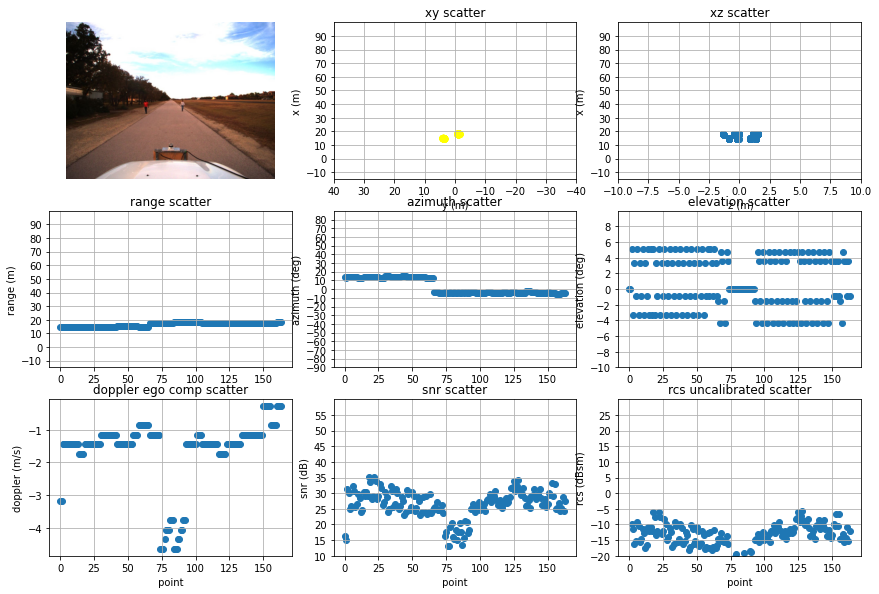

In [51]:
radar_stats.plot_data(ped_data, ped_cam)

In [ ]:
car_data_f = car_data[0]
for x in tqdm(car_data[1:]):
    car_data_f = np.vstack((car_data_f,x))
    
ped_data_f = ped_data[0]
for x in tqdm(ped_data[1:]):
    ped_data_f = np.vstack((ped_data_f,x))

bicycle_data_f = bicycle_data[0]
for x in tqdm(bicycle_data[1:]):
    bicycle_data_f = np.vstack((bicycle_data_f,x))

np.save('car_data_f', car_data_f)
np.save('ped_data_f', ped_data_f)
np.save('bicycle_data_f', bicycle_data_f)

In [ ]:
car_data_f = np.load('car_data_f.npy')
ped_data_f = np.load('ped_data_f.npy')
bicycle_data_f = np.load('bicycle_data_f.npy')

In [ ]:
car_data_f_range = car_data_f[:,1]
car_data_f_snr = 10**(car_data_f[:,6]/10)
car_data_f_rcs = 10**(car_data_f[:,7]/10)
stats_car_snr_mean, bin_edges, _ = stats.binned_statistic(car_data_f_range, car_data_f_snr, 'mean', bins=20)
stats_car_snr_max, bin_edges, _ = stats.binned_statistic(car_data_f_range, car_data_f_snr, 'max', bins=20)
stats_car_snr_std, bin_edges, _ = stats.binned_statistic(car_data_f_range, 10*np.log10(car_data_f_snr), 'std', bins=20)

stats_car_rcs_mean, bin_edges, _ = stats.binned_statistic(car_data_f_range, car_data_f_rcs, 'mean', bins=20)
stats_car_rcs_max, bin_edges, _ = stats.binned_statistic(car_data_f_range, car_data_f_rcs, 'max', bins=20)
stats_car_rcs_std, bin_edges, _ = stats.binned_statistic(car_data_f_range, 10*np.log10(car_data_f_rcs), 'std', bins=20)
bin_car_c = (bin_edges[0:-1] + bin_edges[1:])/2

In [ ]:
#######{{ Theoretical SNR vs range curves
'''
snr_profile_ranges = [  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13, \
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26, \
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39, \
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52, \
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65, \
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78, \
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91, \
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, \
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, \
       118, 119, 120]



snr_profile_vp104_0 =np.array([-100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, \
       -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, \
       -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, \
       -100, -100, -100, -100,   11,   16,   18,   19,   20,   20,   21, \
         21,   21,   21,   21,   21,   21,   21,   21,   21,   21,   21, \
         21,   21,   21,   21,   21,   21,   21,   20,   20,   20,   20, \
         20,   20,   20,   20,   20,   19,   19,   19,   19,   19,   19, \
         19,   19,   19,   18,   18,   18,   18,   18,   18,   18,   18, \
         18,   17,   17,   17,   17,   17,   17,   17,   17,   17,   16, \
         16,   16,   16,   16,   16,   16,   16,   16,   16,   15,   15, \
         15,   15,   15,   15,   15,   15,   15,   15,   14,   14 ])
		 
snr_profile_vp114_3d = np.array([81, 74, 70, 66, 63, 61, 59, 57, 56, 55, 53, 52, 51, 50, 49, 49, 48, \
       47, 46, 46, 45, 45, 44, 43, 43, 42, 42, 41, 41, 41, 40, 40, 39, 39, \
       39, 38, 38, 37, 37, 37, 36, 36, 36, 36, 35, 35, 35, 34, 34, 34, 34, \
       33, 33, 33, 33, 32, 32, 32, 32, 32, 31, 31, 31, 31, 30, 30, 30, 30, \
       30, 30, 29, 29, 29, 29, 29, 28, 28, 28, 28, 28, 28, 27, 27, 27, 26, \
       26, 26, 26, 25, 25, 25, 25, 24, 24, 24, 24, 23, 23, 23, 23, 22, 22, \
       22, 22, 21, 21, 21, 21, 20, 20, 20, 20, 19, 19, 19, 19, 18, 18, 18, \
       18])
	   
snr_profile_vp114_2d = np.array([78, 71, 67, 63, 60, 58, 56, 54, 53, 52, 50, 49, 48, 47, 46, 46, 45, \
       44, 43, 43, 42, 42, 41, 40, 40, 39, 39, 38, 38, 38, 37, 37, 36, 36, \
       36, 35, 35, 34, 34, 34, 33, 33, 33, 33, 32, 32, 32, 31, 31, 31, 31, \
       30, 30, 30, 30, 29, 29, 29, 29, 29, 28, 28, 28, 28, 27, 27, 27, 27, \
       27, 27, 26, 26, 26, 26, 26, 25, 25, 25, 25, 25, 25, 24, 24, 24, 23, \
       23, 23, 23, 22, 22, 22, 22, 21, 21, 21, 21, 20, 20, 20, 20, 19, 19, \
       19, 19, 18, 18, 18, 18, 17, 17, 17, 17, 16, 16, 16, 16, 15, 15, 15, \
       15])
'''
snr_profile_ranges = np.array([0.        ,  0.31349206,  0.62698412,  0.94047618,  1.25396824,\
        1.56746031,  1.88095237,  2.19444443,  2.50793649,  2.82142855,\
        3.13492061,  3.44841267,  3.76190473,  4.07539679,  4.38888885,\
        4.70238092,  5.01587298,  5.32936504,  5.6428571 ,  5.95634916,\
        6.26984122,  6.58333328,  6.89682534,  7.2103174 ,  7.52380947,\
        7.83730153,  8.15079359,  8.46428565,  8.77777771,  9.09126977,\
        9.40476183,  9.71825389, 10.03174595, 10.34523802, 10.65873008,\
       10.97222214, 11.2857142 , 11.59920626, 11.91269832, 12.22619038,\
       12.53968244, 12.8531745 , 13.16666656, 13.48015863, 13.79365069,\
       14.10714275, 14.42063481, 14.73412687, 15.04761893, 15.36111099,\
       15.67460305, 15.98809511, 16.30158718, 16.61507924, 16.9285713 ,\
       17.24206336, 17.55555542, 17.86904748, 18.18253954, 18.4960316 ,\
       18.80952366, 19.12301573, 19.43650779, 19.74999985, 20.06349191,\
       20.37698397, 20.69047603, 21.00396809, 21.31746015, 21.63095221,\
       21.94444427, 22.25793634, 22.5714284 , 22.88492046, 23.19841252,\
       23.51190458, 23.82539664, 24.1388887 , 24.45238076, 24.76587282,\
       25.07936489, 25.39285695, 25.70634901, 26.01984107, 26.33333313,\
       26.64682519, 26.96031725, 27.27380931, 27.58730137, 27.90079344,\
       28.2142855 , 28.52777756, 28.84126962, 29.15476168, 29.46825374,\
       29.7817458 , 30.09523786, 30.40872992, 30.72222198, 31.03571405,\
       31.34920611, 31.66269817, 31.97619023, 32.28968229, 32.60317435,\
       32.91666641, 33.23015847, 33.54365053, 33.8571426 , 34.17063466,\
       34.48412672, 34.79761878, 35.11111084, 35.4246029 , 35.73809496,\
       36.05158702, 36.36507908, 36.67857115, 36.99206321, 37.30555527,\
       37.61904733, 37.93253939, 38.24603145, 38.55952351, 38.87301557,\
       39.18650763, 39.49999969, 39.81349176, 40.12698382, 40.44047588,\
       40.75396794, 41.06746   , 41.38095206, 41.69444412, 42.00793618,\
       42.32142824, 42.63492031, 42.94841237, 43.26190443, 43.57539649,\
       43.88888855, 44.20238061, 44.51587267, 44.82936473, 45.14285679,\
       45.45634885, 45.76984092, 46.08333298, 46.39682504, 46.7103171 ,\
       47.02380916, 47.33730122, 47.65079328, 47.96428534, 48.2777774 ,\
       48.59126947, 48.90476153, 49.21825359, 49.53174565, 49.84523771,\
       50.15872977, 50.47222183, 50.78571389, 51.09920595, 51.41269802,\
       51.72619008, 52.03968214, 52.3531742 , 52.66666626, 52.98015832,\
       53.29365038, 53.60714244, 53.9206345 , 54.23412656, 54.54761863,\
       54.86111069, 55.17460275, 55.48809481, 55.80158687, 56.11507893,\
       56.42857099, 56.74206305, 57.05555511, 57.36904718, 57.68253924,\
       57.9960313 , 58.30952336, 58.62301542, 58.93650748, 59.24999954,\
       59.5634916 , 59.87698366, 60.19047573, 60.50396779, 60.81745985,\
       61.13095191, 61.44444397, 61.75793603, 62.07142809, 62.38492015,\
       62.69841221, 63.01190427, 63.32539634, 63.6388884 , 63.95238046,\
       64.26587252, 64.57936458, 64.89285664, 65.2063487 , 65.51984076,\
       65.83333282, 66.14682489, 66.46031695, 66.77380901, 67.08730107,\
       67.40079313, 67.71428519, 68.02777725, 68.34126931, 68.65476137,\
       68.96825344, 69.2817455 , 69.59523756, 69.90872962, 70.22222168,\
       70.53571374, 70.8492058 , 71.16269786, 71.47618992, 71.78968198,\
       72.10317405, 72.41666611, 72.73015817, 73.04365023, 73.35714229,\
       73.67063435, 73.98412641, 74.29761847, 74.61111053, 74.9246026 ,\
       75.23809466, 75.55158672, 75.86507878, 76.17857084, 76.4920629 ,\
       76.80555496, 77.11904702, 77.43253908, 77.74603115, 78.05952321,\
       78.37301527, 78.68650733, 78.99999939, 79.31349145, 79.62698351,\
       79.94047557])
snr_profile_vp114_avg = np.array([-100.        , -100.        , -100.        ,   57.36896437,\
         58.39201482,   58.03743948,   57.36896437,   56.62929304,\
         55.89324009,   55.18607498,   54.5156143 ,   53.88295734,\
         53.28656472,   52.72393417,   52.19231805,   51.68903124,\
         51.21157597,   50.75768288,   50.32531401,   49.91264895,\
         49.51806483,   49.14011479,   48.77750724,   48.42908701,\
         48.09381851,   47.77077093,   47.45910547,   47.15806417,\
         46.86696026,   46.58516993,   46.312125  ,   46.04730676,\
         45.79024052,   45.54049084,   45.29765744,   45.06137158,\
         44.83129287,   44.60710648,   44.38852071,   44.17526476,\
         43.96708684,   43.76375243,   43.56504277,   43.37075347,\
         43.18069331,   42.99468312,   42.81255482,   42.63415052,\
         42.4593217 ,   42.28792852,   42.11983913,   41.95492912,\
         41.7930809 ,   41.6341833 ,   41.47813104,   41.32482437,\
         41.17416867,   41.02607412,   40.88045536,   40.73723121,\
         40.59632441,   40.45766139,   40.32117199,   40.18678928,\
         40.05444939,   39.92409128,   39.79565662,   39.66908958,\
         39.54433676,   39.42134698,   39.30007121,   39.18046242,\
         39.0624755 ,   38.94606713,   38.8311957 ,   38.71782123,\
         38.60590526,   38.49541082,   38.3863023 ,   38.27854541,\
         38.17210713,   38.06695563,   37.9630602 ,   37.86039124,\
         37.75892016,   37.65861938,   37.55946223,   37.46142297,\
         37.3644767 ,   37.26859935,   37.17376762,   37.079959  ,\
         36.98715165,   36.89532446,   36.80445696,   36.71452932,\
         36.62552231,   36.53741729,   36.45019619,   36.36384146,\
         36.27833607,   36.1936635 ,   36.10980769,   36.02675305,\
         35.94448442,   35.86298709,   35.78224673,   35.70224943,\
         35.62298164,   35.54443019,   35.46658226,   35.38942537,\
         35.31294736,   35.2371364 ,   35.16198096,   35.08746981,\
         35.01359202,   34.9403369 ,   34.86769405,   34.79565334,\
         34.72420486,   34.65333897,   34.58304625,   34.51331751,\
         34.44414377,   34.37551627,   34.30742646,   34.23986598,\
         34.17282668,   34.10630057,   34.04027986,   33.97475694,\
         33.90972436,   33.84517483,   33.78110125,   33.71749664,\
         33.65435419,   33.59166724,   33.52942927,   33.46763389,\
         33.40627486,   33.34534606,   33.2848415 ,   33.22475531,\
         33.16508176,   33.10581522,   33.04695017,   32.98848121,\
         32.93040306,   32.87271052,   32.8153985 ,   32.75846204,\
         32.70189622,   32.64569627,   32.58985748,   32.53437525,\
         32.47924504,   32.42446243,   32.37002305,   32.31592263,\
         32.26215699,   32.208722  ,   32.15561363,   32.1028279 ,\
         32.05036093,   31.99820888,   31.946368  ,   31.8948346 ,\
         31.84360505,   31.7926758 ,   31.74204334,   31.69170424,\
         31.64165511,   31.59189264,   31.54241357,   31.49321467,\
         31.44429281,   31.39564488,   31.34726782,   31.29915865,\
         31.2513144 ,   31.20373218,   31.15640914,   31.10934247,\
         31.0625294 ,   31.01596722,   30.96965325,   30.92358487,\
         30.87775947,   30.83217452,   30.78682751,   30.74171595,\
         30.69683743,   30.65218954,   30.60776994,   30.56357628,\
         30.5196063 ,   30.47585774,   30.43232838,   30.38901603,\
         30.34591854,   30.30303379,   30.26035969,   30.21789419,\
         30.17563525,   30.13358087,   30.09172909,   30.05007796,\
         30.00862557,   29.96737002,   29.92630947,   29.88544207,\
         29.84476602,   29.80427953,   29.76398084,   29.72386823,\
         29.68393998,   29.6441944 ,   29.60462984,   29.56524464,\
         29.5260372 ,   29.48700591,   29.4481492 ,   29.40946551,\
         29.37095331,   29.3326111 ,   29.29443736,   29.25643063,\
         29.21858946,   29.18091241,   29.14339806,   29.10604501,\
         29.06885188,   29.03181732,   28.99493996,   28.95821849,\
         28.92165159,   28.88523796,   28.84897634,   28.81286544,\
         28.77690403,   28.74109087,   28.70542475,   28.66990447,\
         28.63452882,   28.59929666,   28.5642068 ,   28.52925812,\
         28.49444947,   28.45977974,   28.42524783,   28.39085264,\
         28.3565931 ,   28.32246814,   28.28847671,   28.23741796])
##### }}

plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,2), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,2), loc=(0,1))
ax1.plot(bin_car_c, 10*np.log10(stats_car_snr_mean), 'b', label='mean')
ax1.plot(bin_car_c, 10*np.log10(stats_car_snr_max), 'c', label='max')
ax1.plot(bin_car_c, 10*np.log10(stats_car_snr_mean) + stats_car_snr_std, 'r-.', label='std')
ax1.plot(bin_car_c, 10*np.log10(stats_car_snr_mean) - stats_car_snr_std, 'r-.')
ax1.fill_between(bin_car_c, 10*np.log10(stats_car_snr_mean), 10*np.log10(stats_car_snr_mean) + stats_car_snr_std, alpha=0.1)
ax1.fill_between(bin_car_c, 10*np.log10(stats_car_snr_mean), 10*np.log10(stats_car_snr_mean) - stats_car_snr_std, alpha=0.1)
ax1.plot(snr_profile_ranges, snr_profile_vp114_avg + 10, 'k-.', label='theory: 10dBsm')
ax1.set_xlabel('range (m)')
ax1.set_ylabel('dB')
ax1.set_title('SNR- CAR')
ax1.set_ylim([10,70])
ax1.legend()

ax2.plot(bin_car_c, 10*np.log10(stats_car_rcs_mean), 'b')
ax2.plot(bin_car_c, 10*np.log10(stats_car_rcs_max), 'c', label='max')
ax2.plot(bin_car_c, 10*np.log10(stats_car_rcs_mean) + stats_car_rcs_std, 'r-.')
ax2.plot(bin_car_c, 10*np.log10(stats_car_rcs_mean) - stats_car_rcs_std, 'r-.')
ax2.fill_between(bin_car_c, 10*np.log10(stats_car_rcs_mean), 10*np.log10(stats_car_rcs_mean) + stats_car_rcs_std, alpha=0.1)
ax2.fill_between(bin_car_c, 10*np.log10(stats_car_rcs_mean), 10*np.log10(stats_car_rcs_mean) - stats_car_rcs_std, alpha=0.1)
ax2.set_ylim([-25, 10])
ax2.set_xlabel('range (m)')
ax2.set_ylabel('dBsm')
ax2.set_title('RCS-CAR')
ax2.legend()


In [ ]:
# importing libraries for polynomial transform
from sklearn.preprocessing import PolynomialFeatures
# for creating pipeline
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

In [ ]:
# fit a cubic polynomial to CAR RCS
x = bin_car_c
y = 10*np.log10(stats_car_rcs_mean)
# creating pipeline and fitting it on data
Input=[('polynomial',PolynomialFeatures(degree=3)),('model',LinearRegression())]
pipe=Pipeline(Input)
pipe.fit(x.reshape(-1,1),y.reshape(-1,1))

In [ ]:
x = np.arange(1,121)
pred = pipe.predict(x.reshape(-1,1))
pred = pred[:,0]

# prune the prediction 
for i in range(1,pred.shape[0]-1):
    if pred[i] < pred[i-1]:
        pred[i] = pred[i-1] 
    
plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,1), loc=(0,0))
ax1.plot(bin_car_c, 10*np.log10(stats_car_rcs_mean), 'b', label='mean')
ax1.plot(x, pred, 'r')

print(pred)


In [ ]:

ped_data_f_range = ped_data_f[:,1]
ped_data_f_snr = 10**(ped_data_f[:,6]/10)
ped_data_f_rcs = 10**(ped_data_f[:,7]/10)
stats_ped_snr_mean, bin_edges, _ = stats.binned_statistic(ped_data_f_range, ped_data_f_snr, 'mean', bins=20)
stats_ped_snr_max, bin_edges, _ = stats.binned_statistic(ped_data_f_range, ped_data_f_snr, 'max', bins=20)
stats_ped_snr_std, bin_edges, _ = stats.binned_statistic(ped_data_f_range, 10*np.log10(ped_data_f_snr), 'std', bins=20)

stats_ped_rcs_mean, bin_edges, _ = stats.binned_statistic(ped_data_f_range, ped_data_f_rcs, 'mean', bins=20)
stats_ped_rcs_max, bin_edges, _ = stats.binned_statistic(ped_data_f_range, ped_data_f_rcs, 'max', bins=20)
stats_ped_rcs_std, bin_edges, _ = stats.binned_statistic(ped_data_f_range, 10*np.log10(ped_data_f_rcs), 'std', bins=20)
bin_ped_c = (bin_edges[0:-1] + bin_edges[1:])/2

In [ ]:
plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,2), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,2), loc=(0,1))
ax1.plot(bin_ped_c, 10*np.log10(stats_ped_snr_mean), 'b')
ax1.plot(bin_ped_c, 10*np.log10(stats_ped_snr_max), 'c', label='max')
ax1.plot(bin_ped_c, 10*np.log10(stats_ped_snr_mean) + stats_ped_snr_std, 'r-.')
ax1.plot(bin_ped_c, 10*np.log10(stats_ped_snr_mean) - stats_ped_snr_std, 'r-.')
ax1.fill_between(bin_ped_c, 10*np.log10(stats_ped_snr_mean), 10*np.log10(stats_ped_snr_mean) + stats_ped_snr_std, alpha=0.1)
ax1.fill_between(bin_ped_c, 10*np.log10(stats_ped_snr_mean), 10*np.log10(stats_ped_snr_mean) - stats_ped_snr_std, alpha=0.1)
ax1.plot(snr_profile_ranges, snr_profile_vp114_avg - 10 , 'k-.', label='theory: -10dBsm')
ax1.set_xlabel('range (m)')
ax1.set_ylabel('dB')
ax1.set_title('SNR-Ped')
ax1.legend()
ax1.set_ylim([10,50])

ax2.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_mean), 'b')
ax2.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_max), 'c', label='max')
ax2.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_mean) + stats_ped_rcs_std, 'r-.')
ax2.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_mean) - stats_ped_rcs_std, 'r-.')
ax2.fill_between(bin_ped_c, 10*np.log10(stats_ped_rcs_mean), 10*np.log10(stats_ped_rcs_mean) + stats_ped_rcs_std, alpha=0.1)
ax2.fill_between(bin_ped_c, 10*np.log10(stats_ped_rcs_mean), 10*np.log10(stats_ped_rcs_mean) - stats_ped_rcs_std, alpha=0.1)
ax2.set_xlabel('range (m)')
ax2.set_ylabel('dB')
ax2.set_title('RCS-Ped')
ax2.legend()

In [ ]:
# fit a cubic polynomial to PED RCS
x = bin_ped_c
y = 10*np.log10(stats_ped_rcs_mean)
# creating pipeline and fitting it on data
Input=[('polynomial',PolynomialFeatures(degree=2)),('model',LinearRegression())]
pipe=Pipeline(Input)
pipe.fit(x.reshape(-1,1),y.reshape(-1,1))

In [ ]:
x = np.arange(1,121)
pred = pipe.predict(x.reshape(-1,1))
pred = pred[:,0]

# prune the prediction 
for i in range(1,pred.shape[0]-1):
    if pred[i] < pred[i-1]:
        pred[i] = pred[i-1] 
    
plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,1), loc=(0,0))
ax1.plot(bin_car_c, 10*np.log10(stats_ped_rcs_mean), 'b', label='mean')
ax1.plot(x, pred, 'r')

print(pred)

In [ ]:

bicycle_data_f_range = bicycle_data_f[:,1]
bicycle_data_f_snr = 10**(bicycle_data_f[:,6]/10)
bicycle_data_f_rcs = 10**(bicycle_data_f[:,7]/10)
stats_bicycle_snr_mean, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, bicycle_data_f_snr, 'mean', bins=20)
stats_bicycle_snr_max, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, bicycle_data_f_snr, 'max', bins=20)
stats_bicycle_snr_std, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, 10*np.log10(bicycle_data_f_snr), 'std', bins=20)

stats_bicycle_rcs_mean, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, bicycle_data_f_rcs, 'mean', bins=20)
stats_bicycle_rcs_max, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, bicycle_data_f_rcs, 'max', bins=20)
stats_bicycle_rcs_std, bin_edges, _ = stats.binned_statistic(bicycle_data_f_range, 10*np.log10(bicycle_data_f_rcs), 'std', bins=20)
bin_bicycle_c = (bin_edges[0:-1] + bin_edges[1:])/2

In [ ]:
plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,2), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,2), loc=(0,1))
ax1.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_mean), 'b')
ax1.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_max), 'c', label='max')
ax1.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_mean) + stats_bicycle_snr_std, 'r-.')
ax1.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_mean) - stats_bicycle_snr_std, 'r-.')
ax1.fill_between(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_mean), 10*np.log10(stats_bicycle_snr_mean) + stats_bicycle_snr_std, alpha=0.1)
ax1.fill_between(bin_bicycle_c, 10*np.log10(stats_bicycle_snr_mean), 10*np.log10(stats_bicycle_snr_mean) - stats_bicycle_snr_std, alpha=0.1)
ax1.set_xlabel('range (m)')
ax1.set_ylabel('dB')
ax1.set_title('SNR-bicycle')
ax1.legend()

ax2.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean), 'b')
ax2.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_max), 'c', label='max')
ax2.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean) + stats_bicycle_rcs_std, 'r-.')
ax2.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean) - stats_bicycle_rcs_std, 'r-.')
ax2.fill_between(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean), 10*np.log10(stats_bicycle_rcs_mean) + stats_bicycle_rcs_std, alpha=0.1)
ax2.fill_between(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean), 10*np.log10(stats_bicycle_rcs_mean) - stats_bicycle_rcs_std, alpha=0.1)
ax2.set_xlabel('range (m)')
ax2.set_ylabel('dB')
ax2.set_title('RCS bicycle')
ax2.legend()

In [ ]:
plt.figure()
plt.scatter(car_data_mean_range, car_data_mean_snr)

In [ ]:
ped_data_mean_snr = [np.mean(data[:,6]) for data in ped_data]
ped_data_std_snr = [np.std(data[:,6]) for data in ped_data]
ped_data_mean_range = [np.mean(data[:,1]) for data in ped_data]

In [ ]:
plt.figure()
plt.scatter(ped_data_mean_range, ped_data_mean_snr)

In [ ]:
ped_data_mean_range

In [ ]:
# plotting all classes together
plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,2), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,2), loc=(0,1))

ax1.plot(bin_car_c, 10*np.log10(stats_car_rcs_mean), 'r', label='car')
ax1.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_mean), 'g', label='ped')
ax1.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_mean), 'b', label='bicycle')
ax1.legend()
ax1.set_xlabel('range (m)')
ax1.set_ylabel('RCS (dBsm)')
ax1.set_title('uncalib mean RCS')

ax2.plot(bin_car_c, 10*np.log10(stats_car_rcs_max), 'r', label='car')
ax2.plot(bin_ped_c, 10*np.log10(stats_ped_rcs_max), 'g', label='ped')
ax2.plot(bin_bicycle_c, 10*np.log10(stats_bicycle_rcs_max), 'b', label='bicycle')
ax2.legend()
ax2.set_xlabel('range (m)')
ax2.set_ylabel('RCS (dBsm)')
ax2.set_title('uncalib max RCS')

In [ ]:
# azimuth scatter
#plt.figure()
#plt.scatter(np.arange(0,car_data_f.shape[0]), car_data_f[:,2])

plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,3), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,3), loc=(0,1))
ax3 = plt.subplot2grid(shape=(1,3), loc=(0,2))

#ax1.scatter(np.arange(0,car_data_f.shape[0]), car_data_f[:,1])
#ax1.set_ylabel('range (m)')
#ax1.set_title('range scatter - Car')

ax1.hist(car_data_f[:,1])
ax1.set_ylabel('range (m)')
ax1.set_title('range scatter - Car')

ax2.hist(car_data_f[:,2]*180/np.pi)
ax2.set_ylabel('az (deg)')
ax2.set_title('azimuth scatter - Car')

ax3.hist(car_data_f[:,5])
ax3.set_ylabel('dopp (m/s)')
ax3.set_title('doppler scatter - Car')

In [ ]:
# azimuth scatter
#plt.figure()
#plt.scatter(np.arange(0,ped_data_f.shape[0]), ped_data_f[:,2])

plt.figure()
ax = plt.GridSpec(1, 2)
ax.update(wspace=0.5, hspace=1.0)
fig = plt.figure(figsize=(12,6))
ax1 = plt.subplot2grid(shape=(1,3), loc=(0,0))
ax2 = plt.subplot2grid(shape=(1,3), loc=(0,1))
ax3 = plt.subplot2grid(shape=(1,3), loc=(0,2))

ax1.hist(ped_data_f[:,1])
ax1.set_ylabel('range (m)')
ax1.set_title('range scatter - Ped')

ax2.hist(ped_data_f[:,2]*180/np.pi)
ax2.set_ylabel('az (deg)')
ax2.set_title('azimuth scatter - Ped')

ax3.hist(ped_data_f[:,5])
ax3.set_ylabel('dopp (m/s)')
ax3.set_title('doppler scatter - Ped')

In [ ]:
# azimuth scatter
plt.figure()
plt.scatter(np.arange(0,bicycle_data_f.shape[0]), bicycle_data_f[:,2])

#### build SVM RBF classifier for Car vs. Ped

In [ ]:
# data format
# <timestamp, range, az, el, doppler, doppler_ego_comp, snr, rcs, label_id>

In [ ]:
def vectorize_list(data):
    data_vec = data[0]
    for d in tqdm(data[1:]):
        data_vec = np.vstack((data_vec, d))
    return data_vec

def polar_to_cartesian(r: float, dopp: float, az: float, el: float) -> list:
        '''
        r: range in m
        az: azimuth angle in rad
        el: elevation angle in rad
        returns list of (x,y,z,vx,vy,vz) where x is forward, y is lateral and z i up-down
        '''
        x = r*np.cos(el)*np.cos(az)
        y = r*np.cos(el)*np.sin(az)
        z = r*np.sin(el)

        vx = dopp*np.cos(el)*np.cos(az)
        vy = dopp*np.cos(el)*np.sin(az)
        vz = dopp*np.sin(el)

        return [x, y, z, vx, vy, vz]

def clustering(data: list):
    # go through every list element and perform clustering
    dataset = []
    for d_pt in tqdm(data):
        r = d_pt[:,1]
        dopp_ego_comp = d_pt[:,5]
        az = d_pt[:,2]
        el = d_pt[:,3]
        x, y, z, vx, vy, vz = polar_to_cartesian(r, dopp_ego_comp, az, el)
        #d_ = d_pt[:,0:2] # take xcc and ycc for clustering
        x = np.array(x)[:,None]
        y = np.array(y)[:,None]
        z = np.array(z)[:,None]
        d_ = np.hstack((x,y,z))# take xcc and ycc for clustering
        clust = DBSCAN(eps=3, min_samples=2).fit(d_)
        # number of unique labels
        unique_labels = set(clust.labels_)
        for lab in unique_labels:
            index_flag = clust.labels_ == lab
            data_cluster = d_pt[index_flag,:]
            #{{ compute features #########
            r_mean = np.mean(data_cluster[:,1]) # mean range
            r_std = np.std(data_cluster[:,1]) # std range
            rcs_mean = 10*np.log10(np.mean(10**(data_cluster[:,7]/10))) # mean RCS in dB
            rcs_std = np.std(data_cluster[:,7])**2 # std RCS in dB
            snr_mean = 10*np.log10(np.mean(10**(data_cluster[:,6]/10))) # mean SNR in dB
            snr_std = np.std(data_cluster[:,6]) # std SNR in dB
            r_dopp_ego_comp_mean = np.mean(data_cluster[:,5]) # mean doppler
            r_dopp_ego_comp_std = np.std(data_cluster[:,5]) # std doppler
            long_width = np.maximum(0,np.amax(x[index_flag,0]) - np.amin(x[index_flag,0])) # cluster width along longitudinal axis
            lat_width = np.maximum(0,np.amax(y[index_flag,0]) - np.amin(y[index_flag,0])) # cluster width along longitudinal axis
            data_label = np.mean(data_cluster[:,-1]) # data label
            # }}
            dataset.append(np.array([r_mean, r_std, rcs_mean, rcs_std, snr_mean, snr_std,\
                                     r_dopp_ego_comp_mean, r_dopp_ego_comp_std,\
                                     long_width, lat_width, data_label]))
            
    return dataset

In [ ]:
dataset_car = clustering(car_data)
dataset_ped = clustering(ped_data)
dataset_bicycle = clustering(bicycle_data)

In [ ]:
# vectorize the data list
data_car_vec = vectorize_list(dataset_car)
data_ped_vec = vectorize_list(dataset_ped)
data_bicycle_vec = vectorize_list(dataset_bicycle)

In [ ]:
len(data_car_vec), len(data_ped_vec), len(data_bicycle_vec)

In [ ]:
#X_car = data_car_vec[:,0:9]
#X_ped = data_ped_vec[:,0:9]

#X_car = np.hstack((data_car_vec[:,0:3], data_car_vec[:,5:9])) # removing SNR as feature
#X_ped = np.hstack((data_ped_vec[:,0:3], data_ped_vec[:,5:9])) # removing SNR as feature
#X_bicycle = np.hstack((data_bicycle_vec[:,0:3], data_bicycle_vec[:,5:9])) # removing SNR as feature

# removing SNR, mean range, as feature from the set
#X_car = np.hstack((data_car_vec[:,1:4], data_car_vec[:,6:10])) 
#X_ped = np.hstack((data_ped_vec[:,1:4], data_ped_vec[:,6:10]))
#X_bicycle = np.hstack((data_bicycle_vec[:,1:4], data_bicycle_vec[:,6:10])) 

# removing SNR, mean range, as feature from the set
#X_car = np.hstack((data_car_vec[:,2:4], data_car_vec[:,6:10])) 
#X_ped = np.hstack((data_ped_vec[:,2:4], data_ped_vec[:,6:10]))
#X_bicycle =  np.hstack((data_bicycle_vec[:,2:4], data_bicycle_vec[:,6:10]))

X_car = data_car_vec[:,2:4]
X_ped = data_ped_vec[:,2:4]
X_bicycle =  data_bicycle_vec[:,2:4]

In [ ]:
# looks like in this dataset, mean rcs, std rcs, cluster length, cluster width are sufficient features 
# adding range, doppler related features adds no performance improvement in this dataset since we don't have
# enough representation of fast moving cars and so on..

In [ ]:
y_car = np.zeros(X_car.shape[0])
y_ped = np.ones(X_ped.shape[0]+X_bicycle.shape[0])

In [ ]:
# overall data
X = np.vstack((X_car, X_ped, X_bicycle))
y = np.hstack((y_car, y_ped))

In [ ]:
# train/test split
X_, X_test, y_, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_, y_, test_size=0.1, random_state=42, stratify=y_)

In [ ]:
X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

In [ ]:
# verifying similar class distributions due to stratified sampling
sum(y_ == 1)/len(y), sum(y_test == 1)/len(y_test), sum(y_train == 1)/len(y_train), sum(y_val == 1)/len(y_val)

In [ ]:
# perform column standardization
scaler = StandardScaler()
scaler.fit(X_train)

In [ ]:
print(scaler.mean_, scaler.var_)

In [ ]:
# transform data with column standardization
X_train_tr = scaler.transform(X_train)
X_val_tr = scaler.transform(X_val)
X_test_tr = scaler.transform(X_test)

In [ ]:
# loop over regularization parameter
exponent = np.arange(-6,7)
train_metrics = []
val_metrics = []
clf_list = []
for e in exponent:
    print(10**float(e))
    clf = LogisticRegression(penalty='l2', C =10**(float(e)), random_state=0, class_weight='balanced').fit(X_train_tr, y_train)
    auc_score_train = roc_auc_score(y_train, clf.predict_proba(X_train_tr)[:, 1])
    auc_score_val = roc_auc_score(y_val, clf.predict_proba(X_val_tr)[:, 1])
    val_metrics.append(auc_score_val)
    train_metrics.append(auc_score_train)
    clf_list.append(clf)

In [ ]:
val_metrics

In [ ]:
clf_ = clf_list[10]
y_pred = clf_.predict(X_test_tr)
cf_mat = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cf_mat, display_labels=clf_.classes_)
disp.plot()

In [ ]:
abs(clf_.coef_)

In [ ]:
np.amax(clf_.predict_proba(X_test_tr), axis=-1)

#### run PCA before training

In [ ]:

from sklearn.decomposition import IncrementalPCA
pca = IncrementalPCA(n_components = 2)
X_train_pca = pca.fit_transform(X_train_tr)
X_val_pca = pca.fit_transform(X_val_tr)
X_test_pca = pca.fit_transform(X_test_tr)

In [ ]:
# loop over regularization parameter
exponent = np.arange(-6,7)
train_metrics = []
val_metrics = []
clf_list = []
for e in exponent:
    print(10**float(e))
    clf = LogisticRegression(penalty='l2', C =10**(float(e)), random_state=0, class_weight='balanced').fit(X_train_pca, y_train)
    auc_score_train = roc_auc_score(y_train, clf.predict_proba(X_train_pca)[:, 1])
    auc_score_val = roc_auc_score(y_val, clf.predict_proba(X_val_pca)[:, 1])
    val_metrics.append(auc_score_val)
    train_metrics.append(auc_score_train)
    clf_list.append(clf)

In [ ]:
val_metrics

In [ ]:
clf_ = clf_list[8]
y_pred = clf_.predict(X_val_pca)
cf_mat = confusion_matrix(y_val, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cf_mat, display_labels=clf_.classes_)
disp.plot()

In [ ]:
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
x_min, x_max = X_train_pca[:, 0].min() - 0.5, X_train_pca[:, 0].max() + 0.5
y_min, y_max = X_train_pca[:, 1].min() - 0.5, X_train_pca[:, 1].max() + 0.5
h = 0.02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = clf_.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Paired)

# Plot also the training points
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, edgecolors="k", cmap=plt.cm.Paired)
plt.xlabel("PCA feature-1")
plt.ylabel("PCA feature-2")

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xticks(())
plt.yticks(())

plt.show()

#### Evaluation of classifier on Real Uhnder Datasets from Field (Note this might be different distribution but just curious evaluation)

In [ ]:
class EvalTrack_Classifier():
        
    trackerfile_colname_to_index = {'trackid': 0,
                                    'scanid': 1,
                                    'x': 2,
                                    'y': 3,
                                    'z': 4,
                                    'dopp_x': 5,
                                    'dopp_y': 6,
                                    'dopp_z': 7,
                                    'timestamp': 8,
                                    'num_contrib': 9,
                                    'clusterid': 10,
                                    'sensorid': 11,
                                    'size_x': 12,
                                    'size_y': 13,
                                    'size_z': 14,
                                    'acc_x': 15,
                                    'acc_y': 16,
                                    'acc_z': 17,
                                    'snr': 18,
                                    'class': 19,
                                    'class_prob': 20,
                                    'prob_ex': 21
                                   }
    
    clusterfile_colname_to_index = {'scanid': 0,
                                    'clusterid': 1,
                                    'sensorid': 2,
                                    'measid': 3,
                                    'range': 4,
                                    'azimuth': 5,
                                    'elevation': 6,
                                    'doppler': 7,
                                    'snr': 8,
                                    'timestamp': 9
                                    }
    
    odomfile_colname_to_index = {'timestamp': 1,
                                 'x': 2,
                                 'y': 3,
                                 'z': 4,
                                 'x_vel': 5,
                                 'y_vel': 6,
                                 'z_vel': 7,
                                 'roll': 8,
                                 'pitch': 9,
                                 'yaw': 10,
                                 'roll_rate': 11,
                                 'pitch_rate': 12,
                                 'yaw_rate': 13
                                 }
    
    trackerdatadict_colname_to_index = {'timestamp': 0,
                                        'clusterid': 1,
                                        'sensorid': 2,
                                        'x': 3,
                                        'y': 4,
                                        'z': 5,
                                        'dopp_x': 6,
                                        'dopp_y': 7,
                                        'dopp_z': 8,
                                        'num_contrib': 9,
                                        'scanid': 10,
                                        'size_x': 11,
                                        'size_y': 12,
                                        'size_z': 13,
                                        'acc_x': 14,
                                        'acc_y': 15,
                                        'acc_z': 16,
                                        'snr': 17,
                                        'class': 18,
                                        'class_prob': 19,
                                        'prob_ex': 20
                                        }
    
    clusterdatadict_colname_to_index = {'timestamp': 0,
                                        'scanid': 1,
                                        'sensorid': 2,
                                        'range': 3,
                                        'azimuth': 4,
                                        'elevation': 5,
                                        'doppler': 6,
                                        'snr': 7,
                                        'x': 8,
                                        'y': 9,
                                        'z': 10,
                                        'dopp_x': 11,
                                        'dopp_y': 12,
                                        'dopp_z': 13
                                        }
    
    odomdatadict_colname_to_index = {'x': 0,
                                     'y': 1,
                                     'z': 2,
                                     'x_vel': 3,
                                     'y_vel': 4,
                                     'z_vel': 5,
                                     'roll': 6,
                                     'pitch': 7,
                                     'yaw': 8,
                                     'roll_rate': 9,
                                     'pitch_rate': 10,
                                     'yaw_rate': 11
                                     }
    
    def __init__(self, trackcsv_path=None, clustercsv_path=None, cam_path = None, odom_path=None, clf=None, \
                 dbg_msg_show=False):
        self.trackcsv_path = trackcsv_path
        self.clustercsv_path = clustercsv_path
        self.cam_path = cam_path
        self.odom_path = odom_path
        self.clf = clf # ML based classifier model
        self.dbg_msg_show = dbg_msg_show
        
        self.tracker_mrr_dict = {}
        self.tracker_lrr_dict = {}
        self.cluster_dict = {}
        self.odomdata_dict = {}
        
        # read the logs
        self.read_tracklogs()
        self.read_clusterlogs()
        self.read_odom_logs()
        
    def read_tracklogs(self):
        '''
        this returns data in ego vehicle frame, key is trackid
        '''
         #{scanid: [timestamp,clusterid,sensorid,x,y,z,vx,vy,vz,num_contrib, track_id]} , this is already in vehicle frame
        
        filename = self.trackcsv_path
        with open(filename, mode='r') as csv_file:
            csv_reader = csv.reader(csv_file)
            next(csv_reader, None) # ignore first row since it is a header
            cnt = 0
            for row in csv_reader: # row is a list of str
                # Sachin : adding patch based on new log file format by Aalok/Akhil
                num_contrib = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['num_contrib']])
                if num_contrib == 0:
                    clusterid = -1
                    sensorid = -1
                    scanid = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['scanid']])
                else:
                    clusterid = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['clusterid']])
                    sensorid = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['sensorid']])
                    scanid = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['scanid']])
                
                key_ = int(row[EvalTrack_Classifier.trackerfile_colname_to_index['trackid']])
                if key_ == 0: # means no data given to tracker, so continue to next row
                    continue
                    
                 
                payload = [float(row[EvalTrack_Classifier.trackerfile_colname_to_index['timestamp']]),
                           clusterid,
                           sensorid,
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['x']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['y']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['z']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['dopp_x']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['dopp_y']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['dopp_z']]),
                           int(row[EvalTrack_Classifier.trackerfile_colname_to_index['num_contrib']]),
                           int(row[EvalTrack_Classifier.trackerfile_colname_to_index['scanid']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['size_x']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['size_y']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['size_z']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['acc_x']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['acc_y']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['acc_z']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['snr']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['class']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['class_prob']]),
                           float(row[EvalTrack_Classifier.trackerfile_colname_to_index['prob_ex']])
                          ]
                #print(payload)
                #print(sensorid)
                if sensorid == 2 or sensorid==1: # MRR/LRR together
                    if key_ in self.tracker_mrr_dict:
                        self.tracker_mrr_dict[key_].append(payload)                    
                    else:
                        self.tracker_mrr_dict[key_] = []
                        self.tracker_mrr_dict[key_].append(payload)
                        
                if sensorid == 1: # LRR
                    if key_ in self.tracker_lrr_dict:
                        self.tracker_lrr_dict[key_].append(payload)                    
                    else:
                        self.tracker_lrr_dict[key_] = []
                        self.tracker_lrr_dict[key_].append(payload)
                
 
    def read_clusterlogs(self):
        '''
        this return data in sensor frame
        '''
        filename = self.clustercsv_path
        with open(filename, mode='r') as csv_file:
            csv_reader = csv.reader(csv_file)
            next(csv_reader, None) # ignore first row since it is a header
            cnt = 0
            for row in csv_reader: # row is a list of str               
               
                key_ = int(row[EvalTrack_Classifier.clusterfile_colname_to_index['clusterid']])
                scanid = int(row[EvalTrack_Classifier.clusterfile_colname_to_index['scanid']])
                sensorid = int(row[EvalTrack_Classifier.clusterfile_colname_to_index['sensorid']])

                #scanid = key_               
                payload_polar = [float(row[EvalTrack_Classifier.clusterfile_colname_to_index['timestamp']]),
                                 scanid,
                                 sensorid,
                                 float(row[EvalTrack_Classifier.clusterfile_colname_to_index['range']]),
                                 float(row[EvalTrack_Classifier.clusterfile_colname_to_index['azimuth']]),
                                 float(row[EvalTrack_Classifier.clusterfile_colname_to_index['elevation']]),
                                 float(row[EvalTrack_Classifier.clusterfile_colname_to_index['doppler']]),
                                 float(row[EvalTrack_Classifier.clusterfile_colname_to_index['snr']])
                                ]
                
                payload_cart  = self.polar_to_cartesian(payload_polar[3], payload_polar[6], payload_polar[4], \
                                                        payload_polar[5])
                payload = payload_polar + payload_cart # range, azimuth, elevation, doppler, snr, x, y, z, dopp_x, dopp_y, dopp_z in sensor meas frame
                if key_ in self.cluster_dict:
                    self.cluster_dict[key_].append(payload)
                    
                else:
                    self.cluster_dict[key_] = []
                    self.cluster_dict[key_].append(payload)
  
    def read_odom_logs(self):
        '''
        #platform_name, time, x,y,z, x_vel, y_vel, z_vel, roll, pitch, yaw, roll_rate, pitch_rate, yaw_rate
        '''
        filename = self.odom_path
        fh = open(filename, 'r')
        Lines = fh.readlines()
        fh.close()

        cnt = 0
        for line in Lines:
            row = line.strip() # remove /n from the line
            row = row.split(",") # row is a list of str

            # row[1] (timestamp) is the key
            # mergedata_dict: {timestamp: [x,y,z, x_vel, y_vel, z_vel, roll, pitch, yaw, roll_rate, pitch_rate, yaw_rate]}
            #key = float(row[1]) # timestamp
            
            key = float(row[EvalTrack_Classifier.odomfile_colname_to_index['timestamp']])
            
            #payload_ = row[2::] # x,y,z, x_vel, y_vel, z_vel, roll, pitch, yaw, roll_rate, pitch_rate, yaw_rate
            payload_ = [row[EvalTrack_Classifier.odomfile_colname_to_index['x']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['y']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['z']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['x_vel']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['y_vel']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['z_vel']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['roll']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['pitch']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['yaw']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['roll_rate']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['pitch_rate']],
                        row[EvalTrack_Classifier.odomfile_colname_to_index['yaw_rate']]
                        ]
            payload = [float(x) for x in payload_]
            if key in self.odomdata_dict:
                self.odomdata_dict[key].append(payload)
                
            else:
                self.odomdata_dict[key] = []
                self.odomdata_dict[key].append(payload)
    
    def plot_trackframe(self, trackid: int, idx=None):
        plt.figure()
        ax = plt.GridSpec(3, 3)
        ax.update(wspace=3.0, hspace=3.0)
        fig = plt.figure(figsize=(18,18))
        ax1 = plt.subplot2grid(shape=(5,4), loc=(0,0))
        ax2 = plt.subplot2grid(shape=(5,4), loc=(0,1))
        ax3 = plt.subplot2grid(shape=(5,4), loc=(0,2))
        ax4 = plt.subplot2grid(shape=(5,4), loc=(0,3))
        
        ax5 = plt.subplot2grid(shape=(5,4), loc=(1,0))
        ax6 = plt.subplot2grid(shape=(5,4), loc=(1,1))
        ax7 = plt.subplot2grid(shape=(5,4), loc=(1,2))
        ax8 = plt.subplot2grid(shape=(5,4), loc=(1,3))
        
        ax9 = plt.subplot2grid(shape=(5,4), loc=(2,0))
        ax10 = plt.subplot2grid(shape=(5,4), loc=(2,1))
        ax11 = plt.subplot2grid(shape=(5,4), loc=(2,2))
        ax12 = plt.subplot2grid(shape=(5,4), loc=(2,3))
        
        ax13 = plt.subplot2grid(shape=(5,4), loc=(3,0))
        ax14 = plt.subplot2grid(shape=(5,4), loc=(3,1))
        ax15 = plt.subplot2grid(shape=(5,4), loc=(3,2))
        ax16 = plt.subplot2grid(shape=(5,4), loc=(3,3))
        
        ax17 = plt.subplot2grid(shape=(5,4), loc=(4,0))
        ax18 = plt.subplot2grid(shape=(5,4), loc=(4,1))
        #ax19 = plt.subplot2grid(shape=(5,4), loc=(4,2))
        #ax20 = plt.subplot2grid(shape=(5,4), loc=(4,3))
        
        trackdata = self.tracker_mrr_dict[trackid]
        trackdata = np.array(trackdata)
        if self.dbg_msg_show:
            print(f"number of track points: {trackdata.shape}")
        # sort tracker data array based on timestamp
        
        # get the scanid list for the trackid
        scanids = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['scanid']].astype('int')
        if self.dbg_msg_show:
            print(f"scanids: {scanids}")
        if idx is None:
            img = self.getcam_img(scanids[0])
        else:
            img = self.getcam_img(idx)
        #print(img.shape)
        if img is not None:
            ax1.imshow(img)
        
        t = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['timestamp']]
        xpos = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['x']]
        ypos = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['y']]
        zpos = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['z']]
        ranges = np.sqrt(xpos**2 + ypos**2 + zpos**2)
        speed = np.sqrt(trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_x']]**2 \
                + trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_y']]**2 \
                + trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_z']]**2)
        
        dopp_x = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_x']]
        dopp_y = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_y']]
        dopp_z = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['dopp_z']]
        
        acc = np.sqrt(trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_x']]**2 \
                + trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_y']]**2 \
                + trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_z']]**2)
        
        acc_x = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_x']]
        acc_y = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_y']]
        acc_z = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['acc_z']]
        
        size_x = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['size_x']]
        size_y = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['size_y']]
        size_z = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['size_z']]
        
        
        bayes_class = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['class']]
        bayes_class_prob = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['class_prob']]
        prob_ex = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['prob_ex']]
        
        if self.clf is not None:
            cluster_meas = tracker.get_cluster_meas(trackid)
            MLbased_class, final_MLpred_prob = self.compute_MLbasedpred(cluster_meas, self.clf)
        else:
            MLbased_class = None
            final_MLpred_prob = None
        
        ax2.scatter(ypos, xpos)
        #ax2.set_xlabel('x (m)')
        ax2.set_ylabel('y (m)')
        ax2.set_title('xy scatter')
        
        ax3.scatter(ypos, zpos)
        #ax3.set_xlabel('x (m)')
        ax3.set_ylabel('z (m)')
        ax3.set_title('xz scatter')
        
        ax4.scatter(np.arange(0,len(ranges)), ranges)
        #ax4.scatter(t, ranges)
        #ax4.set_xlabel('time index')
        ax4.set_title('range')
        
        ax5.scatter(np.arange(0,len(speed)), speed)
        #ax5.set_xlabel('time index')
        ax5.set_title('speed (m/s)')
        
        ax6.scatter(np.arange(0,len(ranges)), dopp_x)
        #ax6.set_xlabel('time index')
        ax6.set_title('longitud vel (m/s)')
        
        ax7.scatter(np.arange(0,len(dopp_y)), dopp_y)
        #ax7.set_xlabel('time index')
        ax7.set_title('lateral vel (m/s)')
        
        ax8.scatter(np.arange(0,len(dopp_z)), dopp_z)
        #ax8.set_xlabel('time index')
        ax8.set_title('z vel (m/s)')
        
        ax9.scatter(np.arange(0,len(acc)), acc)
        #ax9.set_xlabel('time index')
        ax9.set_title('acc (m/s^2)')
        
        ax10.scatter(np.arange(0,len(acc_x)), acc_x)
        #ax10.set_xlabel('time index')
        ax10.set_title('acc_x (m/s^2)')
        
        ax11.scatter(np.arange(0,len(acc_y)), acc_y)
        #ax11.set_xlabel('time index')
        ax11.set_title('acc_y (m/s^2)')
        
        ax12.scatter(np.arange(0,len(acc_z)), acc_z)
        #ax12.set_xlabel('time index')
        ax12.set_title('acc_z (m/s^2)')
        
        ax13.scatter(np.arange(0,len(size_x)), size_x)
        #ax13.set_xlabel('time index')
        ax13.set_title('tracker size_x (m)')
        
        ax14.scatter(np.arange(0,len(size_y)), size_y)
        #ax14.set_xlabel('time index')
        ax14.set_title('tracker size_y (m)')
        
        ax15.scatter(np.arange(0,len(size_z)), size_z)
        #ax15.set_xlabel('time index')
        ax15.set_title('tracker size_z (m)')
        
        ax16.scatter(np.arange(0,len(bayes_class)), bayes_class, c='b', label='Baeyes') #MLbased_class
        if self.clf is not None:
            ax16.scatter(np.arange(0,len(MLbased_class)), MLbased_class, c='r', label='ML') 
        #ax16.set_xlabel('time index')
        ax16.set_title('class')
        ax16.legend()
        
        ax17.scatter(np.arange(0,len(bayes_class_prob)), bayes_class_prob, c='b', label='Baeyes') #final_MLpred_prob
        if self.clf is not None:
            ax17.scatter(np.arange(0,len(final_MLpred_prob)), final_MLpred_prob, c='r', label='ML') 
        #ax17.set_xlabel('time index')
        ax17.set_title('class_prob')
        ax17.legend()
        
        ax18.scatter(np.arange(0,len(prob_ex)), prob_ex)
        #ax18.set_xlabel('time index')
        ax18.set_title('track prob exist')
        
        return [t, xpos, ypos, zpos, ranges, speed, dopp_x, dopp_y, dopp_z, acc, acc_x, acc_y, acc_z, size_x, size_y,\
               size_z, bayes_class, bayes_class_prob, MLbased_class, final_MLpred_prob, prob_ex]
    
    def getcam_img(self, scanid: int):
        if self.cam_path is None:
            return None
        img_file = self.cam_path + str(scanid) + '.jpg'
        if self.dbg_msg_show:
            print(img_file)
        # check if file exits
        if os.path.isfile(img_file):
            img = cv2.imread(img_file)[:,:,::-1]
        else:
            img = None
        
        return img
    
    def polar_to_cartesian(self, r: float, dopp: float, az: float, el: float) -> list:
        '''
        r: range in m
        az: azimuth angle in rad
        el: elevation angle in rad
        returns list of (x,y,z,vx,vy,vz) where x is forward, y is lateral and z i up-down
        '''
        x = r*np.cos(el)*np.cos(az)
        y = r*np.cos(el)*np.sin(az)
        z = r*np.sin(el)

        vx = dopp*np.cos(el)*np.cos(az)
        vy = dopp*np.cos(el)*np.sin(az)
        vz = dopp*np.sin(el)

        return [x, y, z, vx, vy, vz]
    
    def get_cluster_meas(self, trackid: int):
        trackdata = self.tracker_mrr_dict[trackid]
        trackdata = np.array(trackdata)
        clusterids = trackdata[:, EvalTrack_Classifier.trackerdatadict_colname_to_index['clusterid']]
        # sort the clusterids
        clusterids = np.sort(clusterids)
        if self.dbg_msg_show:
            print(f"clusterids: {clusterids}")
        
        cluster_meas = []
        for idx in clusterids:
            current_meas = self.cluster_dict[idx]
            cluster_meas.append(current_meas)
            
        return cluster_meas
    
    def get_track_meas(self, trackid: int):
        trackdata = self.tracker_mrr_dict[trackid]
        trackdata = np.array(trackdata)
        return trackdata
    
    def compute_features(self, cluster_meas: list) -> list :
        '''
        compute feature per cluster
        '''
        features = []
        #print(cluster_meas)
        
        cluster_meas = np.array(cluster_meas)
        ranges = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['range']]
        snr = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['snr']]
        rcs = self.compute_rcs(snr, ranges)
        doppler = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['doppler']]
        
        xpos = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['x']]
        ypos = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['y']]
        zpos = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['z']]
        
        azimuth_deg = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['azimuth']]*180/np.pi
        elevation_deg = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['elevation']]*180/np.pi
        
        
        # Sachin: attempting doppler w.r.t Ground
        timestamp_data = cluster_meas[:, EvalTrack_Classifier.clusterdatadict_colname_to_index['timestamp']]
        odomdata_keys = np.array(list(self.odomdata_dict.keys()))
        #print(f"odom keys: {odomdata_keys}")
        odom_vel_vec = []
        for t_ in timestamp_data:
            indx = np.argmin(odomdata_keys - t_)
            current_odom_key = odomdata_keys[indx]
            #print(f"here: {self.odomdata_dict[current_odom_key]}")
            odom_vel_x = self.odomdata_dict[current_odom_key][0][EvalTrack_Classifier.odomdatadict_colname_to_index['x_vel']]
            odom_vel_y = self.odomdata_dict[current_odom_key][0][EvalTrack_Classifier.odomdatadict_colname_to_index['y_vel']]
            odom_vel_z = self.odomdata_dict[current_odom_key][0][EvalTrack_Classifier.odomdatadict_colname_to_index['z_vel']]
            odom_vel_vec.append([odom_vel_x, odom_vel_y, odom_vel_z])

        odom_vel_vec = np.array(odom_vel_vec)
        odom_dopp_at_angle = np.cos(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,0] + \
                             np.sin(azimuth_deg*np.pi/180)*np.cos(elevation_deg*np.pi/180)*odom_vel_vec[:,1] + \
                             np.sin(elevation_deg*np.pi/180)*odom_vel_vec[:,2]
        
        doppler_comp = doppler + odom_dopp_at_angle # NOTE: this is only correct when vehicle is not turning
        
        r_mean = np.mean(ranges)
        r_std = np.std(ranges)
        rcs_mean = 10*np.log10(np.mean(10**(rcs/10))) # mean RCS in dB
        rcs_std = np.std(rcs) # std RCS in dB
        snr_mean = 10*np.log10(np.mean(10**(snr/10))) # mean SNR in dB
        snr_std = np.std(snr) # std SNR in dB
        r_dopp_ego_comp_mean = np.mean(doppler_comp)
        r_dopp_ego_comp_std = np.std(doppler_comp)
        long_width = np.maximum(0,np.amax(xpos) - np.amin(xpos)) # cluster width along longitudinal axis
        lat_width = np.maximum(0,np.amax(ypos) - np.amin(ypos)) # cluster width along longitudinal axis
        
        #print(ranges, snr, rcs)
        features.append(np.array([r_mean, r_std, rcs_mean, rcs_std, snr_mean, snr_std,\
                                     r_dopp_ego_comp_mean, r_dopp_ego_comp_std,\
                                     long_width, lat_width]))
        return features
        
        
            
    
    def compute_rcs(self, snr, ranges, pcb_name='Wimberley 2.0', ant_name='Cypress 2.1', topicname='MRR'):
        # compute expected RCS
               
        #1. get system loss
        sys_loss = system_loss_dict['SigProc'] + 2*system_loss_dict['Radome']\
                   + 2*system_loss_dict['Fascia'] + system_loss_dict['NF'] #dB

        #2. get pcb loss
        pcb_name_in_dict = pcb_losses_dict.get(pcb_name, None)
        if pcb_name in pcb_losses_dict:
            Loss_tx = pcb_losses_dict[pcb_name]['tx'] #dB
            Loss_rx = pcb_losses_dict[pcb_name]['rx'] #dB
            pcb_loss_dB =  Loss_tx + Loss_rx
        else:
            pcb_loss_dB = 0 #dB 
            Loss_tx = 0 #dB
            Loss_rx = 0 #dB
            if self.dbg_msg_show:
                print(f"pcb name not found in pcb_losses_dict, assuming 0dB loss for tx and rx ")

        #3. get antenna gain
        if self.dbg_msg_show:
            print(f"ant_name: {ant_name}")
        if ant_name in antenna_gain_dict:
            Gt = antenna_gain_dict[ant_name]['tx'] #dB
            Gr = antenna_gain_dict[ant_name]['rx'] #dB
            antenna_gain_dB = Gt + Gr
            if self.dbg_msg_show:
                print(f"Caution: assuming antenna gain is same for all scans on this sensor, please confirm!")
        else:
            antenna_gain_dB = 0 #dB
            Gt = 0 #dB
            Gr = 0 #dB
            if self.dbg_msg_show:
                print(f"antenna not found in antenna_gain_dict, assuming 0dB gain")

        #4. get output power
        op_power_dBm = output_power_dict['VP']
        if self.dbg_msg_show:
            print(f"Caution: assuming VP mode for all scans for rcs compuation!")

        #5. get PostProcGain
        
        if topicname == 'LRR':
            num_chips_rxon = scan_parameters_dict['VP104']['num_rxonchips']
            Npings_perPRI_correlated = scan_parameters_dict['VP104']['Npings_perPRI_correlated']
            NumPRI = scan_parameters_dict['VP104']['NumPRI']
            num_virtualRxs = scan_parameters_dict['VP104']['num_vrx']
            num_chips_txon = scan_parameters_dict['VP104']['num_txonchips']
            tx_early_squelch = scan_parameters_dict['VP104']['tx_early_squelch']
            eff_chiprate = 0.9563 * scan_parameters_dict['VP104']['chiprate'] #Mcps
            Fc = scan_parameters_dict['VP104']['Fc'] # GHz
            Tc = 1/(eff_chiprate) # usec
            Ping_tx = num_chips_txon*Tc # usec
            Ping_corr = num_chips_rxon*Tc #usec
            lambda_ = universal_constants_dict['speed_light']/(Fc*1e9) # meters
            
        elif topicname == 'MRR': # Caution!: assuming merge scan has same parameters for 2D and 3D scan
            num_chips_rxon = scan_parameters_dict['VP114U']['3D']['num_rxonchips']
            Npings_perPRI_correlated = scan_parameters_dict['VP114U']['3D']['Npings_perPRI_correlated']
            NumPRI = scan_parameters_dict['VP114U']['3D']['NumPRI']
            num_virtualRxs_3D = scan_parameters_dict['VP114U']['3D']['num_vrx']
            num_virtualRxs_2D = scan_parameters_dict['VP114U']['2D']['num_vrx']
            num_chips_txon = scan_parameters_dict['VP114U']['3D']['num_txonchips']
            tx_early_squelch = scan_parameters_dict['VP114U']['3D']['tx_early_squelch']
            eff_chiprate = 0.9563 * scan_parameters_dict['VP114U']['3D']['chiprate'] #Mcps
            Fc = scan_parameters_dict['VP114U']['3D']['Fc'] # GHz
            Tc = 1/(eff_chiprate) # usec
            Ping_tx = num_chips_txon*Tc # usec
            Ping_corr = num_chips_rxon*Tc #usec
            lambda_ = universal_constants_dict['speed_light']/(Fc*1e9) # meters
            
        else:
            return None
        #PostProcGain_fromRangeDim = Npings_perPRI_correlated*num_chips_rxon
        PostProcGain_fromDopplerDim = NumPRI
        # taking average gain of 2D and 3D for angle dimension since today we don't have flag to indicate from which 
        # VP114U-3D or VP114U-2D a given point is coming as a part of merged scan (don't know if average is right to take)
        PostProcGain_fromAngleDim = (num_virtualRxs_3D + num_virtualRxs_2D)/2 #num_virtualRxs
        #PostProcGain = PostProcGain_fromRangeDim*PostProcGain_fromDopplerDim*PostProcGain_fromAngleDim


        #6. get vp power scaling factor
        NF = system_loss_dict['NF'] #dB
        ThermalNoise_dBm = universal_constants_dict['thermal_noise_psd'] + 10*np.log10(eff_chiprate*1e6/2)
        Loss = 2*system_loss_dict['Radome'] + 2*system_loss_dict['Fascia'] + system_loss_dict['SigProc'] \
               + Loss_tx + Loss_rx
        lambda_ = universal_constants_dict['speed_light']/(scan_parameters_dict['VP114U']['3D']['Fc']*1e9)
        rcs = []
        range_res = universal_constants_dict['speed_light']*(Tc*1e-6)/2
        for idx, range_ in enumerate(list(ranges)):                           
            t_delay_orig = 2*ranges[idx]/universal_constants_dict['speed_light']
            #t_corr = t_delay_orig - tx_early_squelch*Tc*1e-6 # time for which correlation will happen per ping per PRI
            n_corr = np.round(range_/range_res - tx_early_squelch)
            t_corr = n_corr*Tc*1e-6
            if t_corr <= 0:
                SNR_dB[i] = -100
                numchips_correlated_perPing = 0
                continue
                
            #numchips_correlated_perPing = np.floor(t_corr/(Tc*1e-6))
            numchips_correlated_perPing = n_corr
            if numchips_correlated_perPing > (num_chips_rxon - tx_early_squelch):
                #numchips_correlated_perPing = (num_chips_rxon - tx_early_squelch) \
                #                              - (np.floor(t_corr/(Tc*1e-6))%(num_chips_rxon-tx_early_squelch))
                numchips_correlated_perPing = (num_chips_rxon - tx_early_squelch) \
                                          - (np.floor(n_corr)%(num_chips_rxon-tx_early_squelch))
                t_corr = numchips_correlated_perPing*Tc*1e-6
            
            PostProcGain_fromRangeDim = Npings_perPRI_correlated*numchips_correlated_perPing
            PostProcGain = PostProcGain_fromRangeDim*PostProcGain_fromDopplerDim*PostProcGain_fromAngleDim
            
            if t_delay_orig < Ping_tx*1e-6:
                vp_scalng_fac = 10*np.log10(t_corr) - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            elif t_delay_orig>= Ping_tx*1e-6 and t_delay_orig<Ping_corr*1e-6:
                vp_scalng_fac = 10*np.log10(Ping_tx*1e-6 - tx_early_squelch*Tc*1e-6) \
                                - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            else:
                vp_scalng_fac = 10*np.log10((Ping_tx+Ping_corr)*1e-6 - t_delay_orig - tx_early_squelch*Tc*1e-6) \
                               - 10*np.log10((Ping_tx+Ping_corr)*1e-6)
            
            if np.isnan(vp_scalng_fac):
                continue
            
                        
            # uncalibrated RCS computation below (does not take into account calibrated antenna gains as a function of angles and boards)
            snr_without_rcs = op_power_dBm + Gt + Gr + 20*np.log10(lambda_) - 30*np.log10(4*np.pi)\
                              - ThermalNoise_dBm - Loss - NF -40*np.log10(ranges[idx]) \
                              + 10*np.log10(PostProcGain) + vp_scalng_fac
            
                      
            rcs_ = snr[idx] - snr_without_rcs
            #print(f"RCS compute: {idx}, {rcs_}, {vp_scalng_fac}, {40*np.log10(ranges[idx])}, {10*np.log10(PostProcGain)}")
            
            rcs.append(rcs_)
            
            #{{ debug info
            #if 'range' not in self.rcs_ip_op:
            #    print(f"range: {ranges[idx]}, snr: {snr[idx]}, rcs: {rcs_}, ncorr: {n_corr} \
            #    , vp_scaling: {vp_scalng_fac}, PostProcGain: {10*np.log10(PostProcGain)}, \
            #    PostProcGainRange: {PostProcGain_fromRangeDim}, PostProcDopp: {PostProcGain_fromDopplerDim}, PostProcAng: {PostProcGain_fromAngleDim}")
            #}}

        return np.array(rcs)
    
    def compute_MLbasedpred(self, cluster_meas: list, clf):
        pred = []
        pred_prob = []
        for cls in cluster_meas: # for every cluster for a given track
            feature = tracker.compute_features(cls)
            #feat_ = np.hstack((feature[0][2]+15, feature[0][3], feature[0][6::]))
            feat_ = np.hstack((feature[0][2]+20, feature[0][3]))
            if self.dbg_msg_show:
                print(f"features: {feat_}")
            feat_ = feat_[None,:]
            feat_trans = scaler.transform(feat_)
            featclass_pred = int(clf_.predict(feat_trans))
            pred.append(featclass_pred)
            featclass_pred_prob = clf_.predict_proba(feat_trans)[0]
            #featclass_pred_prob = featclass_pred_prob[featclass_pred]
            pred_prob.append(featclass_pred_prob)
            if self.dbg_msg_show:
                print(featclass_pred, clf_.predict_proba(feat_trans))
            
        l = np.arange(1,len(pred)+1)
        pred_prob = np.array(pred_prob)
        p0 = np.cumsum(pred_prob[:,0])/l
        p1 = np.cumsum(pred_prob[:,1])/l
        final_pred = 2*np.ones(p0.shape, dtype=int) # set initial as all VRUs
        final_pred[p0 > p1] = 1
        final_pred_prob = p1 # set initial as all VRU prob
        final_pred_prob[p0 > p1] = p0[p0 > p1]
        #print(p0)
        #print(p1)
        return final_pred, final_pred_prob
    
    

In [ ]:
# For classification eval
#trackcsv_path = './FieldLogs/drive03_vp104_114u_2021-10-25-15-03-23/logs/tracks.csv'
#clustercsv_path = './FieldLogs/drive03_vp104_114u_2021-10-25-15-03-23/logs/clusters.csv'
#cam_path = './FieldLogs/drive03_vp104_114u_2021-10-25-15-03-23/CAM1/'
#odom_path = './FieldLogs/drive03_vp104_114u_2021-10-25-15-03-23/logs/odom.txt'

# Ghost Tracks
trackcsv_path = './FieldLogs/DoubleBounce2/logs/tracks.csv'
clustercsv_path = './FieldLogs/DoubleBounce2/logs/clusters.csv'
cam_path = None #'./FieldLogs/DoubleBounce2/CAM1/'
odom_path = './FieldLogs/DoubleBounce2/logs/odom.txt'

# Stray static
#trackcsv_path = './FieldLogs/Stray_static/logs/tracks.csv'
#clustercsv_path = './FieldLogs/Stray_static/logs/clusters.csv'
#cam_path = None #'./FieldLogs/DoubleBounce/CAM1/'
#odom_path = './FieldLogs/Stray_static/logs/odom.txt'

tracker = EvalTrack_Classifier(trackcsv_path, clustercsv_path, cam_path, odom_path, clf_, True)


In [ ]:
def compute_features(cluster_meas: list):
    
    feature_list = []
    for cls in cluster_meas: # for every cluster for a given track
        feature = tracker.compute_features(cls)
        #feat_ = np.hstack((feature[0][2]+15, feature[0][3], feature[0][6::]))
        feat_ = np.hstack((feature[0][2]+20, feature[0][3]))
        feature_list.append(feat_)
        
    return feature_list

In [ ]:
# all track ids for MRR
tracker.tracker_mrr_dict.keys()

In [ ]:
l1= tracker.plot_trackframe(45) #34, 45
cluster_meas = tracker.get_cluster_meas(45)
feature_list_l1 = compute_features(cluster_meas)

In [ ]:
l2 = tracker.plot_trackframe(72) #3,6
cluster_meas = tracker.get_cluster_meas(72)
feature_list_l2 = compute_features(cluster_meas)

In [ ]:
accy_1 = l1[11]
t_1 = l1[0]
accy_2 = l2[11]
t_2 = l2[0]
plt.figure()
#plt.scatter(np.arange(0,len(accy_1)), accy_1, c='b', label='True')
#plt.scatter(np.arange(0,len(accy_2)), accy_2, c='r', label='Ghost')
plt.scatter(t_1, accy_1, c='b', label='True')
plt.scatter(t_2, accy_2, c='r', label='Ghost')
#plt.ylim([-2,2])
plt.legend()
plt.title('lateral acc Real vs Ghost')
plt.xlabel('time')
plt.ylabel('m/s^2')

In [ ]:
accx_1 = l1[10]
t_1 = l1[0]
accx_2 = l2[10]
t_2 = l2[0]
plt.figure()
#plt.scatter(np.arange(0,len(accx_1)), accx_1, c='b', label='True')
#plt.scatter(np.arange(0,len(accx_2)), accx_2, c='r', label='Ghost')
plt.scatter(t_1, accx_1, c='b', label='True')
plt.scatter(t_2, accx_2, c='r', label='Ghost')
#plt.ylim([-2,2])
plt.legend()
plt.title('longitudinal acc Real vs Ghost')
plt.xlabel('time')
plt.ylabel('m/s^2')

In [ ]:
speed_1 = l1[6]
t_1= l1[0]
speed_2 = l2[6]
t_2 = l2[0]
plt.figure()
#plt.scatter(np.arange(0,len(speed_1)), speed_1, c='b', label='True')
#plt.scatter(np.arange(0,len(speed_2)), speed_2, c='r', label='Ghost')
plt.scatter(t_1, speed_1, c='b', label='True')
plt.scatter(t_2, speed_2, c='r', label='Ghost')
plt.legend()
plt.title('longitudinal velocity Real vs Ghost')
plt.xlabel('time')
plt.ylabel('m/s')

In [ ]:
t_1/1e6, t_2/1e6

In [ ]:
def align_speed(speed_1, t_1, speed_2, t_2):
    '''
    _1: is true
    _2: suspected ghost
    '''
    len_1 = len(speed_1)
    len_2 = len(speed_2)
    if t_1[0] > t_2[0]: #
        
    
    

In [ ]:
#RCS
feature_list_l1 = np.array(feature_list_l1)
feature_list_l2 = np.array(feature_list_l2)
rcs_1 = feature_list_l1[:,0]
t_1= l1[0]
rcs_2 = feature_list_l2[:,0]
t_2 = l2[0]
plt.figure()
#plt.scatter(np.arange(0,len(speed_1)), speed_1, c='b', label='True')
#plt.scatter(np.arange(0,len(speed_2)), speed_2, c='r', label='Ghost')
plt.scatter(np.log10(t_1), rcs_1, c='b', label='True')
plt.scatter(np.log10(t_2), rcs_2, c='r', label='Ghost')
plt.legend()
plt.title('RCS Real vs Ghost')
plt.xlabel('time')
plt.ylabel('dBsm')

In [ ]:
#RCS std
feature_list_l1 = np.array(feature_list_l1)
feature_list_l2 = np.array(feature_list_l2)
rcs_sigma_1 = feature_list_l1[:,1]
t_1= l1[0]
rcs_sigma_2 = feature_list_l2[:,1]
t_2 = l2[0]
plt.figure()
#plt.scatter(np.arange(0,len(speed_1)), speed_1, c='b', label='True')
#plt.scatter(np.arange(0,len(speed_2)), speed_2, c='r', label='Ghost')
plt.scatter(np.log10(t_1), rcs_sigma_1, c='b', label='True')
plt.scatter(np.log10(t_2), rcs_sigma_2, c='r', label='Ghost')
plt.legend()
plt.title('RCS std Real vs Ghost')
plt.xlabel('time')
plt.ylabel('dBsm')

In [ ]:
def running_std(data):
    '''
    data: for which running std will be computed
    '''
    running_std =[]
    for i in range(len(data)):
        curr_data = data[0:i]
        curr_std = np.std(curr_data)
        running_std.append(curr_std)
    return running_std

In [ ]:
# compute running std of rcs_sigma

stddev_sigma_1 = running_std(rcs_sigma_1)
stddev_sigma_2 = running_std(rcs_sigma_2)
plt.figure()
plt.scatter(t_1, stddev_sigma_1, c='b', label='True')
plt.scatter(t_2, stddev_sigma_2, c='r', label='Ghost')
plt.legend()

In [ ]:
cluster_meas = tracker.get_cluster_meas(173)

In [ ]:
cluster_meas[0]

In [ ]:
#< mean range, std range, mean rcs, std rcs, mean snr, std snr, mean dopp-ego comp, std dopp-ego comp, cluster len, cluster width
feature = tracker.compute_features(cluster_meas[2])
feature[0]

In [ ]:
#feat_ = np.hstack((feature[0][2:4], feature[0][8:]))
feat_ = feature[0][2:4]
feat_ = feat_[None,:]
feat_

In [ ]:
feat_trans = scaler.transform(feat_)
feat_trans

In [ ]:
featclass_pred = clf_.predict(feat_trans)
print(featclass_pred, clf_.predict_proba(feat_trans))

In [ ]:
clf.coef_

In [ ]:
def compute_MLbasedpred(cluster_meas: list, clf):
    pred = []
    pred_prob = []
    feature_list = []
    for cls in cluster_meas: # for every cluster for a given track
        feature = tracker.compute_features(cls)
        #feat_ = np.hstack((feature[0][2]+15, feature[0][3], feature[0][6::]))
        feat_ = np.hstack((feature[0][2]+20, feature[0][3]))
        print(f"features: {feat_}")
        feat_ = feat_[None,:]
        feat_trans = scaler.transform(feat_)
        featclass_pred = int(clf_.predict(feat_trans))
        pred.append(featclass_pred)
        featclass_pred_prob = clf_.predict_proba(feat_trans)[0]
        #featclass_pred_prob = featclass_pred_prob[featclass_pred]
        pred_prob.append(featclass_pred_prob)
        feature_list.append(feat_)
        print(featclass_pred, clf_.predict_proba(feat_trans))
    return pred, pred_prob, feature_list

In [ ]:
cluster_meas = tracker.get_cluster_meas(13)
pred, pred_prob,_ = compute_MLbasedpred(cluster_meas)
pred_prob = np.array(pred_prob)

In [ ]:
sum(pred)/len(pred)

In [ ]:
true_class = {}
true_class[0] = [1,4,7,9,13,22,23,28,31,32,33,38,39,40,43,44,48,50,51,54,56,61,62,64,66,68,70,75,79,95]
true_class[0] = [87,133,154,173,189,225,233,241,245,254]

track: class <br>
13: 0
66: 0
70: 0
68: 0
87: 1
133: 1
148: 0
150: 0
245: 1
173: 1
176: 0
178: 0
177: 0
179: 0
180: 0
181: 0
182: 0
183: 0
184: 1
185: 0
187: 0
189: 1
192: 0
196: 1
201: 0
205: 0

In [ ]:
pred, pred_prob

In [ ]:
l = np.arange(1,len(pred)+1)
p0 = np.cumsum(pred_prob[:,0])/l
p1 = np.cumsum(pred_prob[:,1])/l

In [ ]:
1-0.3*0.32*0.3*0.31*0.3

In [ ]:
p0 > p1

In [ ]:
p0

In [ ]:
p1

In [ ]:
l = np.arange(1,len(pred)+1)
p0 = np.cumsum(pred)/l
p1 = np.cumsum(pred)/l

In [ ]:
p0 > p1

In [ ]:
p0

In [ ]:
# get track related data
track_data = tracker.get_track_meas(254)
# scatter x-y, x-z, speed, acc, class, class_prob, ex_prob
